In [2]:
import pandas as pd
import numpy as np
import scipy.stats as st

# to make this notebook's output stable across runs
np.random.seed(123)

%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import plotly.offline as py
py.init_notebook_mode(connected=True)
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

import plotly.figure_factory as ff

from statsmodels.formula.api import ols

import statsmodels.api as sm
import pylab 
import scipy.stats as stats

/home/isaac/anaconda3/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning:

The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.



In [114]:
import seaborn as sns
import statsmodels.stats.api as sms

In [4]:
xls = pd.ExcelFile('/home/isaac/Fundamentals_of_Data_Science_Certificate/3251 - Stats/Project/Project.xls')
male_data = pd.read_excel(xls, 'Male_data')
female_data = pd.read_excel(xls, 'Female_data')
combined_data = pd.read_excel(xls, 'Combined_data')

In [5]:
male_data.head(5)

,GPA,Extracurricular Hours,Number of Courses,Classes missed,Studying Hours,Happiness,Employment Hours,Commute Hours,Relationship Hours
0,3.10,2.0,4,30,25.0,3,0.0,2.00,10
1,3.05,14.0,6,3,30.0,2,4.0,18.00,0
2,3.63,3.0,6,0,10.0,4,0.0,0.50,0
3,2.50,3.0,4,0,26.0,3,0.0,1.00,0
4,4.00,5.0,4,2,120.0,4,0.0,0.25,0


In [6]:
male_data.shape

(50, 9)

In [7]:
female_data.head(5)

,GPA,Extracurricular Hours,Number of Courses,Classes missed,Studying Hours,Happiness,Employment hours,Commute Hours,Relationship Hours
0,3.22,0.0,4,2,21.0,4,0.0,5.0,40
1,2.78,10.0,5,6,10.0,4,7.5,4.0,10
2,3.40,0.0,5,2,34.0,2,0.0,5.0,0
3,3.50,4.0,5,0,10.0,1,0.0,10.0,0
4,3.00,4.0,5,0,25.0,1,0.0,5.0,0


In [8]:
combined_data.head(5)

,Gender,Extracurricular Hours,Number of Courses,Classes missed,Studying Hours,Happiness,Employment Hours,Commute Hours,Relationship Hours,GPA
0,Male,2.0,4,30,25.0,3,0.0,2.00,10,3.10
1,Male,14.0,6,3,30.0,2,4.0,18.00,0,3.05
2,Male,3.0,6,0,10.0,4,0.0,0.50,0,3.63
3,Male,3.0,4,0,26.0,3,0.0,1.00,0,2.50
4,Male,5.0,4,2,120.0,4,0.0,0.25,0,4.00


(array([  2.,   2.,   2.,   3.,   8.,  10.,   8.,   5.,   7.,   3.]),
 array([ 1.98 ,  2.182,  2.384,  2.586,  2.788,  2.99 ,  3.192,  3.394,
         3.596,  3.798,  4.   ]),
 <a list of 10 Patch objects>)

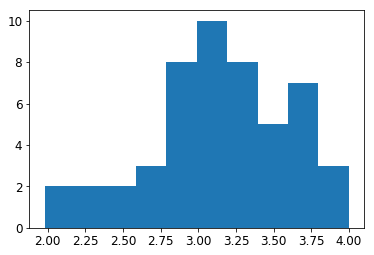

In [9]:
plt.hist(male_data["GPA"], bins = 10)

(array([  1.,   1.,   2.,   2.,   8.,   8.,   4.,  11.,   5.,  11.]),
 array([ 1.62 ,  1.858,  2.096,  2.334,  2.572,  2.81 ,  3.048,  3.286,
         3.524,  3.762,  4.   ]),
 <a list of 10 Patch objects>)

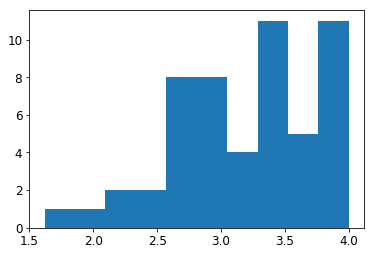

In [10]:
plt.hist(female_data["GPA"], bins = 10)

(array([  1.,   3.,   4.,   4.,  15.,  16.,  13.,  20.,  13.,  14.]),
 array([ 1.62 ,  1.858,  2.096,  2.334,  2.572,  2.81 ,  3.048,  3.286,
         3.524,  3.762,  4.   ]),
 <a list of 10 Patch objects>)

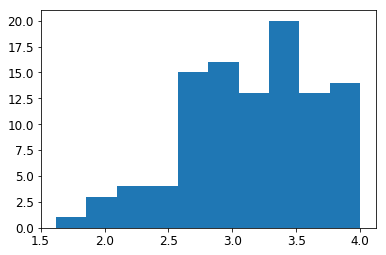

In [11]:
plt.hist(combined_data["GPA"], bins = 10)

In [12]:
# Add histogram data
x_1 = male_data["GPA"]
x_2 = female_data["GPA"]
x_3 = combined_data["GPA"]

# Group data together
hist_data = [x_1, x_2, x_3]

group_labels = ['Male GPA', 'Female GPA', 'Total GPA']

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=0.1)

# Plot!
py.iplot(fig, filename='Distplot with Multiple Datasets')

In [13]:
male_data.describe()

,GPA,Extracurricular Hours,Number of Courses,Classes missed,Studying Hours,Happiness,Employment Hours,Commute Hours,Relationship Hours
count,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000
mean,3.123800,4.930000,4.380000,7.100000,23.890000,3.000000,5.080000,5.484200,12.140000
std,0.473234,5.460442,0.945235,7.804368,25.359515,1.087968,11.568942,4.678884,34.005408
min,1.980000,0.000000,2.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,2.817500,0.500000,4.000000,2.000000,5.750000,2.000000,0.000000,1.350000,0.000000
50%,3.100000,4.000000,4.000000,4.000000,17.500000,3.000000,0.000000,5.000000,0.000000
75%,3.477500,6.375000,5.000000,9.500000,30.000000,3.750000,6.500000,8.000000,4.750000
max,4.000000,28.000000,6.000000,30.000000,120.000000,5.000000,70.000000,18.000000,184.000000


In [14]:
female_data.describe()

,GPA,Extracurricular Hours,Number of Courses,Classes missed,Studying Hours,Happiness,Employment hours,Commute Hours,Relationship Hours
count,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000
mean,3.212823,5.707547,4.773585,5.528302,18.216981,3.226415,4.905660,4.960377,12.396226
std,0.543054,6.509190,0.823723,5.960136,12.626860,1.031084,7.660498,5.180152,33.675681
min,1.620000,0.000000,2.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,2.780000,2.000000,4.000000,1.000000,10.000000,3.000000,0.000000,0.500000,0.000000
50%,3.300000,4.000000,5.000000,4.000000,14.000000,3.000000,0.000000,4.000000,0.000000
75%,3.740000,6.000000,5.000000,8.000000,28.000000,4.000000,10.000000,9.000000,5.000000
max,4.000000,36.000000,6.000000,32.000000,60.000000,5.000000,30.000000,30.000000,184.000000


In [15]:
combined_data.describe()

,Extracurricular Hours,Number of Courses,Classes missed,Studying Hours,Happiness,Employment Hours,Commute Hours,Relationship Hours,GPA
count,103.000000,103.000000,103.000000,103.000000,103.000000,103.000000,103.000000,103.000000,103.000000
mean,5.330097,4.582524,6.291262,20.970874,3.116505,4.990291,5.214660,12.271845,3.169608
std,6.006350,0.902331,6.927681,19.958514,1.059976,9.706724,4.926053,33.670023,0.509832
min,0.000000,2.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.620000
25%,2.000000,4.000000,2.000000,10.000000,2.000000,0.000000,1.150000,0.000000,2.800000
50%,4.000000,5.000000,4.000000,15.000000,3.000000,0.000000,4.000000,0.000000,3.200000
75%,6.000000,5.000000,8.500000,30.000000,4.000000,7.250000,8.500000,5.000000,3.580000
max,36.000000,6.000000,32.000000,120.000000,5.000000,70.000000,30.000000,184.000000,4.000000


In [16]:
corr_male_data = male_data.corr()
corr_male_data.style.background_gradient()

,GPA,Extracurricular Hours,Number of Courses,Classes missed,Studying Hours,Happiness,Employment Hours,Commute Hours,Relationship Hours
GPA,1,0.0358026,0.272272,-0.303026,0.387521,0.184317,-0.226996,-0.111029,0.0180885
Extracurricular Hours,0.0358026,1,0.262269,-0.191629,0.0272083,0.133975,0.16792,0.25545,-0.0618242
Number of Courses,0.272272,0.262269,1,-0.0993164,-0.000774755,0.0595346,-0.0326967,0.118685,-0.0435933
Classes missed,-0.303026,-0.191629,-0.0993164,1,-0.0173183,-0.233143,-0.0402113,0.0313474,0.216954
Studying Hours,0.387521,0.0272083,-0.000774755,-0.0173183,1,0.161251,-0.0575142,-0.131918,-0.00480953
Happiness,0.184317,0.133975,0.0595346,-0.233143,0.161251,1,0.14917,-0.271937,0.0375102
Employment Hours,-0.226996,0.16792,-0.0326967,-0.0402113,-0.0575142,0.14917,1,0.208838,-0.0744704
Commute Hours,-0.111029,0.25545,0.118685,0.0313474,-0.131918,-0.271937,0.208838,1,-0.176522
Relationship Hours,0.0180885,-0.0618242,-0.0435933,0.216954,-0.00480953,0.0375102,-0.0744704,-0.176522,1


In [17]:
corr_female_data = female_data.corr()
corr_female_data.style.background_gradient()

,GPA,Extracurricular Hours,Number of Courses,Classes missed,Studying Hours,Happiness,Employment hours,Commute Hours,Relationship Hours
GPA,1,-0.0315586,0.139026,-0.339015,0.195183,0.0486502,-0.0410907,0.11999,0.00565062
Extracurricular Hours,-0.0315586,1,-0.0628001,-0.151589,-0.0584679,0.127534,-0.0788544,0.203486,0.0608539
Number of Courses,0.139026,-0.0628001,1,0.0287497,0.217441,-0.142262,-0.314306,-0.215767,-0.411276
Classes missed,-0.339015,-0.151589,0.0287497,1,0.112159,-0.282699,-0.01742,-0.050945,0.0564248
Studying Hours,0.195183,-0.0584679,0.217441,0.112159,1,-0.236488,-0.159928,0.127483,0.0560999
Happiness,0.0486502,0.127534,-0.142262,-0.282699,-0.236488,1,0.219445,-0.189113,0.0300433
Employment hours,-0.0410907,-0.0788544,-0.314306,-0.01742,-0.159928,0.219445,1,0.3985,-0.0878164
Commute Hours,0.11999,0.203486,-0.215767,-0.050945,0.127483,-0.189113,0.3985,1,-0.134158
Relationship Hours,0.00565062,0.0608539,-0.411276,0.0564248,0.0560999,0.0300433,-0.0878164,-0.134158,1


In [18]:
corr_combined_data = combined_data.corr()
corr_combined_data.style.background_gradient()

,Extracurricular Hours,Number of Courses,Classes missed,Studying Hours,Happiness,Employment Hours,Commute Hours,Relationship Hours,GPA
Extracurricular Hours,1,0.102556,-0.173743,-0.0146194,0.135571,0.0524366,0.220714,0.0066055,0.00164348
Number of Courses,0.102556,1,-0.069754,0.0322535,-0.0101508,-0.137027,-0.060566,-0.212755,0.21531
Classes missed,-0.173743,-0.069754,1,0.0354796,-0.262342,-0.0309387,-0.00129847,0.142898,-0.320596
Studying Hours,-0.0146194,0.0322535,0.0354796,1,0.0115158,-0.0812615,-0.0256191,0.0145864,0.274095
Happiness,0.135571,-0.0101508,-0.262342,0.0115158,1,0.17258,-0.231708,0.0339909,0.119465
Employment Hours,0.0524366,-0.137027,-0.0309387,-0.0812615,0.17258,1,0.282654,-0.0784351,-0.139038
Commute Hours,0.220714,-0.060566,-0.00129847,-0.0256191,-0.231708,0.282654,1,-0.153486,0.0168107
Relationship Hours,0.0066055,-0.212755,0.142898,0.0145864,0.0339909,-0.0784351,-0.153486,1,0.0115503
GPA,0.00164348,0.21531,-0.320596,0.274095,0.119465,-0.139038,0.0168107,0.0115503,1


In [19]:
male_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 9 columns):
GPA                      50 non-null float64
Extracurricular Hours    50 non-null float64
Number of Courses        50 non-null int64
Classes missed           50 non-null int64
Studying Hours           50 non-null float64
Happiness                50 non-null int64
Employment Hours         50 non-null float64
Commute Hours            50 non-null float64
Relationship Hours       50 non-null int64
dtypes: float64(5), int64(4)
memory usage: 3.6 KB


In [20]:
male_data = male_data[['GPA', 'Extracurricular Hours', 'Number of Courses', 'Classes missed', 'Studying Hours',
                       'Happiness', 'Employment Hours', 'Commute Hours', 'Relationship Hours']]

In [21]:
female_data = female_data[['GPA', 'Extracurricular Hours', 'Number of Courses', 'Classes missed', 'Studying Hours', 
        'Happiness', 'Employment hours', 'Commute Hours', 'Relationship Hours']]

In [22]:
combined_data = combined_data[['GPA', 'Extracurricular Hours', 'Number of Courses', 'Classes missed', 'Studying Hours', 
        'Happiness', 'Employment Hours', 'Commute Hours', 'Relationship Hours', 'Gender']]

# Prepare Data

## Turn happiness values into text

In [23]:
male_data['Happiness'] = male_data['Happiness'].map({5 : 'Very Happy' , 4 : 'Happy',  3 : "Content",  2 : "Unhappy", 1:  "Very Unhappy"})

In [24]:
female_data['Happiness'] = female_data['Happiness'].map({5 : 'Very Happy' , 4 : 'Happy',  3 : "Content",  2 : "Unhappy", 1:  "Very Unhappy"})

In [25]:
combined_data['Happiness'] = combined_data['Happiness'].map({5 : 'Very Happy' , 4 : 'Happy',  3 : "Content",  2 : "Unhappy", 1:  "Very Unhappy"})

## Binarize Happiness

In [26]:
male_data = pd.concat([male_data, pd.get_dummies(male_data["Happiness"], prefix = "Happiness")], axis = 1)
male_data = male_data.drop("Happiness", axis = 1)

In [27]:
female_data = pd.concat([female_data, pd.get_dummies(female_data["Happiness"], prefix = "Happiness")], axis = 1)
female_data = female_data.drop("Happiness", axis = 1)

In [28]:
combined_data = pd.concat([combined_data, pd.get_dummies(combined_data["Happiness"], prefix = "Happiness")], axis = 1)
combined_data = combined_data.drop("Happiness", axis = 1)

## Binarize gender

In [29]:
combined_data = pd.concat([combined_data, pd.get_dummies(combined_data["Gender"], prefix = "Gender")], axis = 1)
combined_data = combined_data.drop("Gender", axis = 1)

In [30]:
combined_data

,GPA,Extracurricular Hours,Number of Courses,Classes missed,Studying Hours,Employment Hours,Commute Hours,Relationship Hours,Happiness_Content,Happiness_Happy,Happiness_Unhappy,Happiness_Very Happy,Happiness_Very Unhappy,Gender_Female,Gender_Male
0,3.10,2.0,4,30,25.0,0.0,2.00,10,1,0,0,0,0,0,1
1,3.05,14.0,6,3,30.0,4.0,18.00,0,0,0,1,0,0,0,1
2,3.63,3.0,6,0,10.0,0.0,0.50,0,0,1,0,0,0,0,1
3,2.50,3.0,4,0,26.0,0.0,1.00,0,1,0,0,0,0,0,1
4,4.00,5.0,4,2,120.0,0.0,0.25,0,0,1,0,0,0,0,1
5,4.00,5.0,4,2,120.0,7.0,0.00,0,0,0,0,1,0,0,1
6,3.50,4.0,6,8,8.0,0.0,3.00,140,1,0,0,0,0,0,1
7,2.50,15.0,5,5,3.0,0.0,7.00,0,0,0,0,1,0,0,1
8,3.60,2.0,4,0,0.5,5.0,8.00,0,1,0,0,0,0,0,1
9,3.10,0.0,3,7,2.0,2.5,4.00,0,0,0,0,0,1,0,1


In [31]:
male_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 13 columns):
GPA                       50 non-null float64
Extracurricular Hours     50 non-null float64
Number of Courses         50 non-null int64
Classes missed            50 non-null int64
Studying Hours            50 non-null float64
Employment Hours          50 non-null float64
Commute Hours             50 non-null float64
Relationship Hours        50 non-null int64
Happiness_Content         50 non-null uint8
Happiness_Happy           50 non-null uint8
Happiness_Unhappy         50 non-null uint8
Happiness_Very Happy      50 non-null uint8
Happiness_Very Unhappy    50 non-null uint8
dtypes: float64(5), int64(3), uint8(5)
memory usage: 3.4 KB


# Male Data. Run 1. All Features.

In [32]:
male_feature = list(male_data)
y_male = male_data["GPA"]
x_male_run_1 = male_data.loc[:, "Extracurricular Hours":]
x_male_run_1 = sm.add_constant(x_male_run_1)

In [33]:
y_male.shape

(50,)

In [34]:
model_male = sm.OLS(y_male, x_male_run_1).fit()
print(model_male.summary())

                            OLS Regression Results                            
Dep. Variable:                    GPA   R-squared:                       0.419
Model:                            OLS   Adj. R-squared:                  0.251
Method:                 Least Squares   F-statistic:                     2.489
Date:                Sat, 01 Dec 2018   Prob (F-statistic):             0.0183
Time:                        14:16:22   Log-Likelihood:                -19.468
No. Observations:                  50   AIC:                             62.94
Df Residuals:                      38   BIC:                             85.88
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2

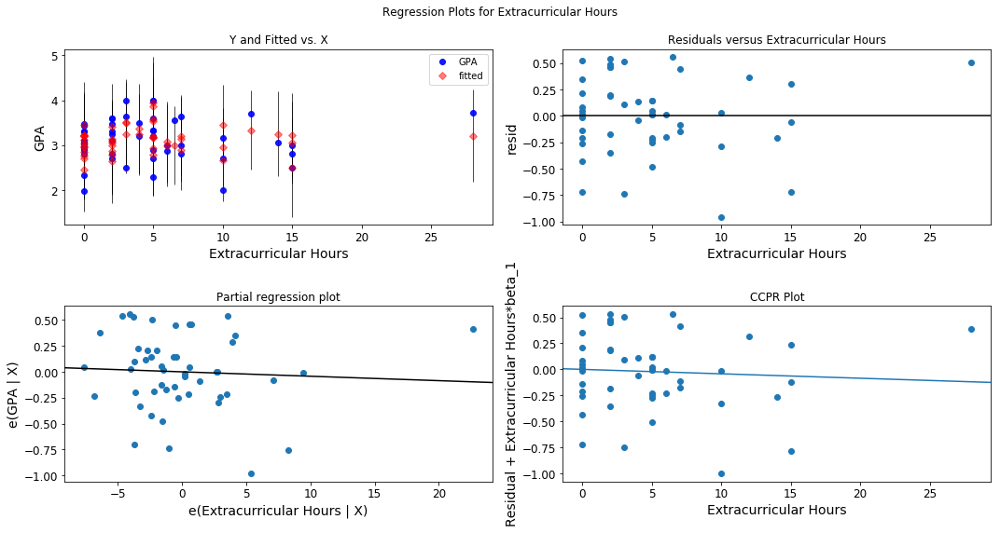

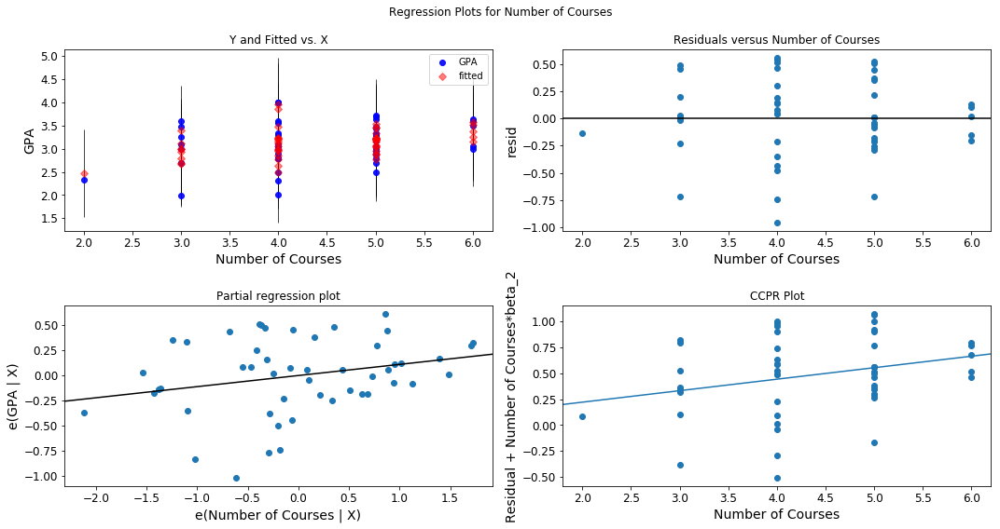

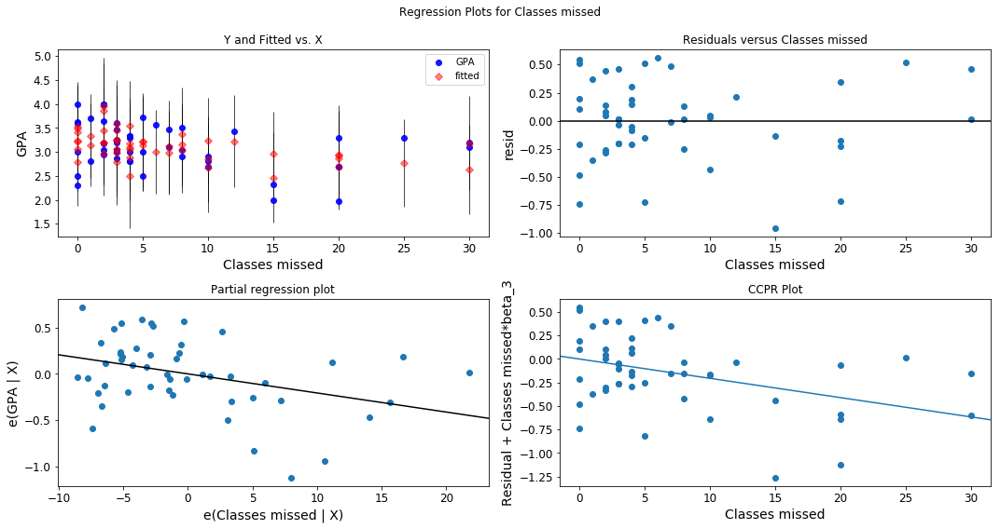

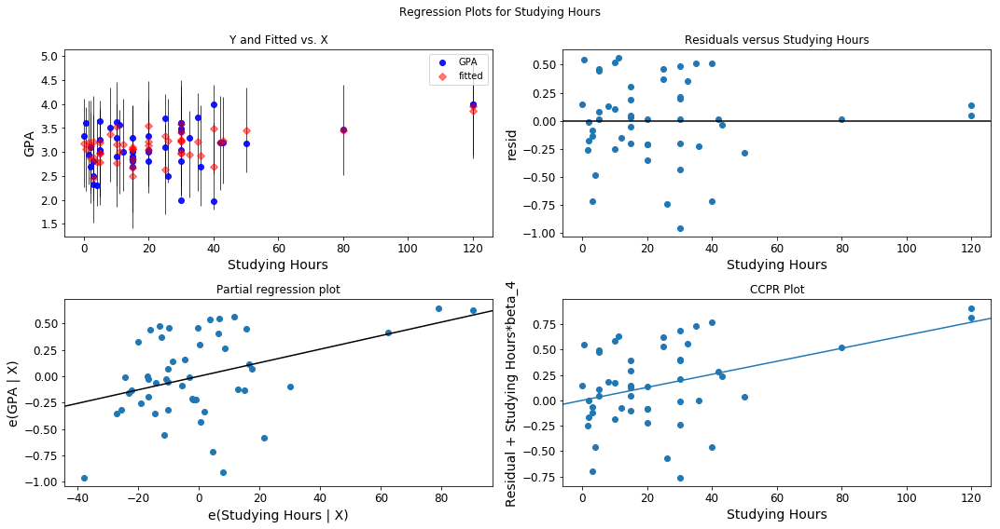

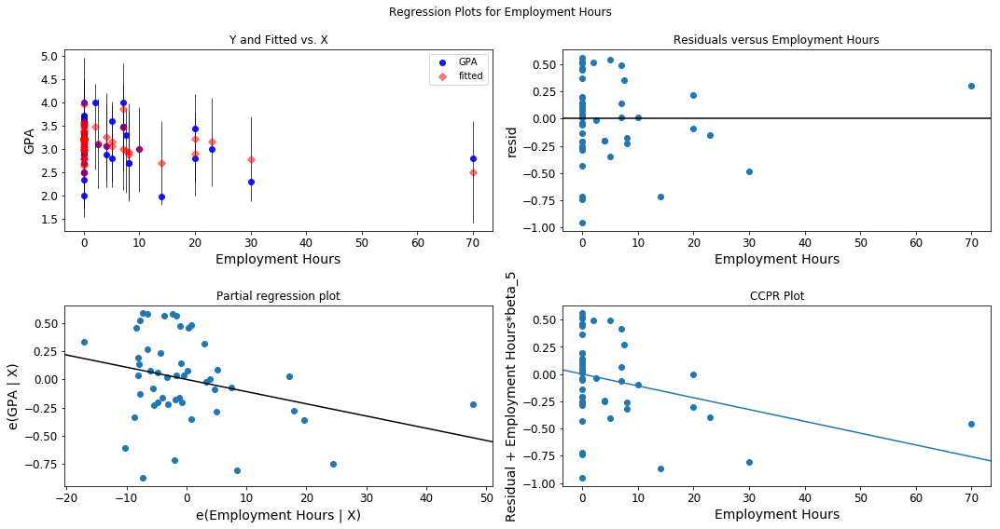

...

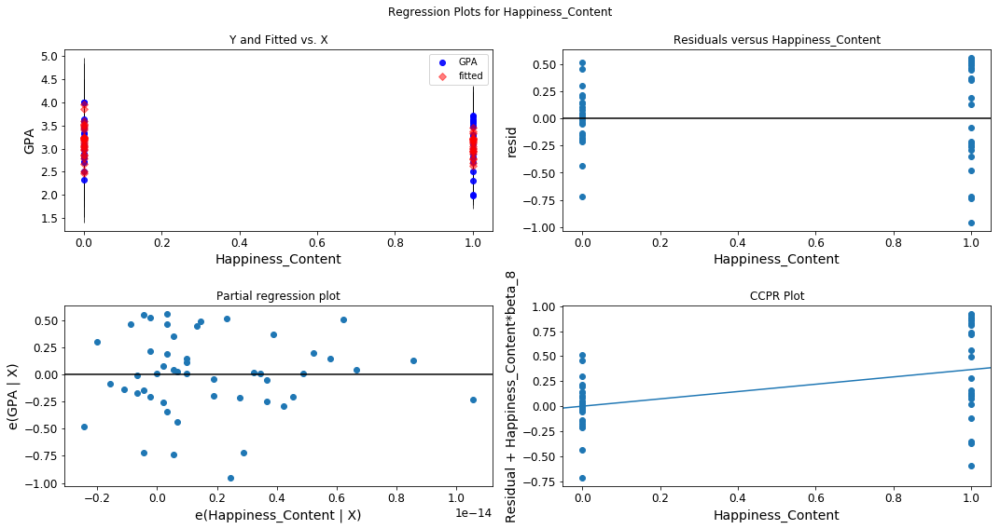

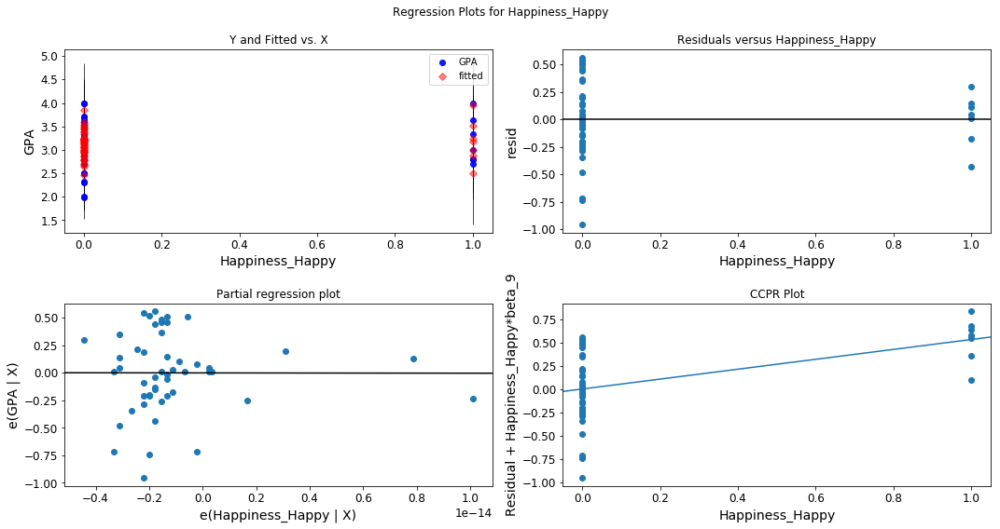

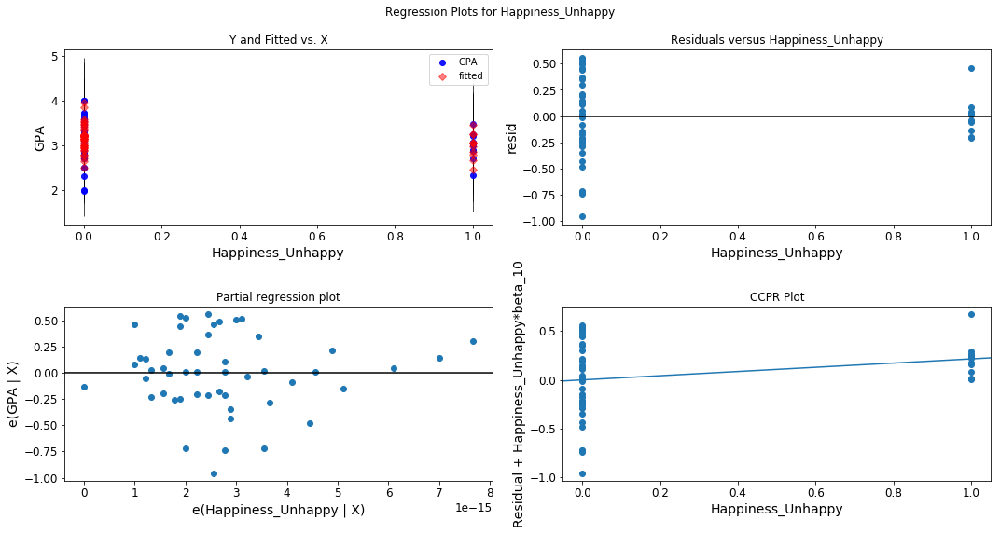

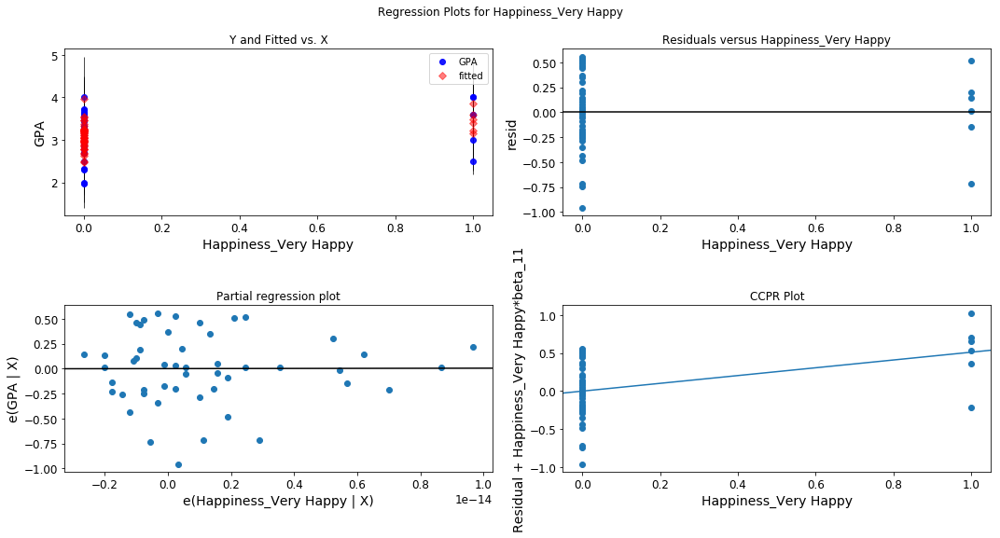

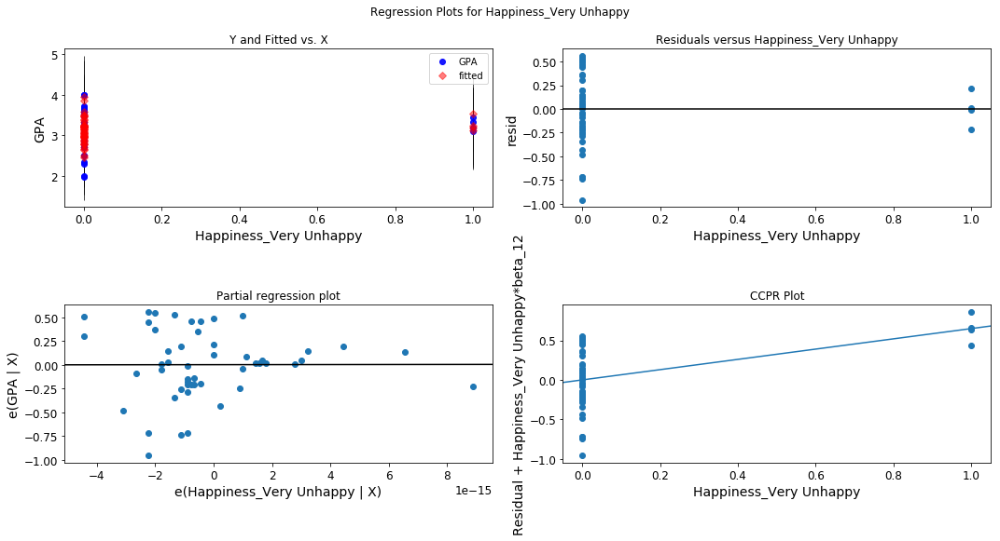

In [35]:
for i in range(1, len(male_feature)):
    fig = plt.figure(figsize=(15,8))
    male_feature = list(x_male_run_1)[i]
    fig = sm.graphics.plot_regress_exog(model_male, male_feature, fig=fig)

# Male Data. Run 2. Drop feature with the highest p-value.

In [36]:
x_male_run_1_to_remove = ['Commute Hours']

x_male_run_2 = x_male_run_1.drop(x_male_run_1_to_remove, axis = 1)

In [37]:
model_male_run_2 = sm.OLS(y_male, x_male_run_2).fit()
print(model_male_run_2.summary())

                            OLS Regression Results                            
Dep. Variable:                    GPA   R-squared:                       0.418
Model:                            OLS   Adj. R-squared:                  0.268
Method:                 Least Squares   F-statistic:                     2.796
Date:                Sat, 01 Dec 2018   Prob (F-statistic):             0.0104
Time:                        14:16:28   Log-Likelihood:                -19.521
No. Observations:                  50   AIC:                             61.04
Df Residuals:                      39   BIC:                             82.07
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2

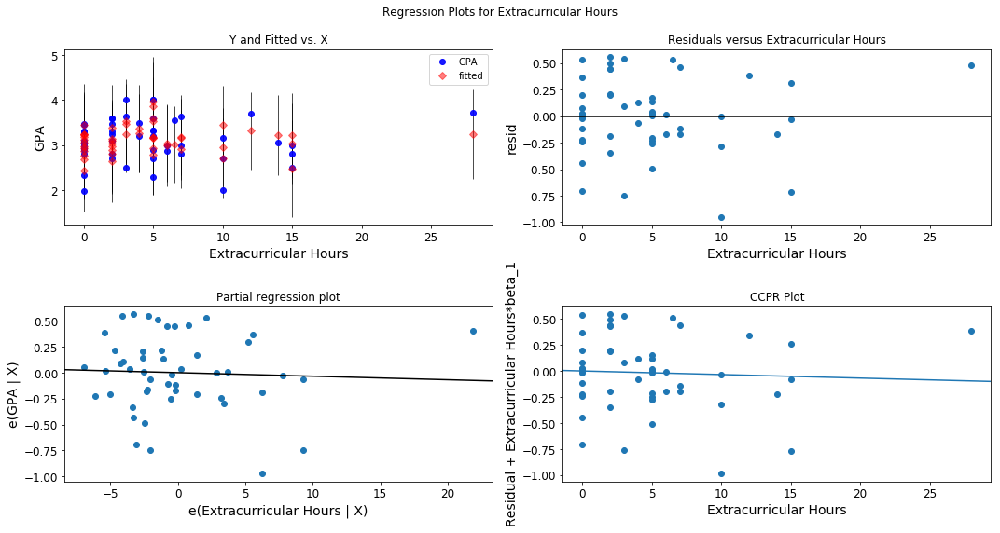

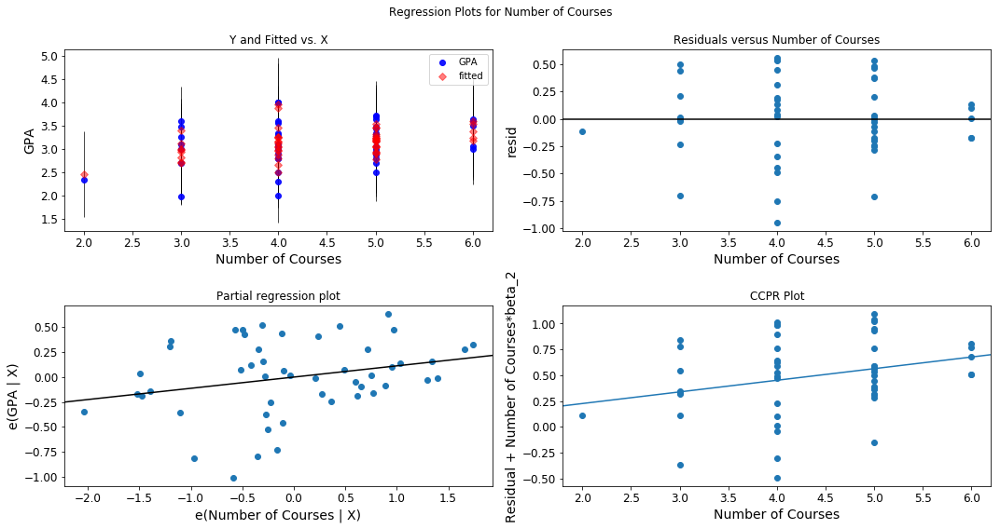

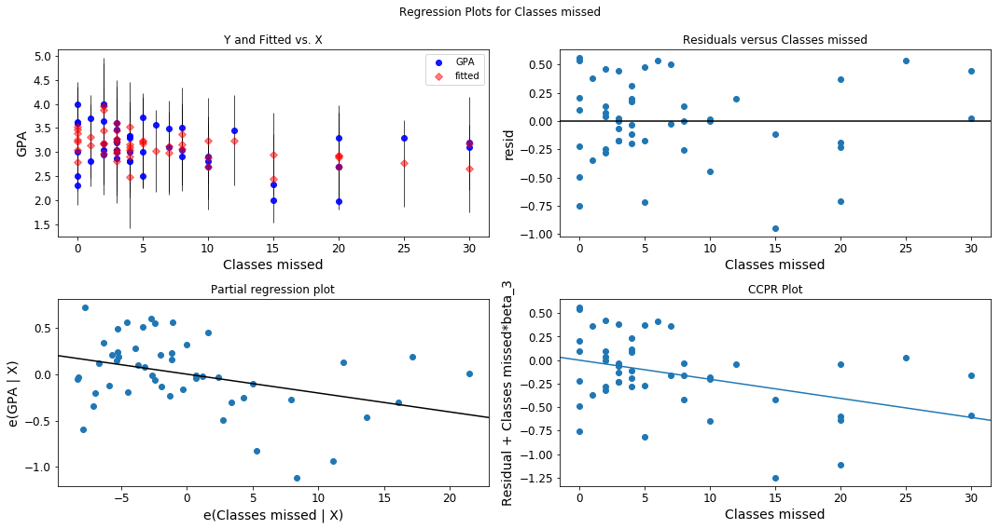

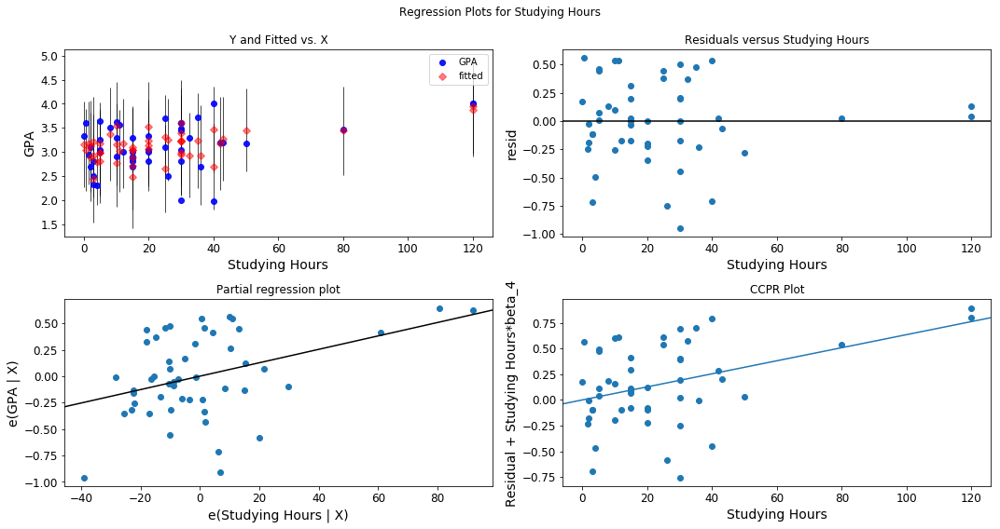

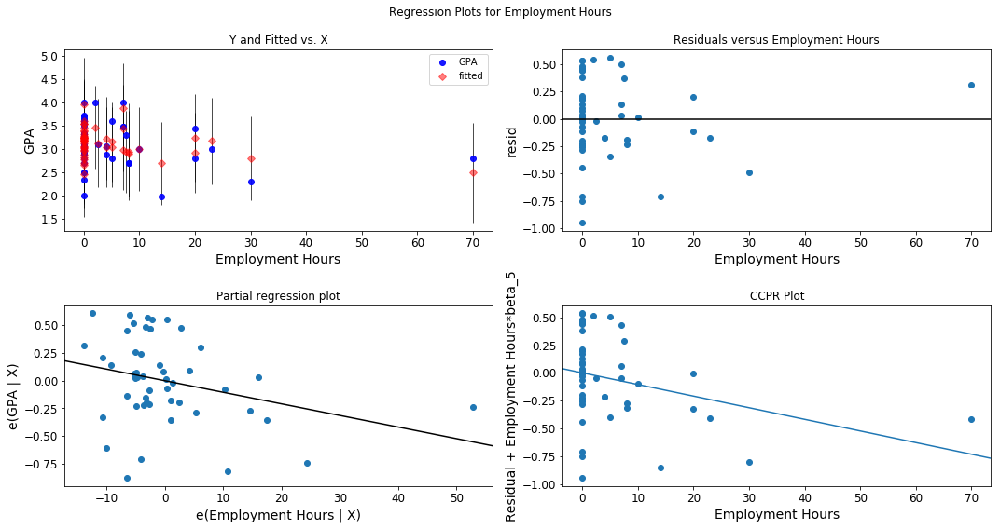

...

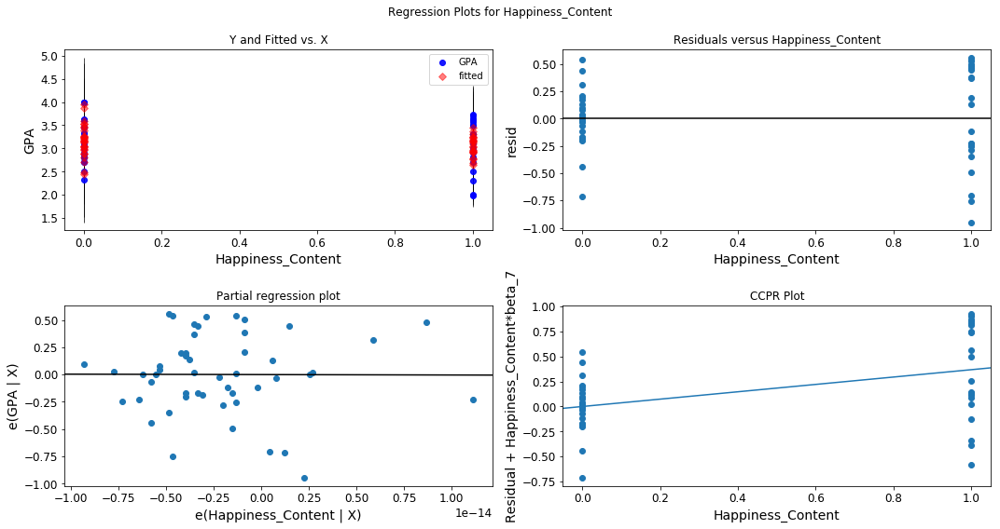

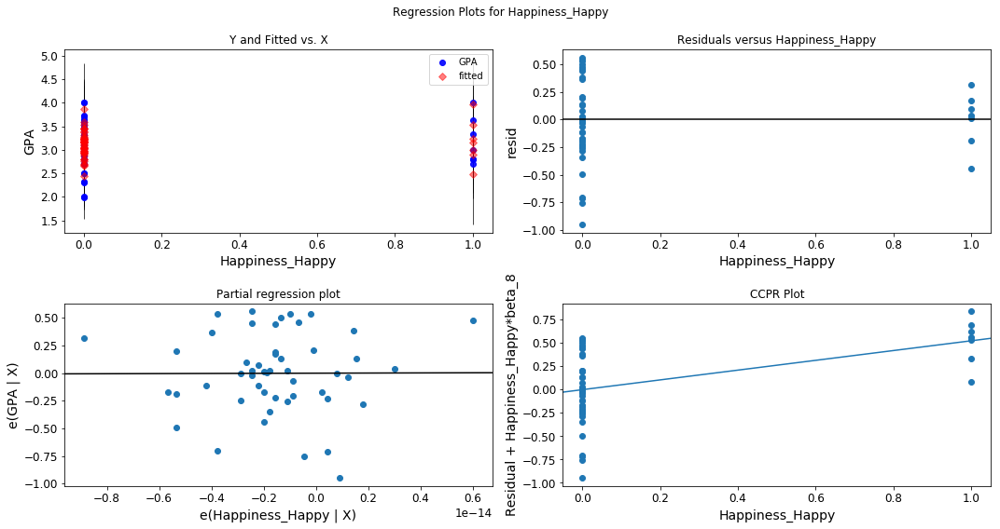

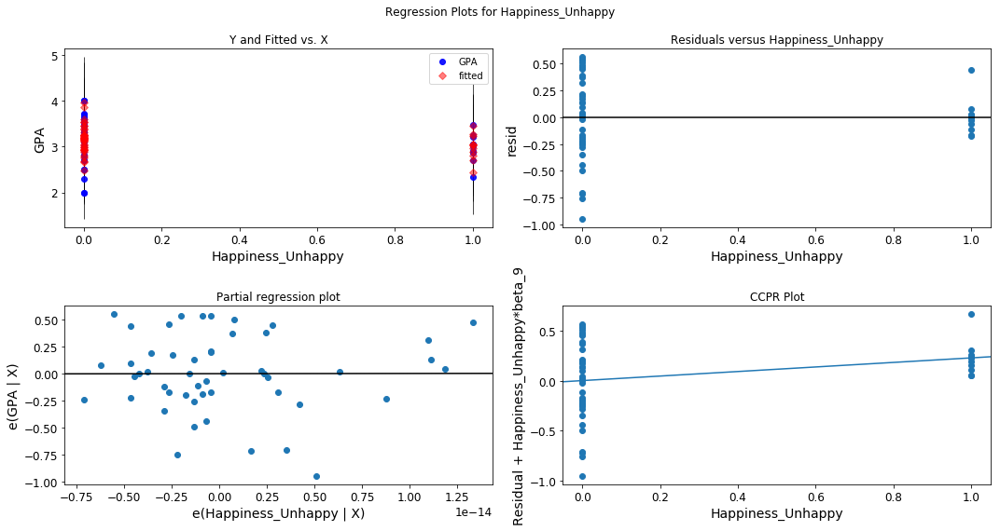

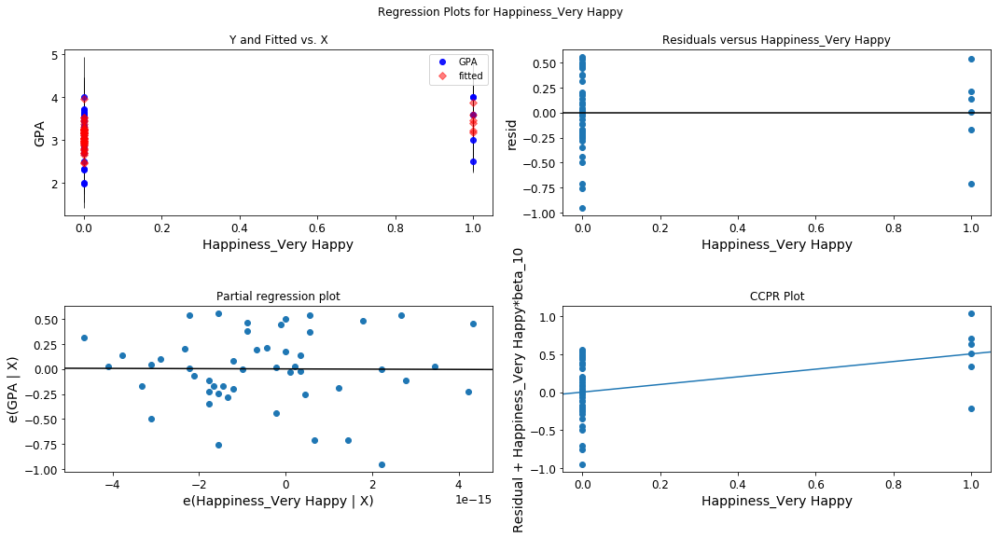

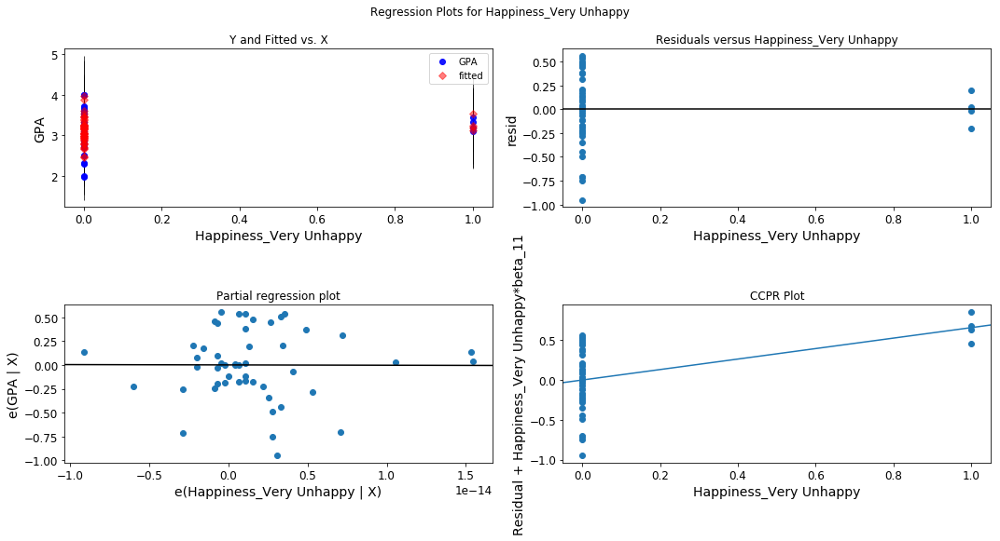

In [38]:
male_features_run_2 = list(x_male_run_2)

for i in range(1, len(male_features_run_2)):
    fig = plt.figure(figsize=(15,8))
    male_feature_run_2 = list(x_male_run_2)[i]
    fig = sm.graphics.plot_regress_exog(model_male_run_2, male_feature_run_2, fig=fig)

# Male Data. Run 3. Drop feature with the highest p-value.

In [39]:
x_male_run_2_to_remove = ['Extracurricular Hours']

In [40]:
x_male_run_3 = x_male_run_2.drop(x_male_run_2_to_remove, axis = 1)

In [41]:
model_male_run_3 = sm.OLS(y_male, x_male_run_3).fit()
print(model_male_run_3.summary())

                            OLS Regression Results                            
Dep. Variable:                    GPA   R-squared:                       0.416
Model:                            OLS   Adj. R-squared:                  0.285
Method:                 Least Squares   F-statistic:                     3.169
Date:                Sat, 01 Dec 2018   Prob (F-statistic):            0.00558
Time:                        14:16:32   Log-Likelihood:                -19.579
No. Observations:                  50   AIC:                             59.16
Df Residuals:                      40   BIC:                             78.28
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2

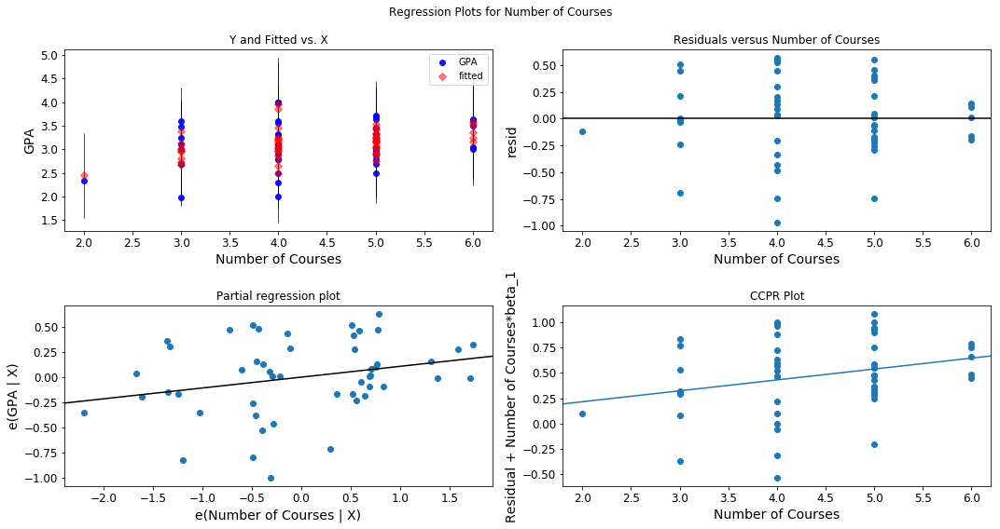

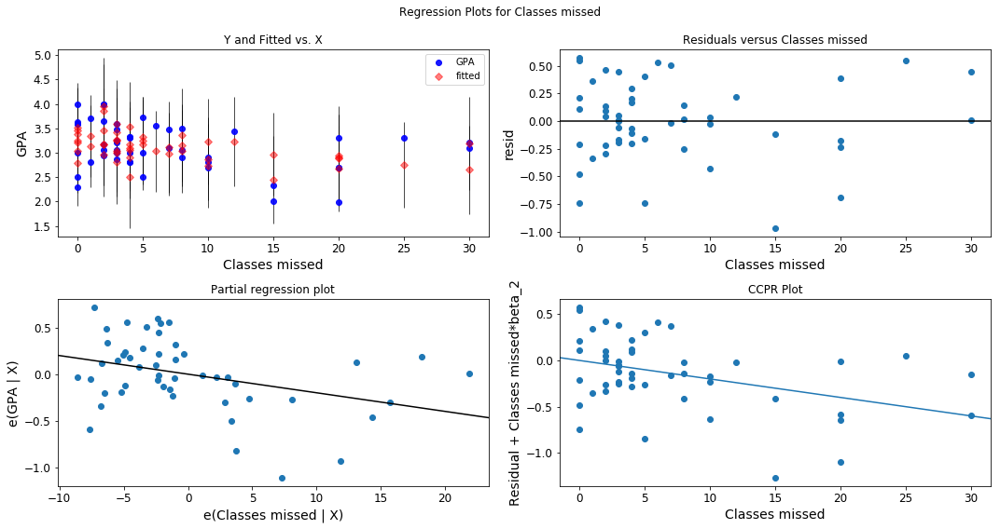

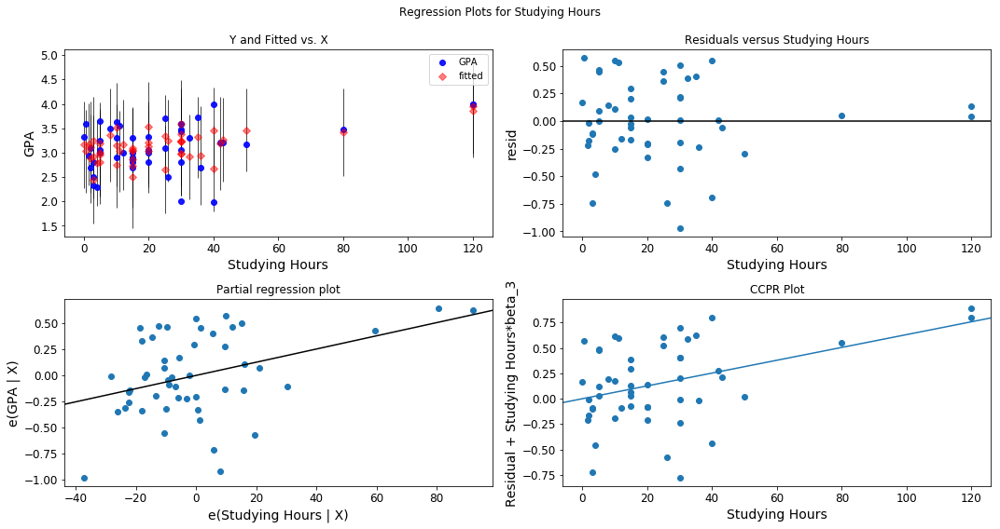

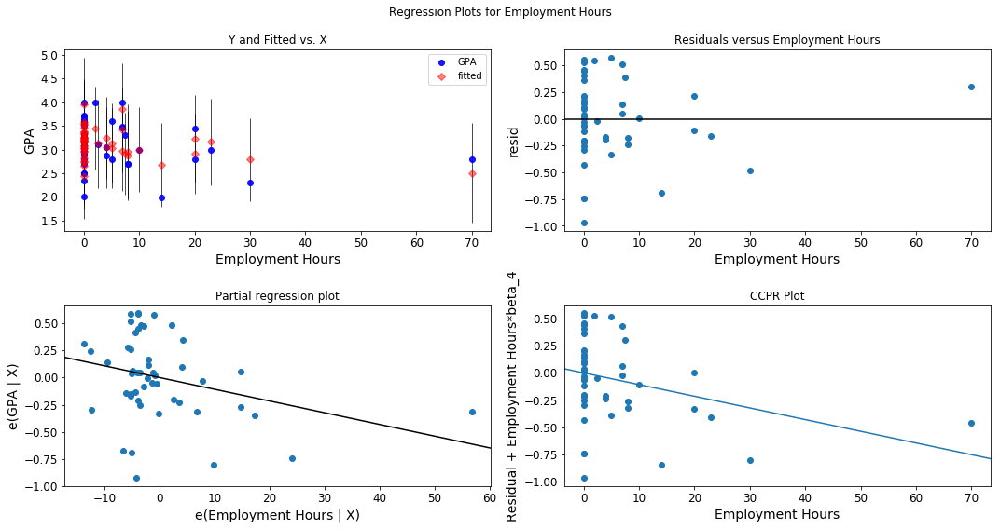

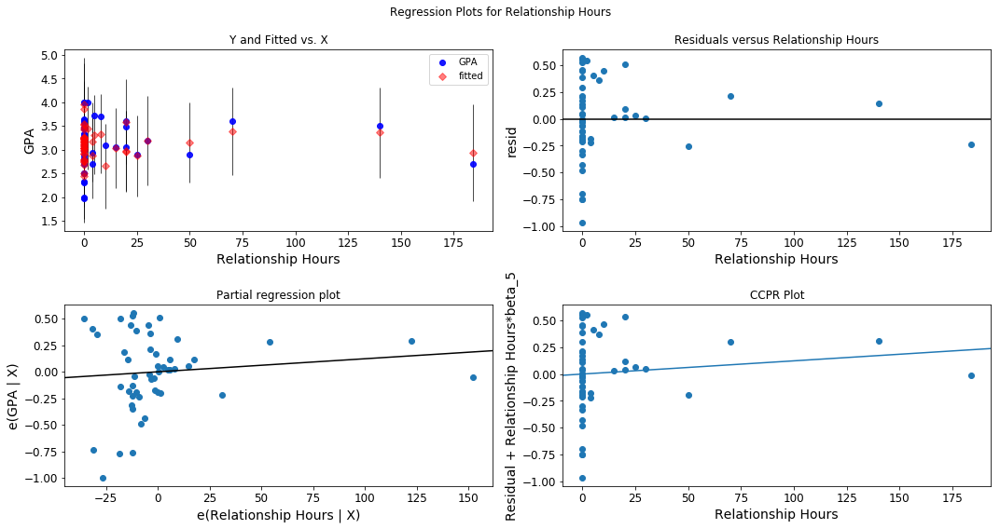

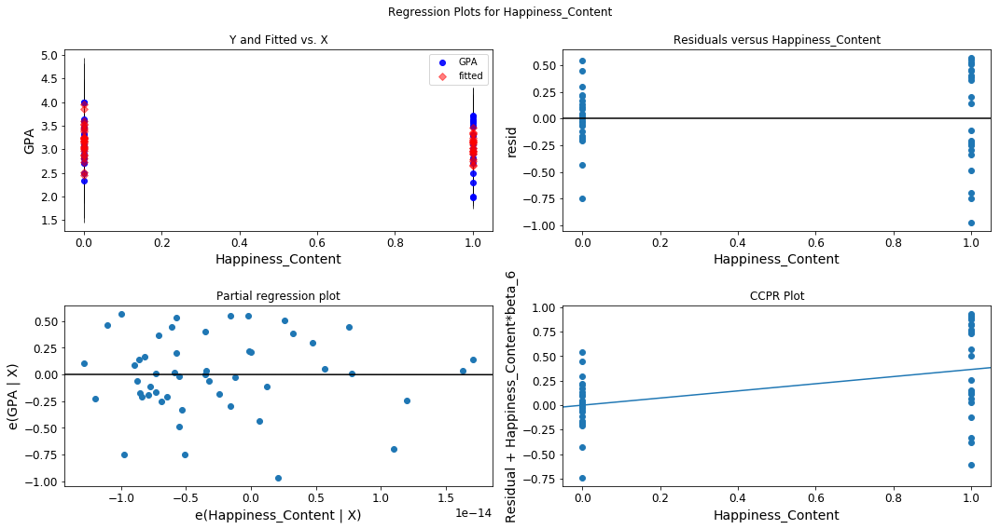

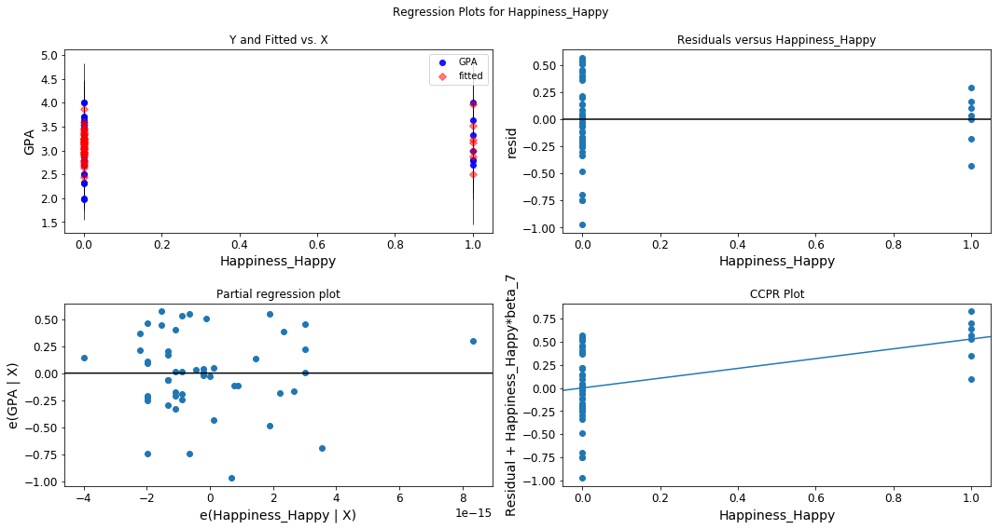

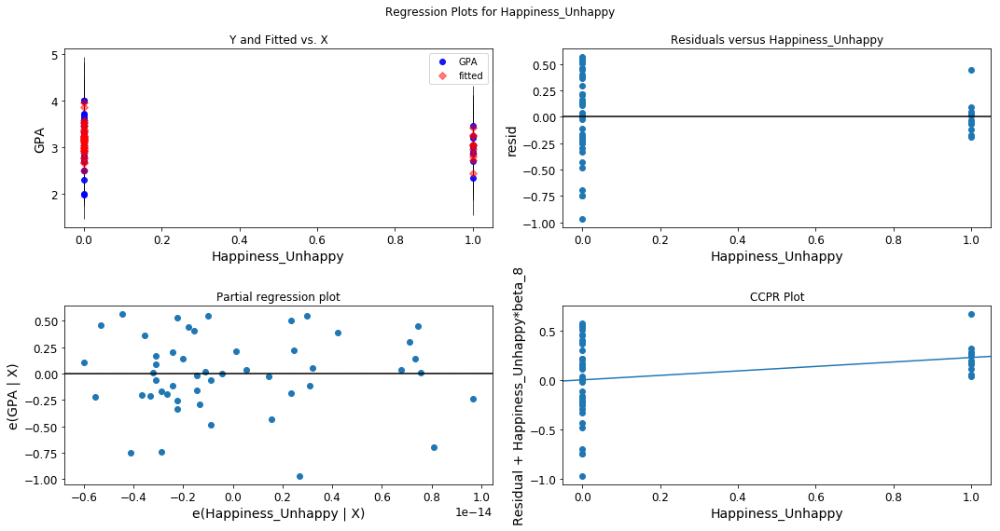

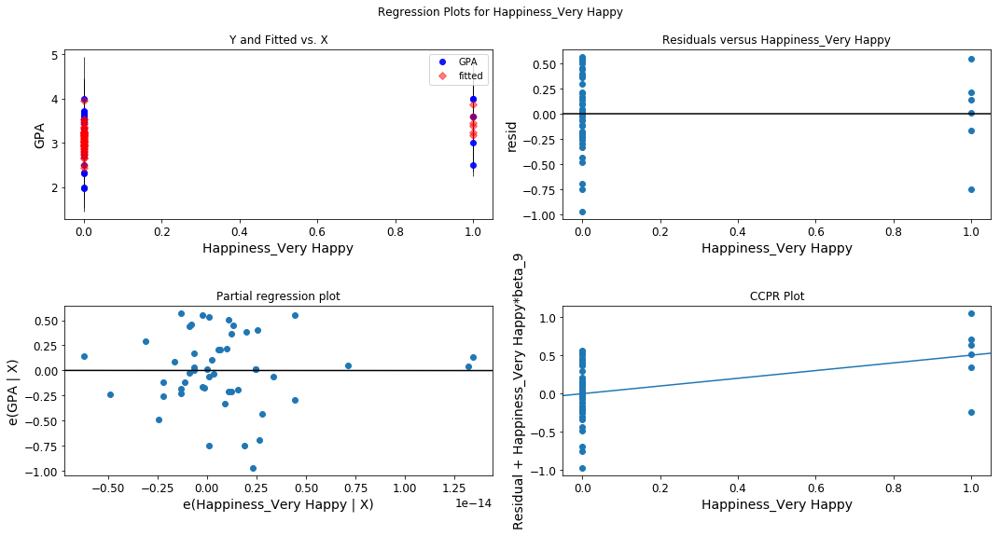

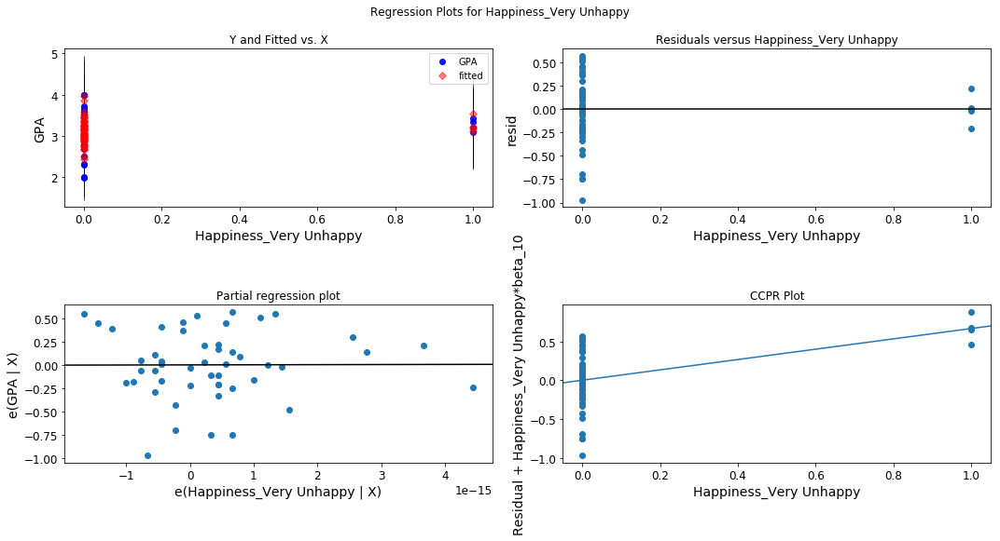

In [42]:
male_features_run_3 = list(x_male_run_3)

for i in range(1, len(male_features_run_3)):
    fig = plt.figure(figsize=(15,8))
    male_feature_run_3 = list(x_male_run_3)[i]
    fig = sm.graphics.plot_regress_exog(model_male_run_3, male_feature_run_3, fig=fig)

# Male Data. Run 4. Drop feature with the highest p-value.

In [43]:
x_male_run_3_to_remove = ['Relationship Hours']

In [44]:
x_male_run_4 = x_male_run_3.drop(x_male_run_3_to_remove, axis = 1)

In [45]:
model_male_run_4 = sm.OLS(y_male, x_male_run_4).fit()
print(model_male_run_4.summary())

                            OLS Regression Results                            
Dep. Variable:                    GPA   R-squared:                       0.409
Model:                            OLS   Adj. R-squared:                  0.294
Method:                 Least Squares   F-statistic:                     3.549
Date:                Sat, 01 Dec 2018   Prob (F-statistic):            0.00330
Time:                        14:16:37   Log-Likelihood:                -19.879
No. Observations:                  50   AIC:                             57.76
Df Residuals:                      41   BIC:                             74.97
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2

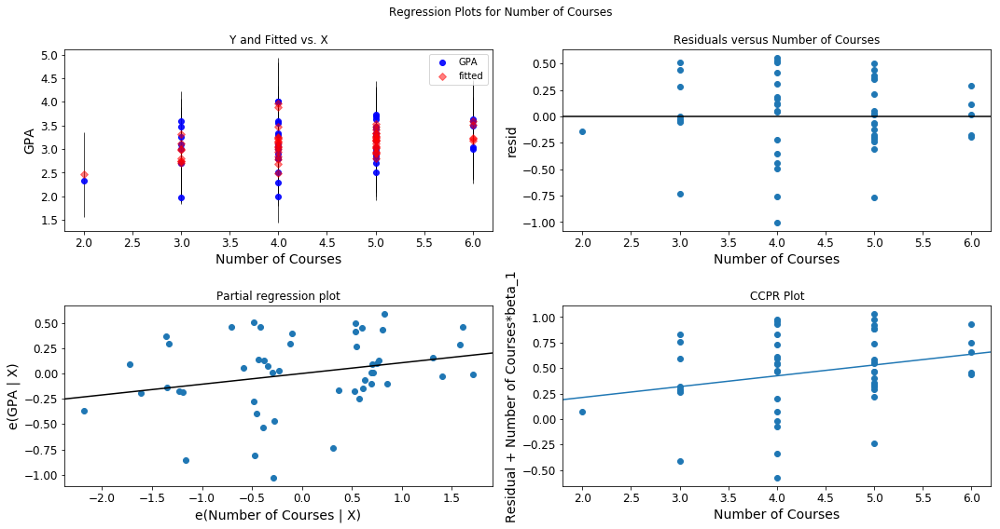

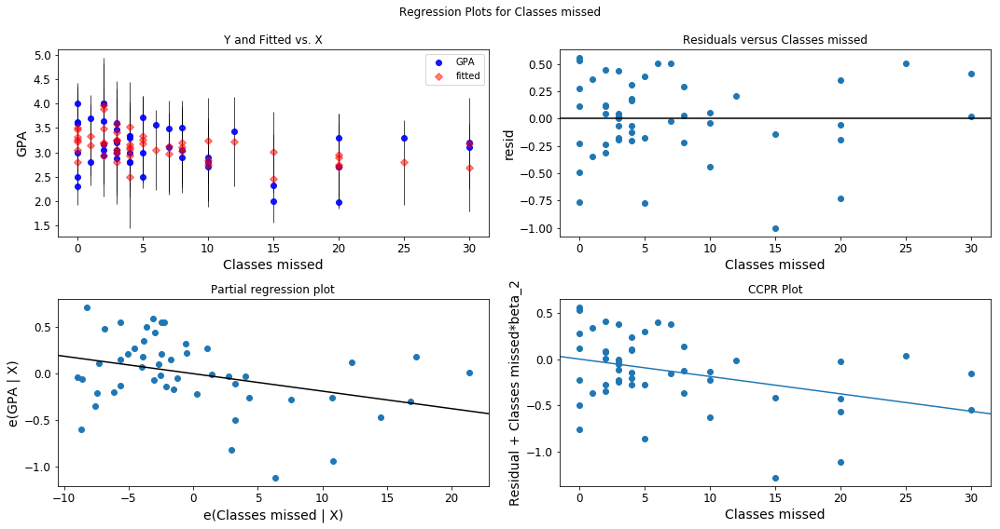

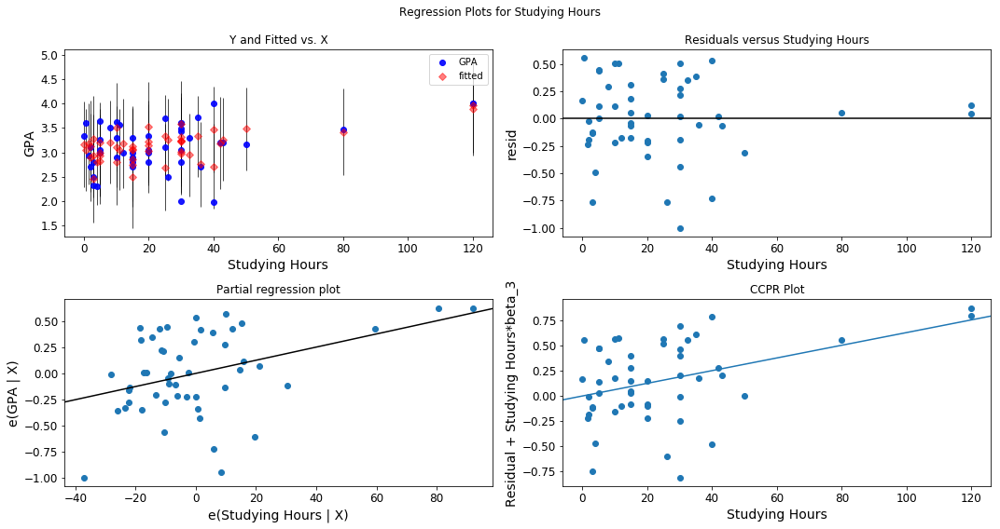

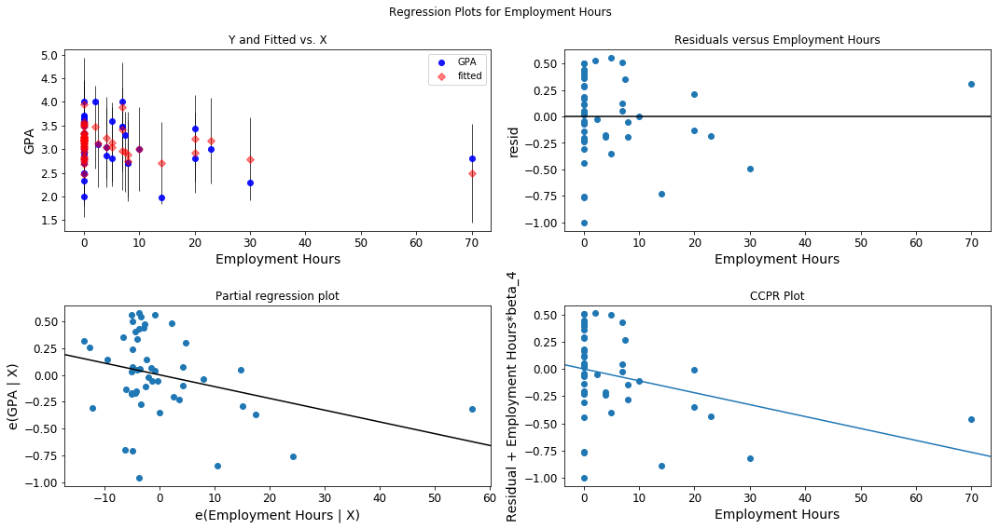

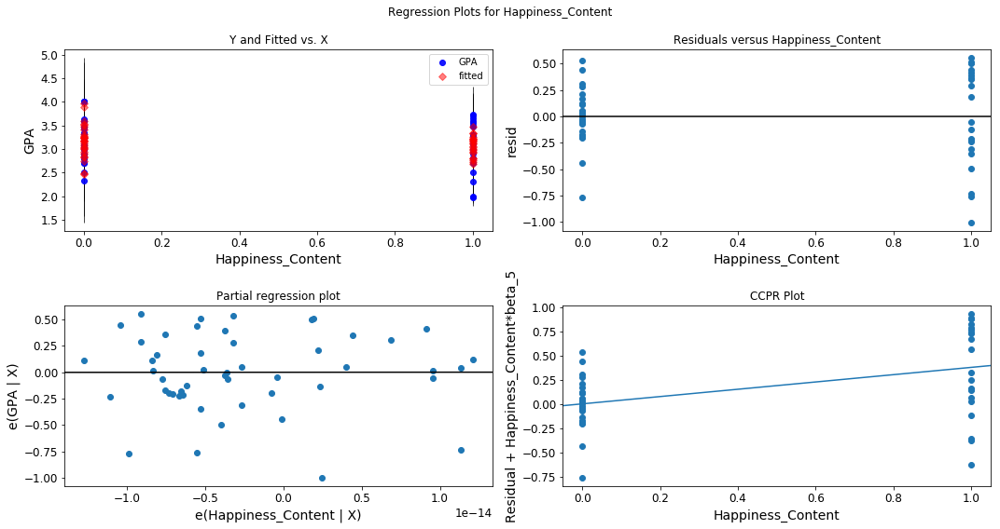

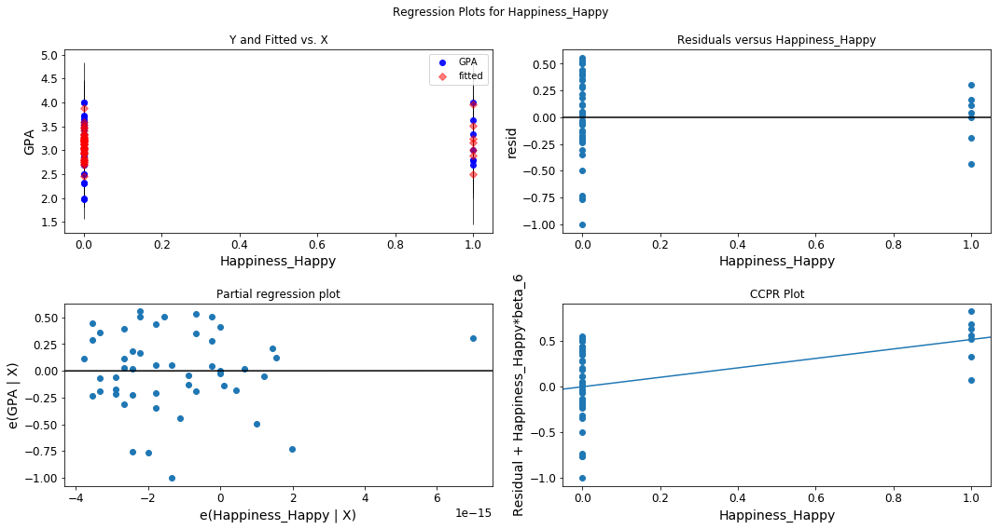

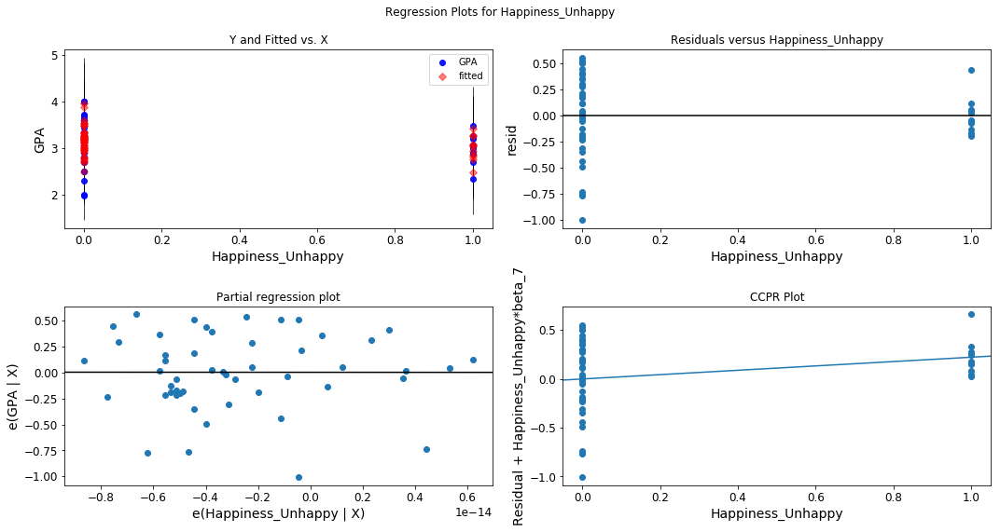

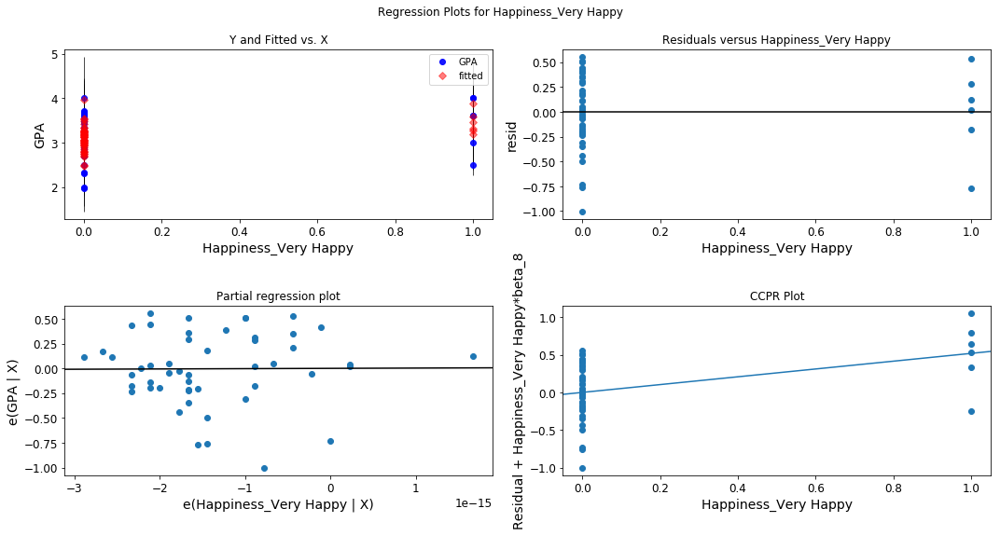

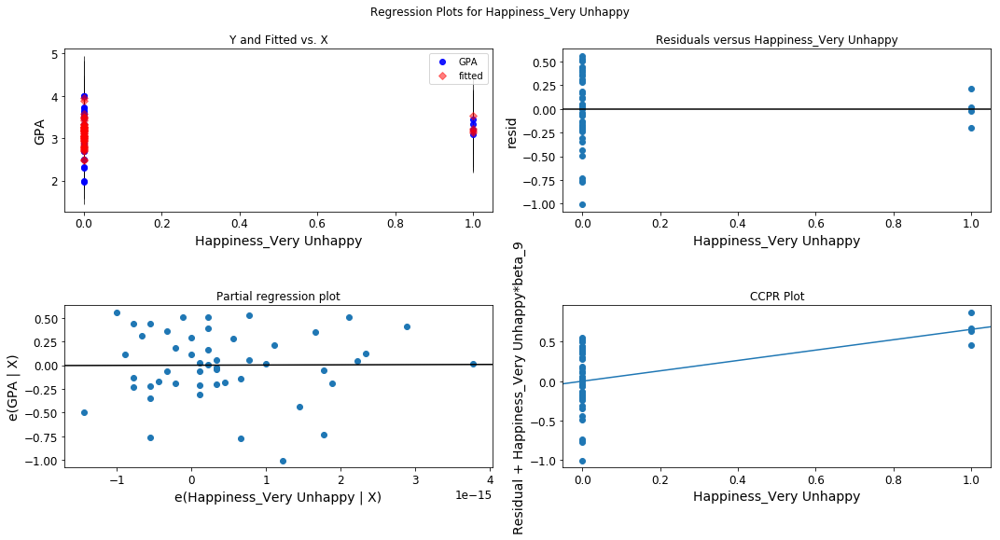

In [46]:
male_features_run_4 = list(x_male_run_4)

for i in range(1, len(male_features_run_4)):
    fig = plt.figure(figsize=(15,8))
    male_feature_run_4 = list(x_male_run_4)[i]
    fig = sm.graphics.plot_regress_exog(model_male_run_4, male_feature_run_4, fig=fig)

# Male Data. Run 5. Drop feature with the highest p-value.

In [47]:
x_male_run_4_to_remove = ['Number of Courses']

In [48]:
x_male_run_5 = x_male_run_4.drop(x_male_run_4_to_remove, axis = 1)

In [49]:
model_male_run_5 = sm.OLS(y_male, x_male_run_5).fit()
print(model_male_run_5.summary())

                            OLS Regression Results                            
Dep. Variable:                    GPA   R-squared:                       0.366
Model:                            OLS   Adj. R-squared:                  0.260
Method:                 Least Squares   F-statistic:                     3.458
Date:                Sat, 01 Dec 2018   Prob (F-statistic):            0.00518
Time:                        14:16:41   Log-Likelihood:                -21.657
No. Observations:                  50   AIC:                             59.31
Df Residuals:                      42   BIC:                             74.61
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2

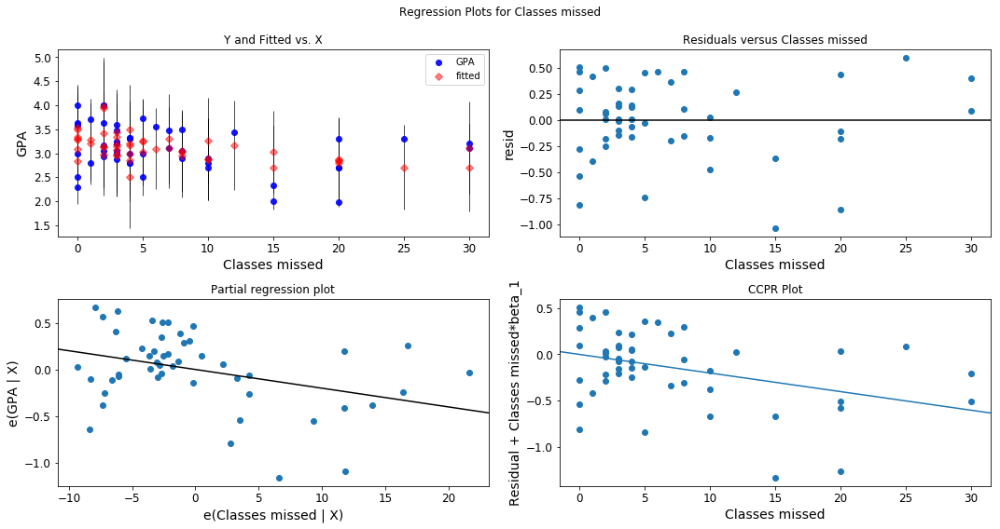

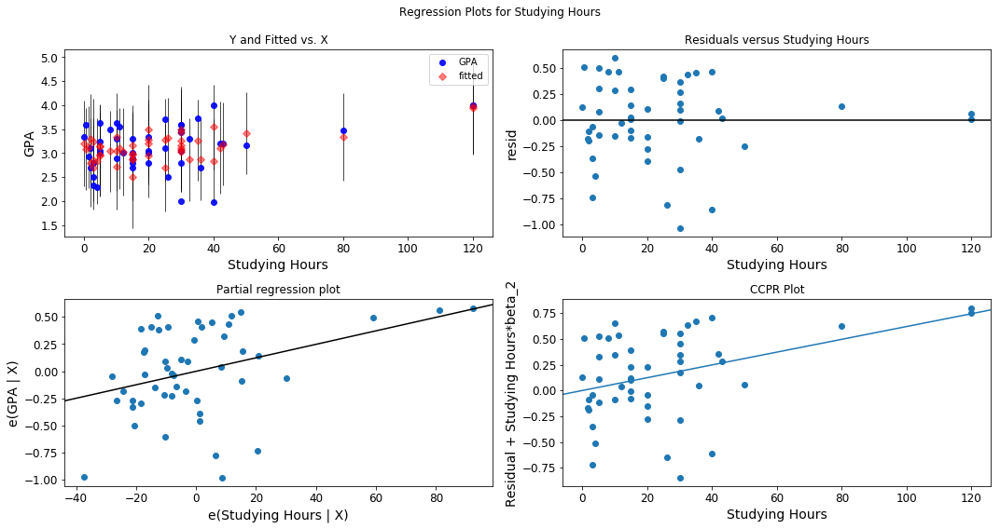

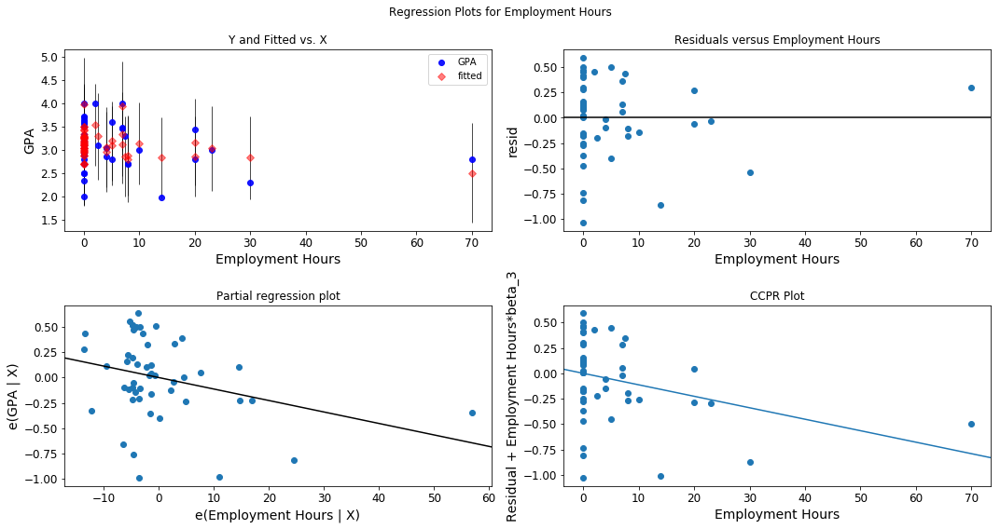

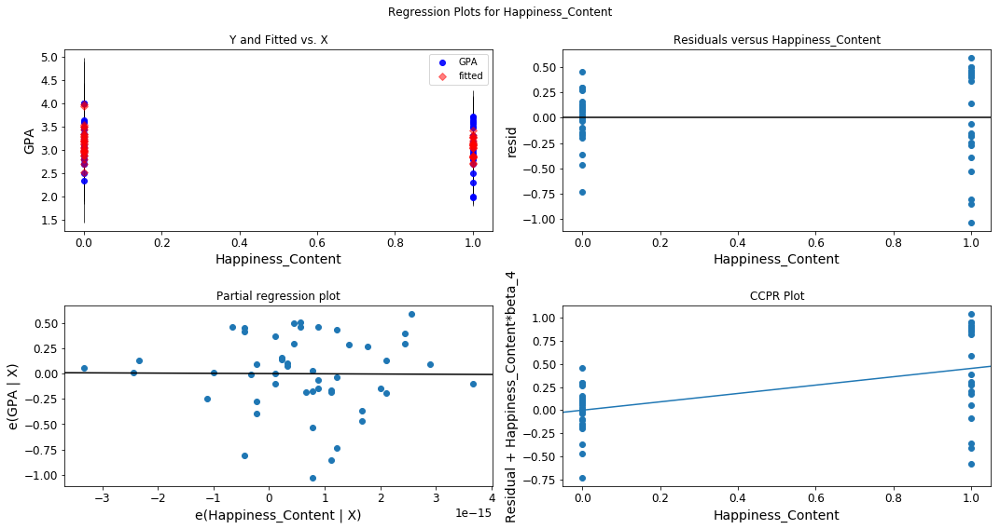

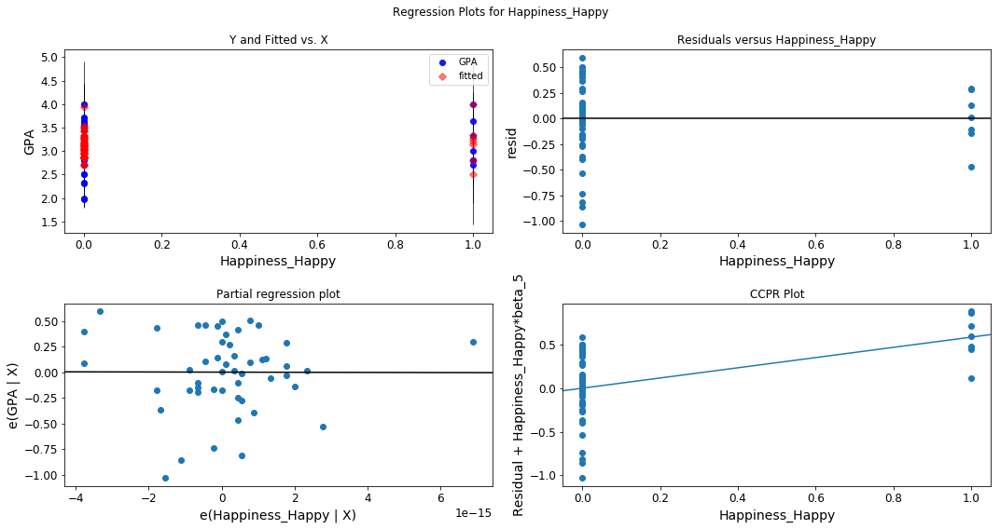

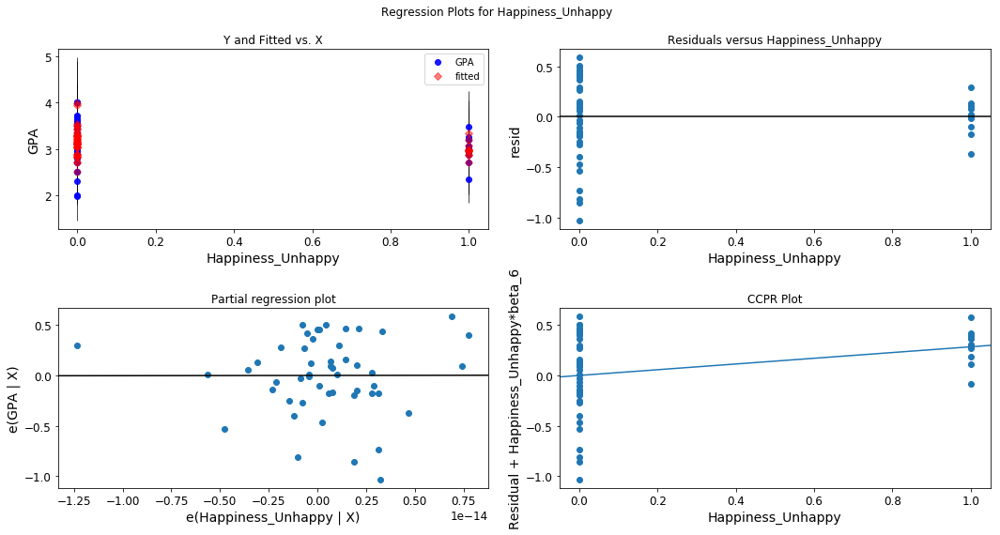

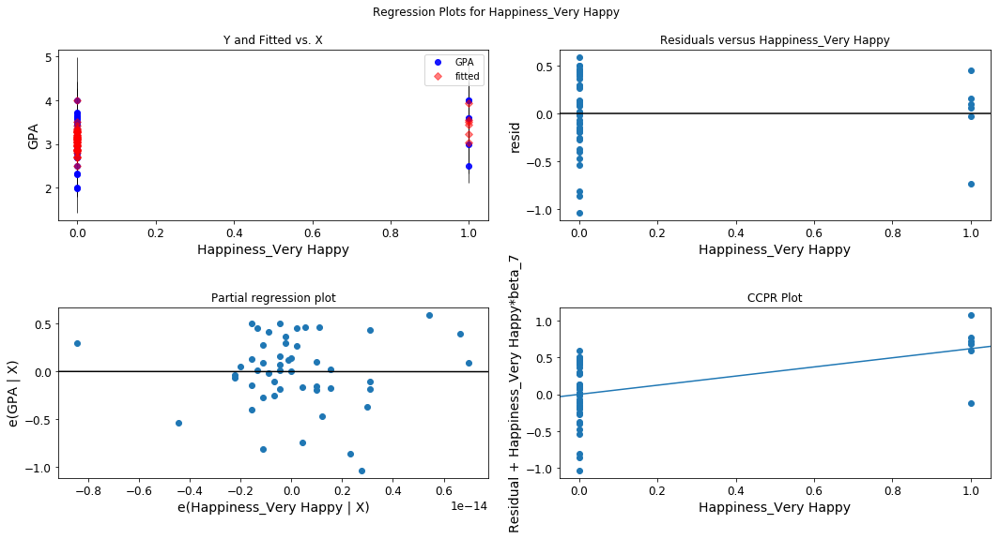

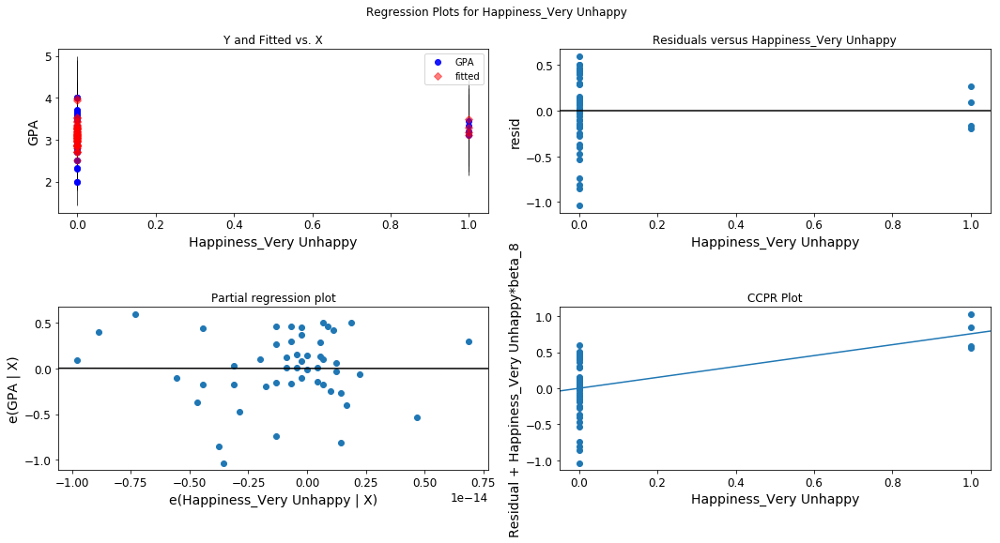

In [50]:
male_features_run_5 = list(x_male_run_5)

for i in range(1, len(male_features_run_5)):
    fig = plt.figure(figsize=(15,8))
    male_feature_run_5 = list(x_male_run_5)[i]
    fig = sm.graphics.plot_regress_exog(model_male_run_5, male_feature_run_5, fig=fig)

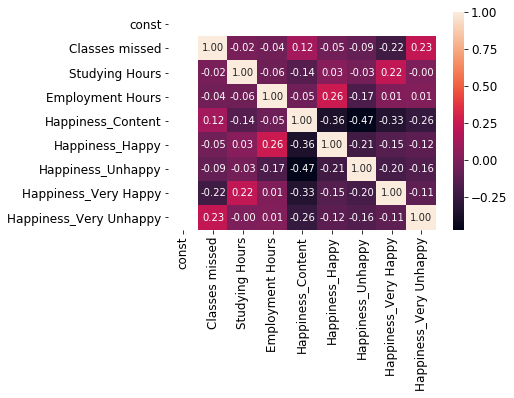

In [138]:
sns.heatmap(x_male_run_5.corr(), annot=True, fmt=".2f")
plt.show()

In [148]:
model_male_run_5.conf_int(alpha=0.05)

,0,1
const,2.507138,2.888264
Classes missed,-0.036094,-0.004159
Studying Hours,0.001414,0.010987
Employment Hours,-0.021963,-0.000664
Happiness_Content,0.265190,0.638658
Happiness_Happy,0.295856,0.878030
Happiness_Unhappy,0.049029,0.519650
Happiness_Very Happy,0.306339,0.933851
Happiness_Very Unhappy,0.381343,1.127456


# Female Data. Run 1. All features.

In [52]:
female_feature_run_1 = list(female_data)
y_female = female_data["GPA"]
x_female_run_1 = female_data.loc[:, "Extracurricular Hours":]
x_female_run_1 = sm.add_constant(x_female_run_1)

In [53]:
y_female.shape

(53,)

In [54]:
model_female_run_1 = sm.OLS(y_female, x_female_run_1).fit()
print(model_female_run_1.summary())

                            OLS Regression Results                            
Dep. Variable:                    GPA   R-squared:                       0.236
Model:                            OLS   Adj. R-squared:                  0.031
Method:                 Least Squares   F-statistic:                     1.153
Date:                Sat, 01 Dec 2018   Prob (F-statistic):              0.348
Time:                        14:16:47   Log-Likelihood:                -35.196
No. Observations:                  53   AIC:                             94.39
Df Residuals:                      41   BIC:                             118.0
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2

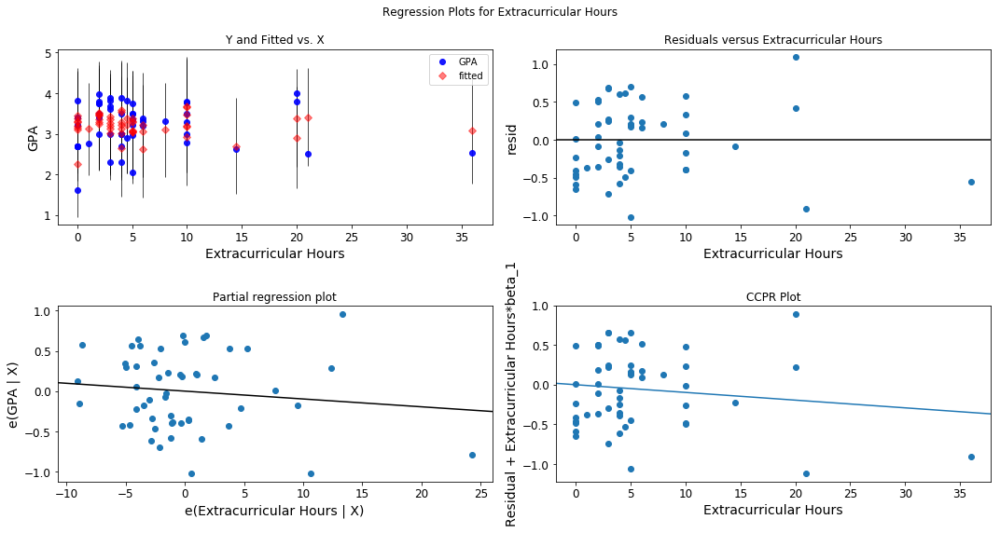

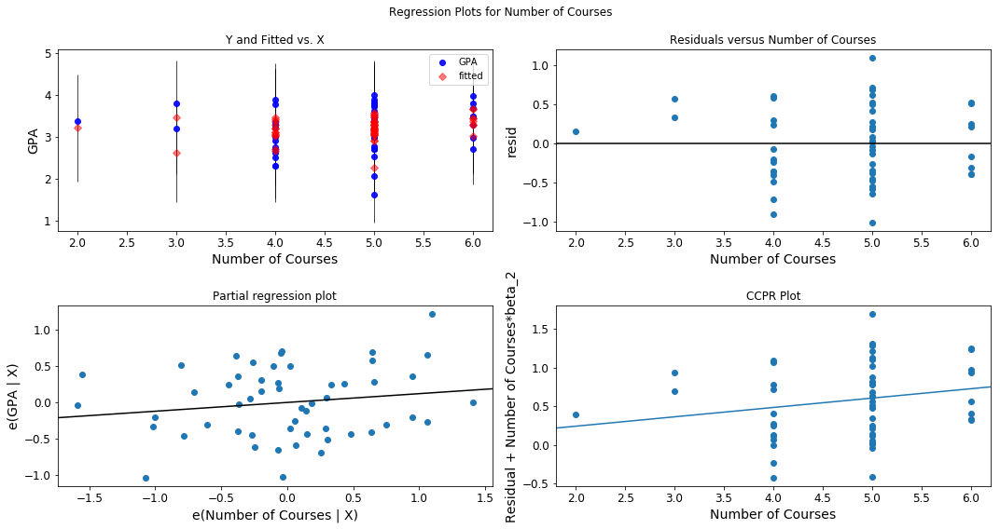

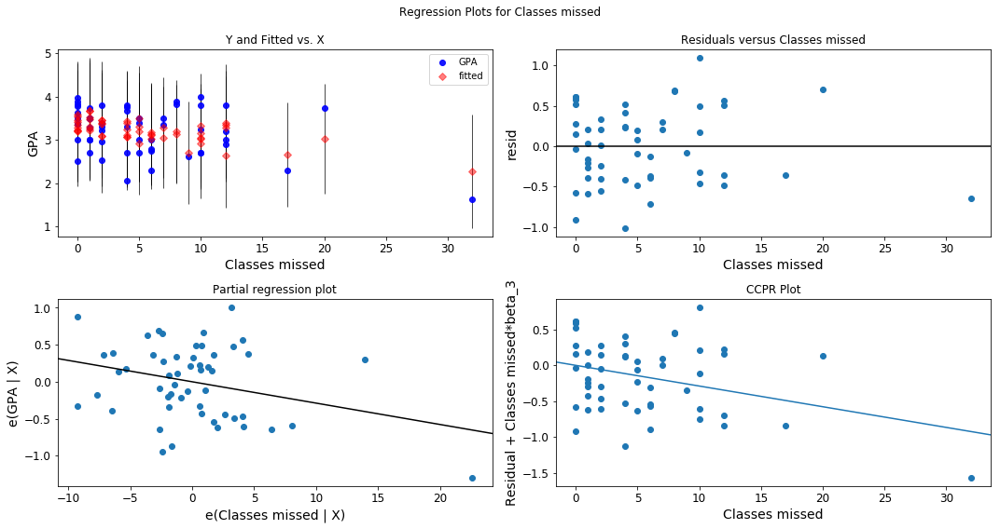

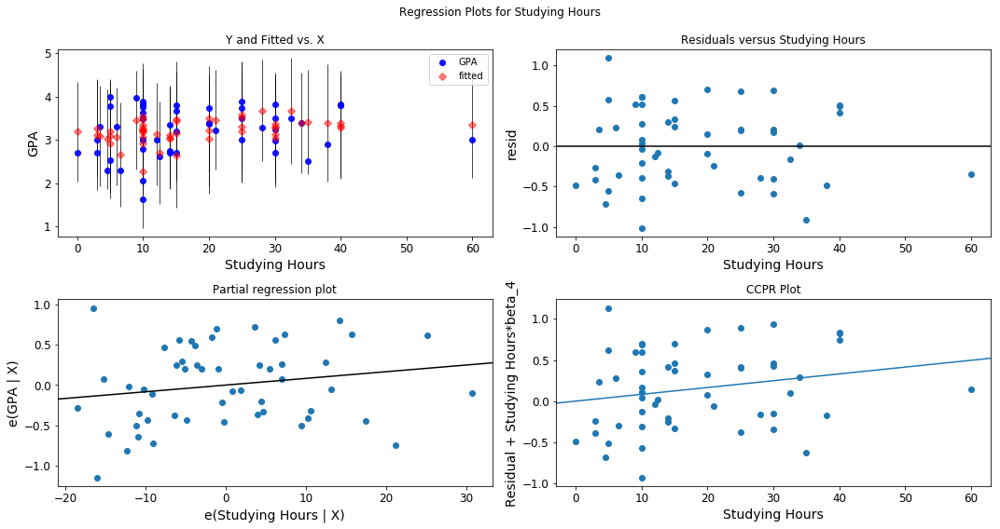

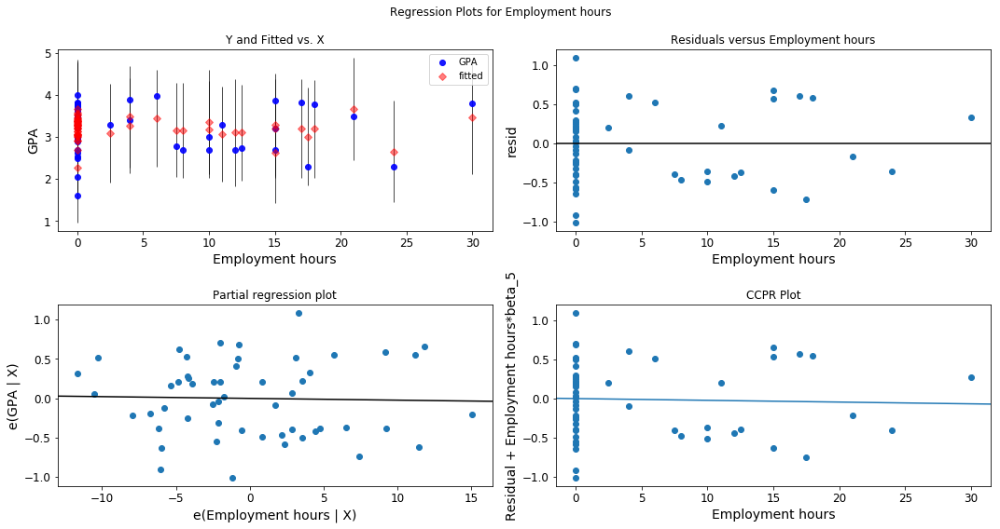

...

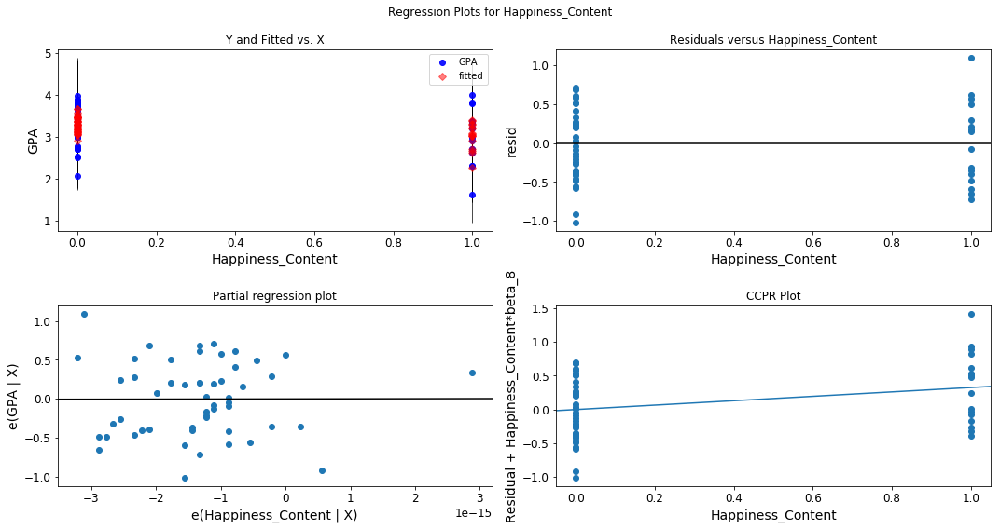

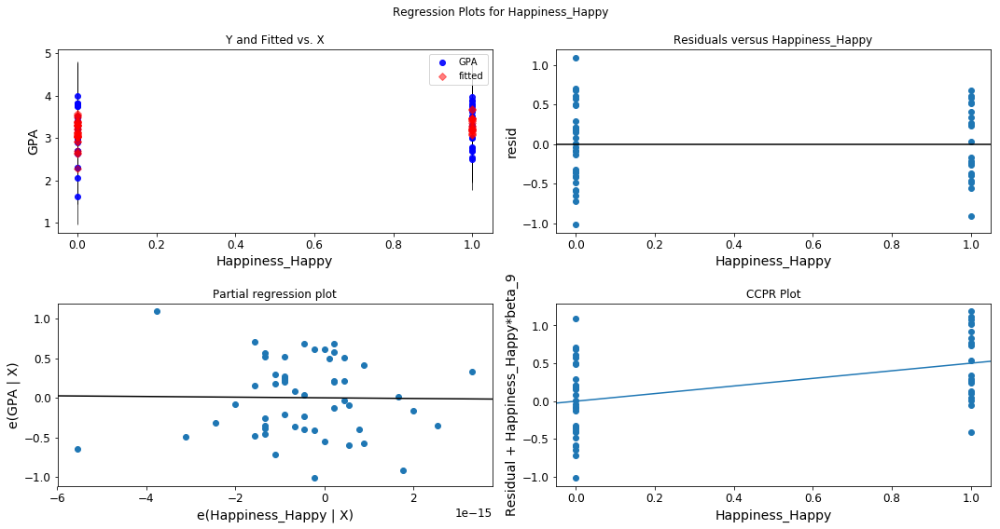

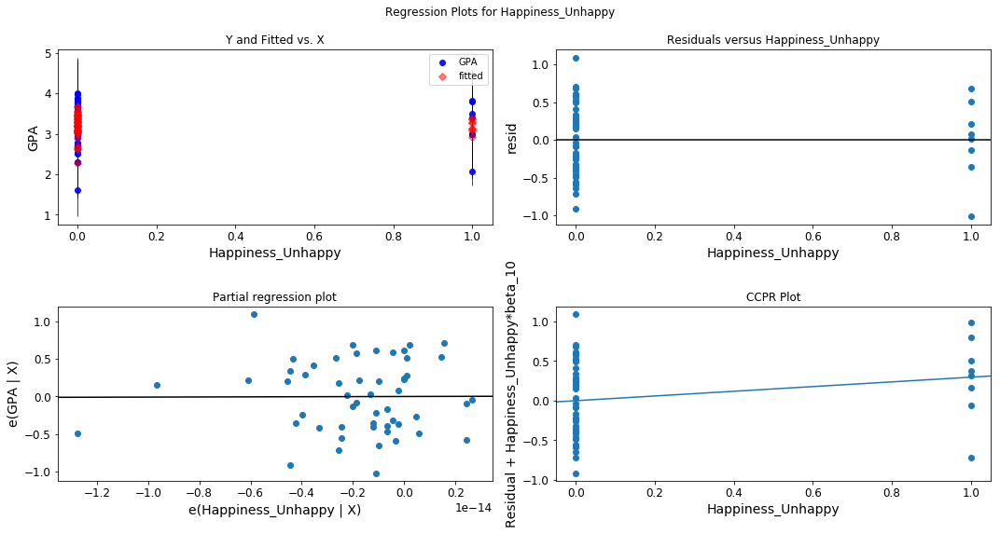

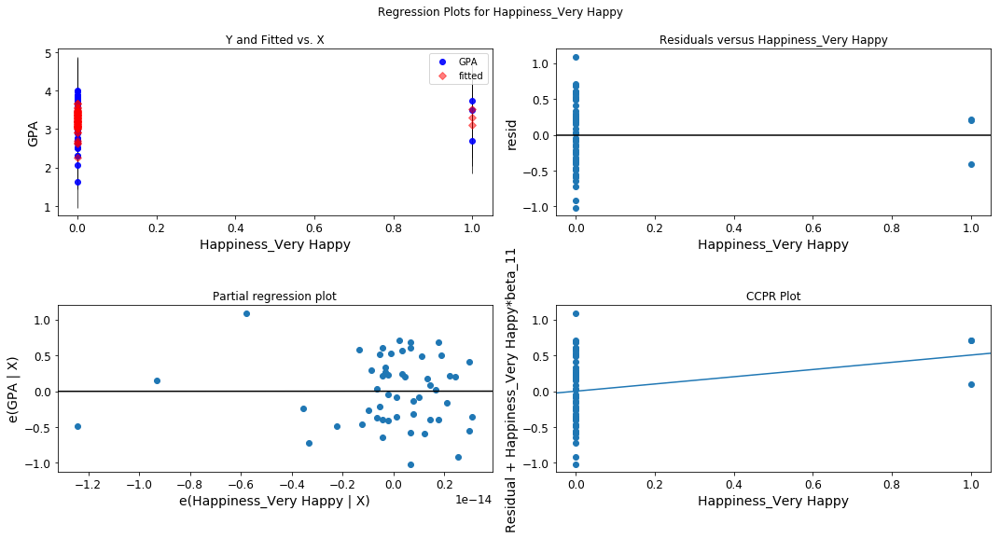

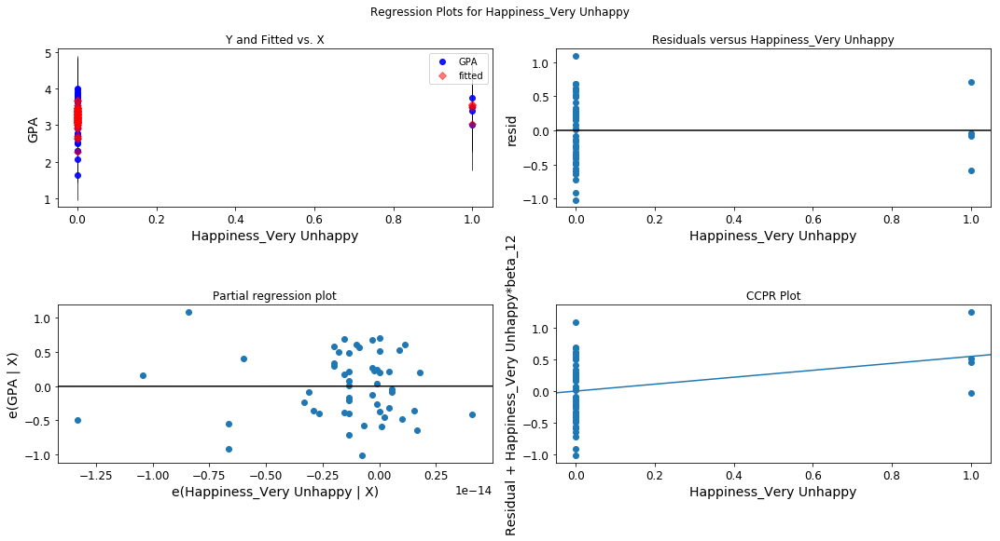

In [55]:
for i in range(1, len(female_feature_run_1)):
    fig = plt.figure(figsize=(15,8))
    female_feature_run_1 = list(x_female_run_1)[i]
    fig = sm.graphics.plot_regress_exog(model_female_run_1, female_feature_run_1, fig=fig)

# Female Data. Run 2. Drop feature with the highest p-value.

In [56]:
x_female_run_1_to_remove = ['Employment hours']

x_female_run_2 = x_female_run_1.drop(x_female_run_1_to_remove, axis = 1)

In [57]:
model_female_run_2 = sm.OLS(y_female, x_female_run_2).fit()
print(model_female_run_2.summary())

                            OLS Regression Results                            
Dep. Variable:                    GPA   R-squared:                       0.236
Model:                            OLS   Adj. R-squared:                  0.054
Method:                 Least Squares   F-statistic:                     1.295
Date:                Sat, 01 Dec 2018   Prob (F-statistic):              0.264
Time:                        14:16:53   Log-Likelihood:                -35.217
No. Observations:                  53   AIC:                             92.43
Df Residuals:                      42   BIC:                             114.1
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2

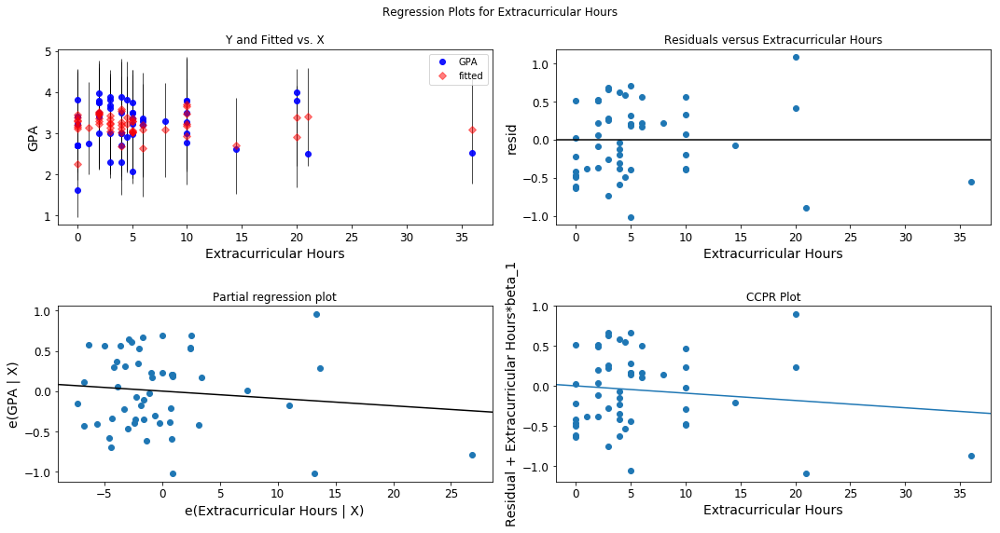

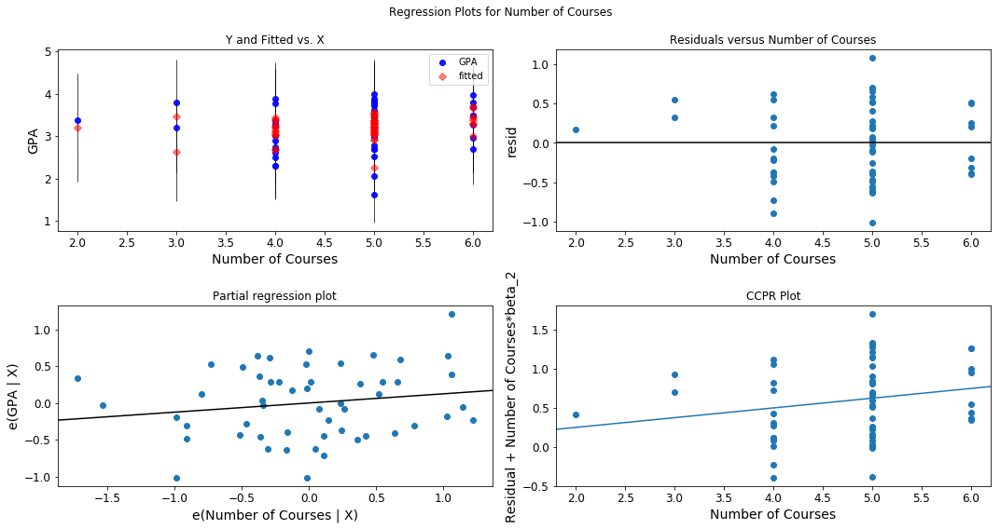

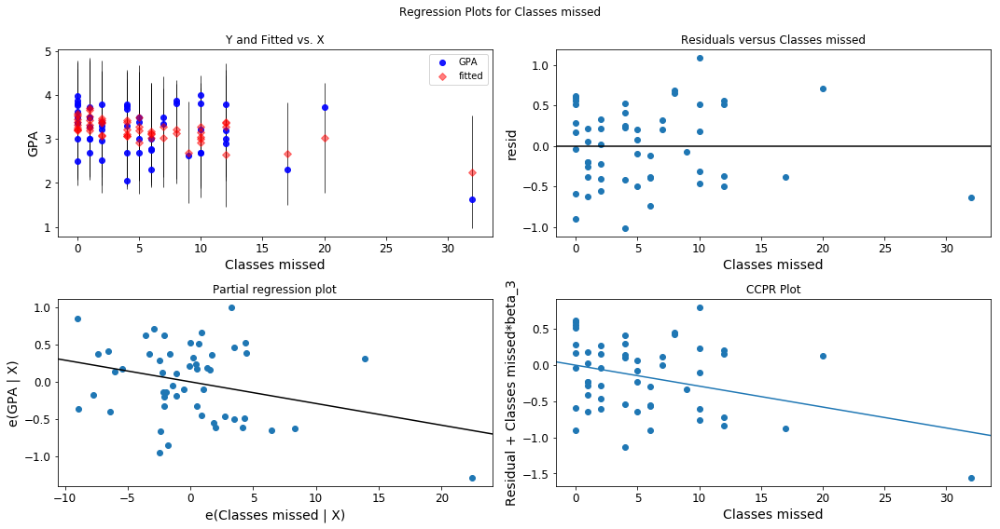

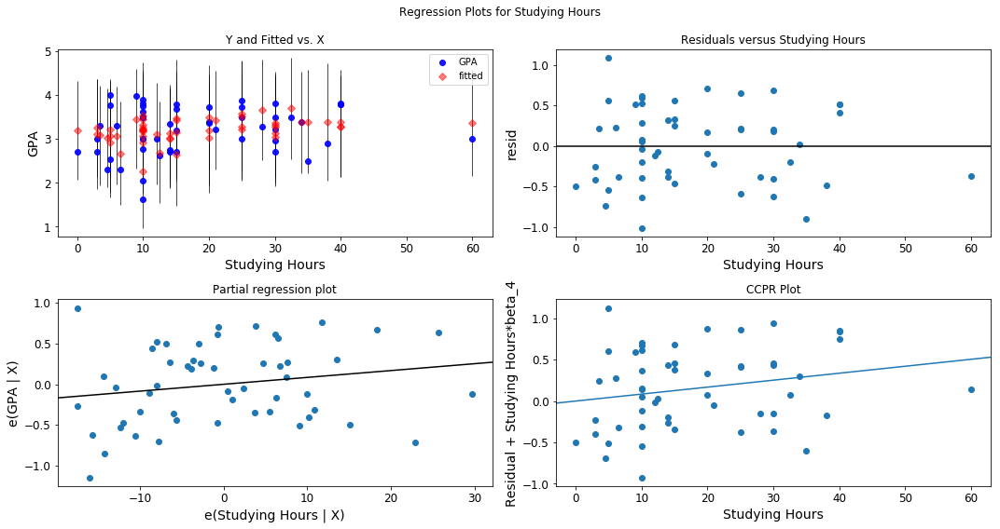

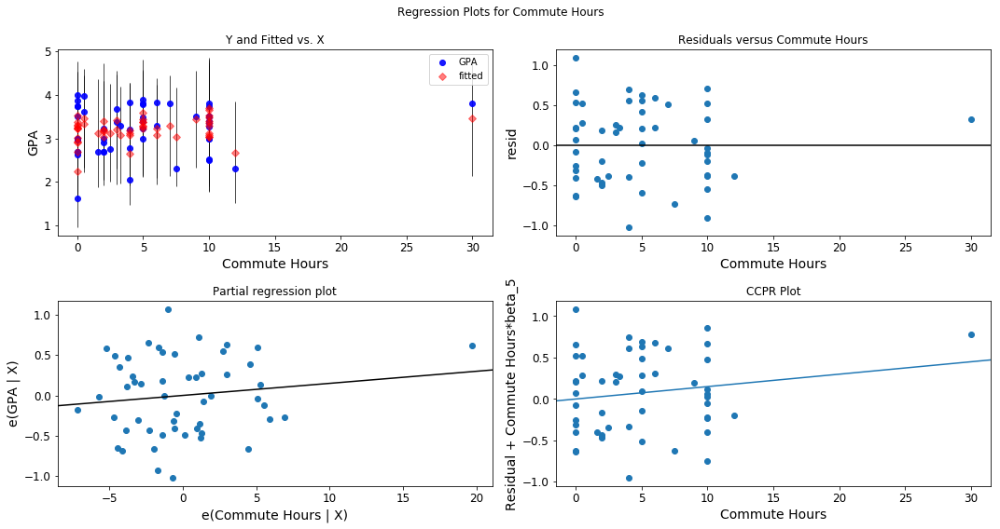

...

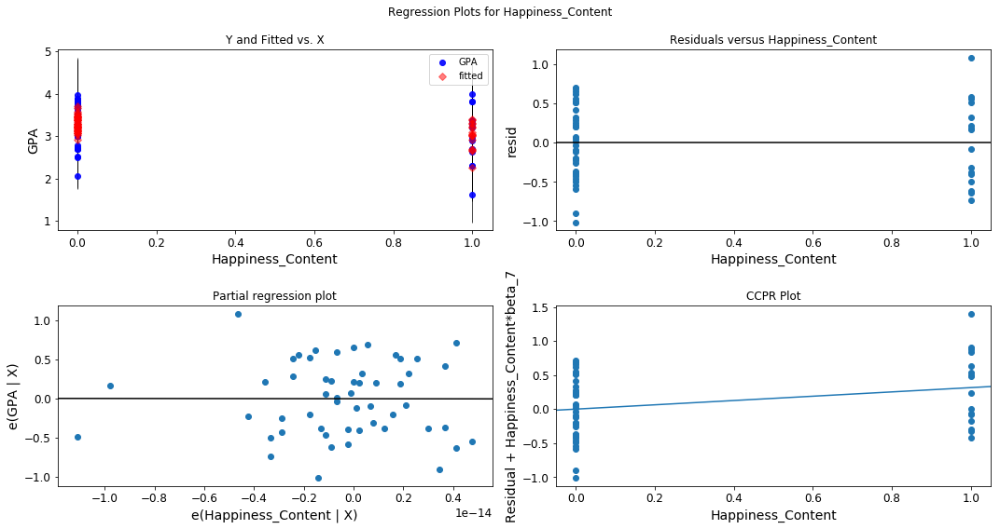

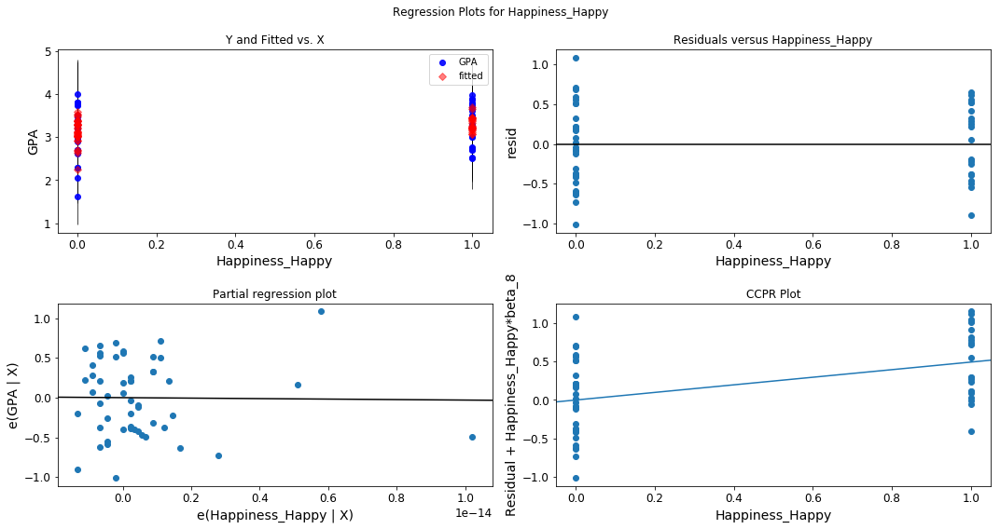

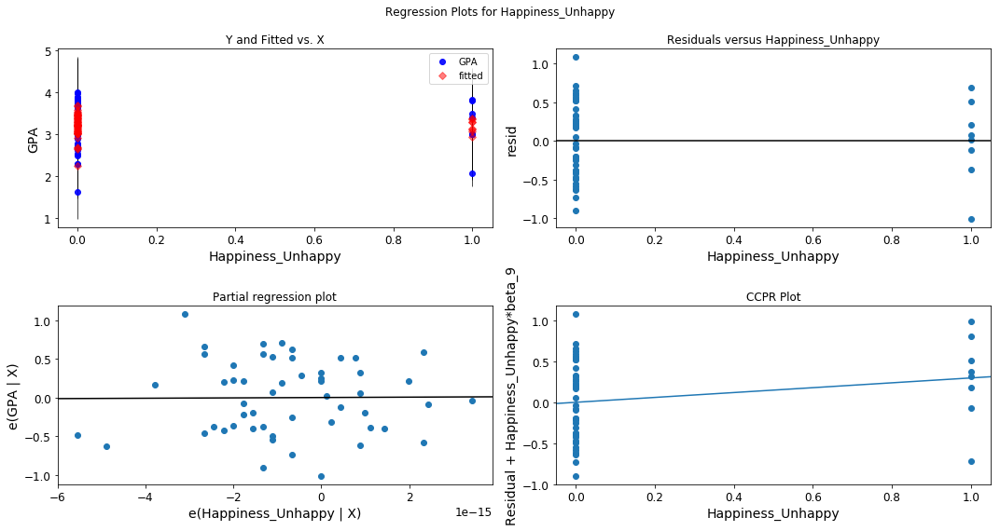

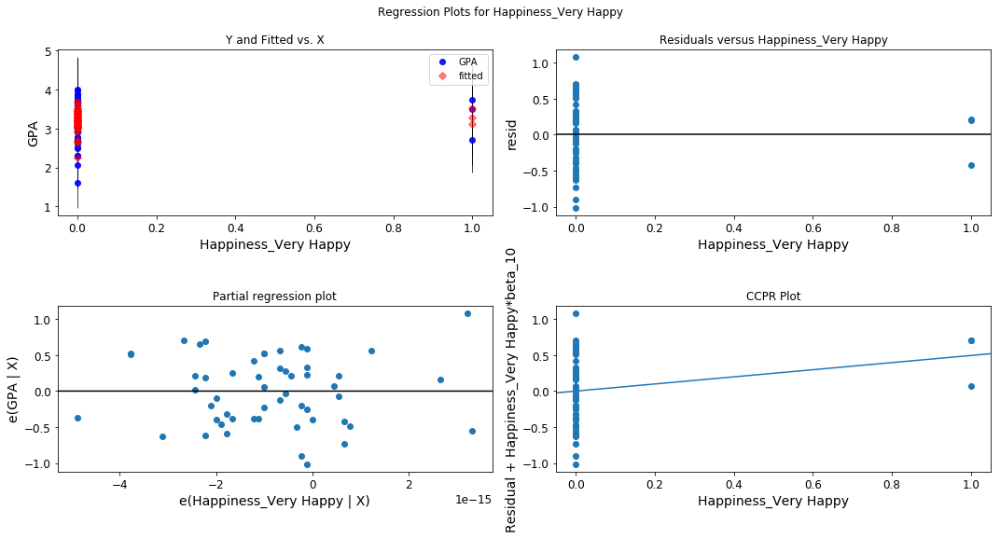

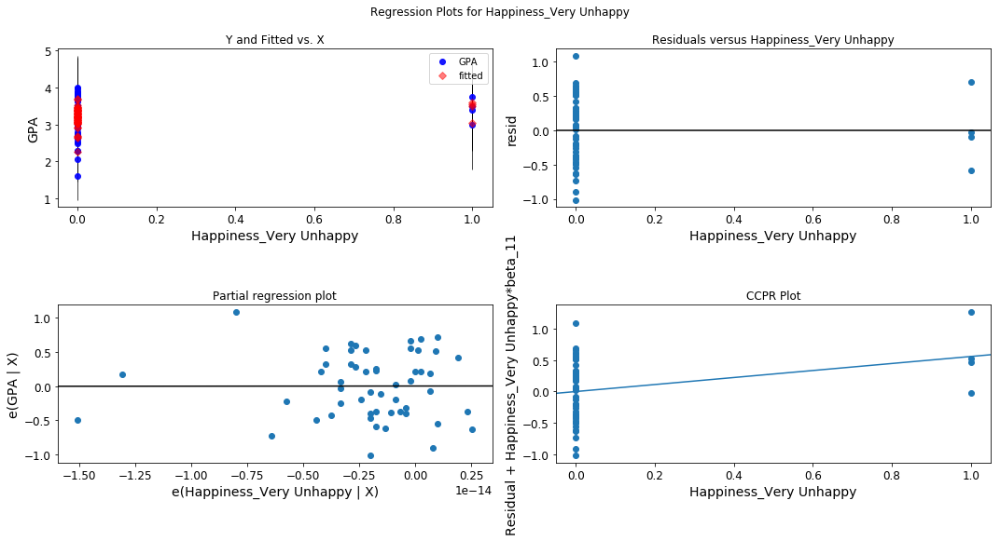

In [58]:
female_feature_run_2 = list(x_female_run_2)

for i in range(1, len(female_feature_run_2)):
    fig = plt.figure(figsize=(15,8))
    female_feature_run_2 = list(x_female_run_2)[i]
    fig = sm.graphics.plot_regress_exog(model_female_run_2, female_feature_run_2, fig=fig)

# Female Data. Run 3. Drop feature with the highest p-value.

In [59]:
x_female_run_2_to_remove = ['Extracurricular Hours']

x_female_run_3 = x_female_run_2.drop(x_female_run_2_to_remove, axis = 1)

In [60]:
model_female_run_3 = sm.OLS(y_female, x_female_run_3).fit()
print(model_female_run_3.summary())

                            OLS Regression Results                            
Dep. Variable:                    GPA   R-squared:                       0.225
Model:                            OLS   Adj. R-squared:                  0.063
Method:                 Least Squares   F-statistic:                     1.389
Date:                Sat, 01 Dec 2018   Prob (F-statistic):              0.223
Time:                        14:16:57   Log-Likelihood:                -35.578
No. Observations:                  53   AIC:                             91.16
Df Residuals:                      43   BIC:                             110.9
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2

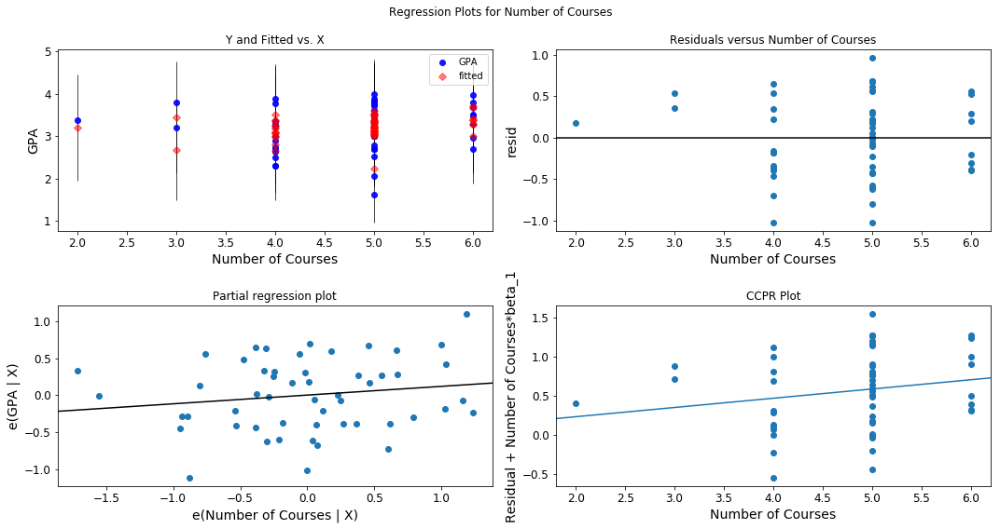

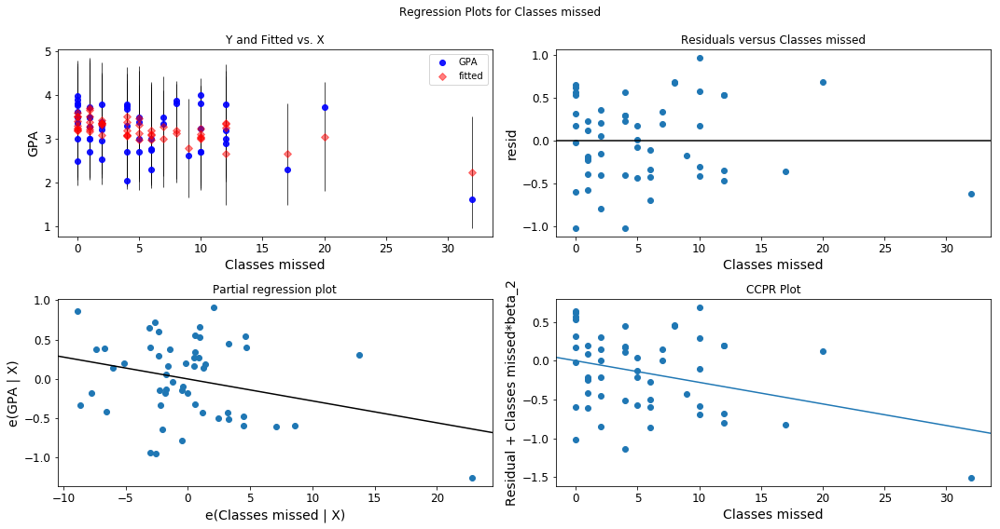

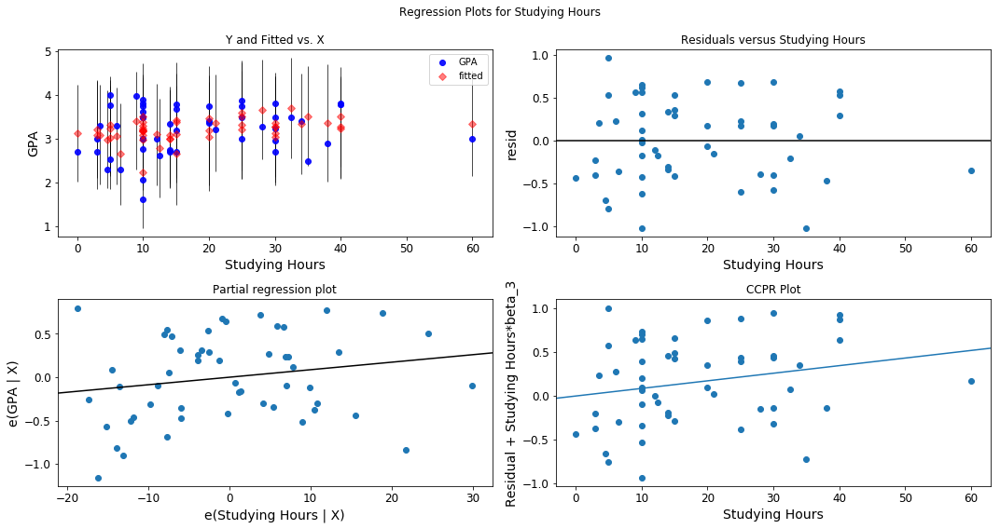

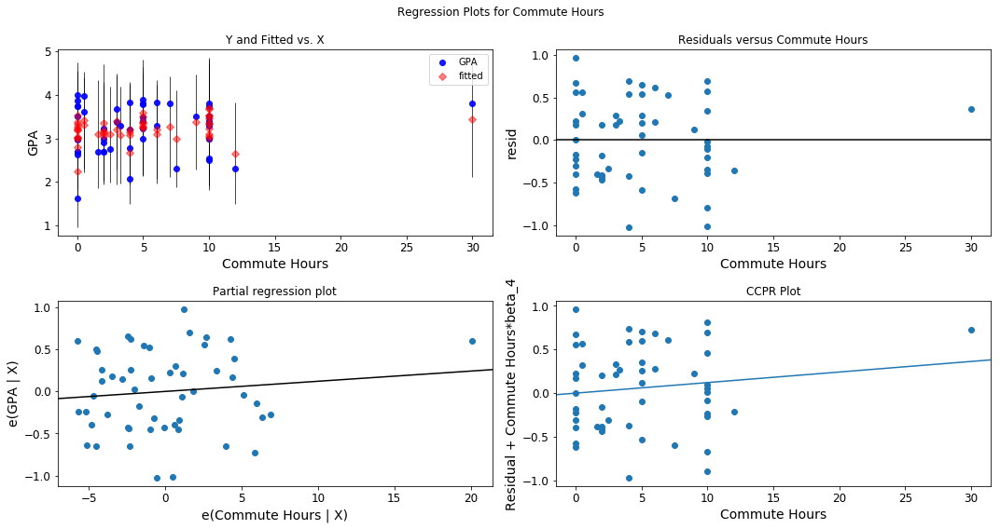

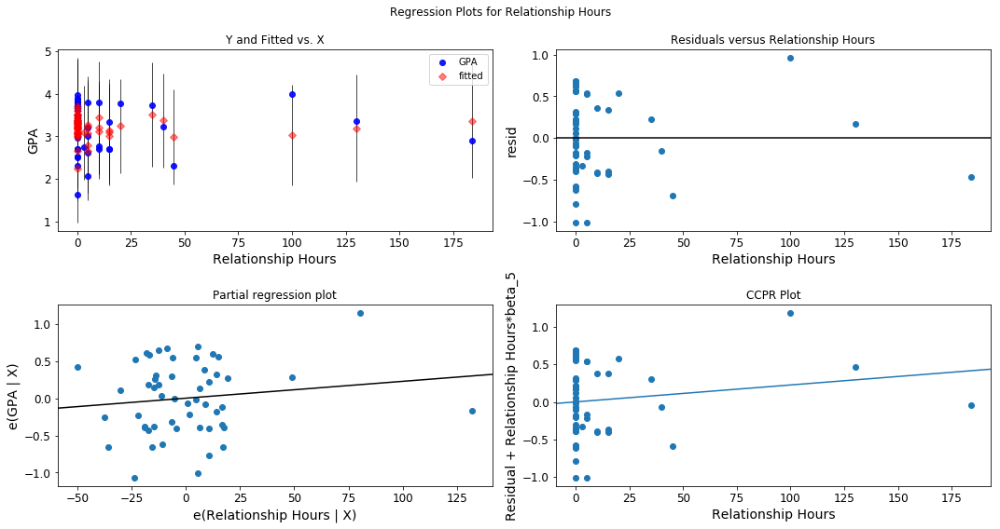

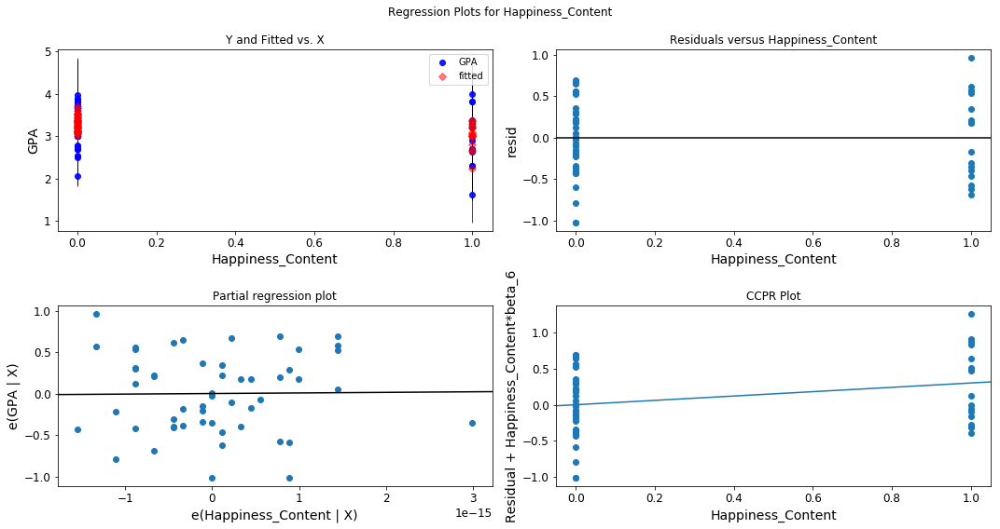

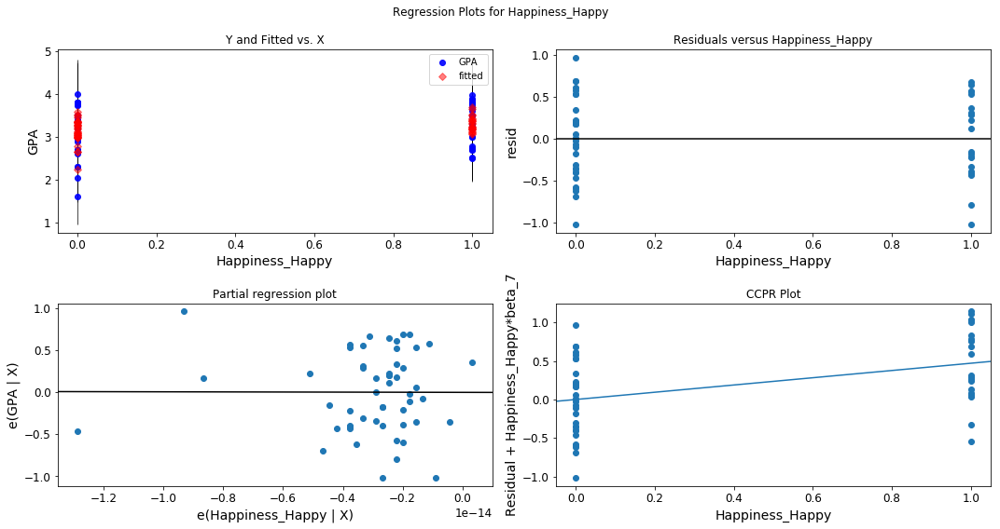

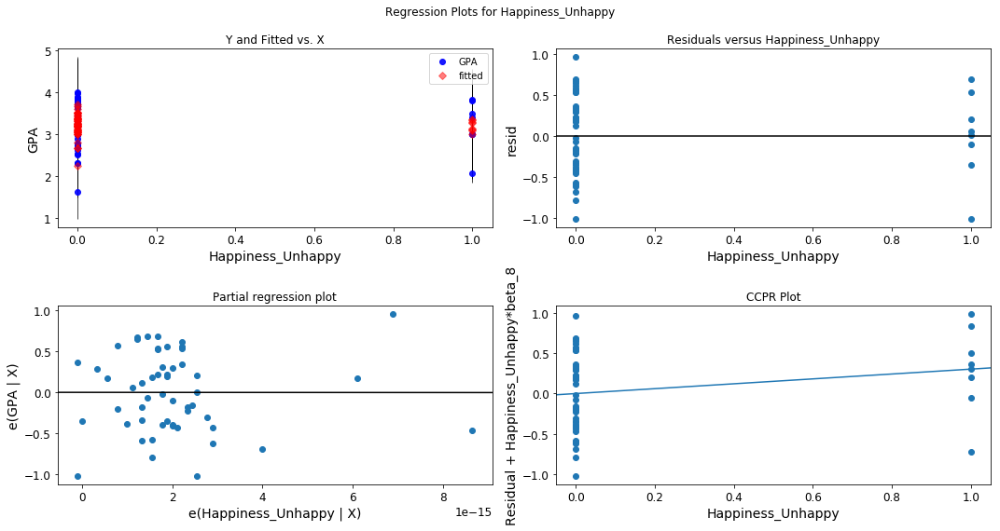

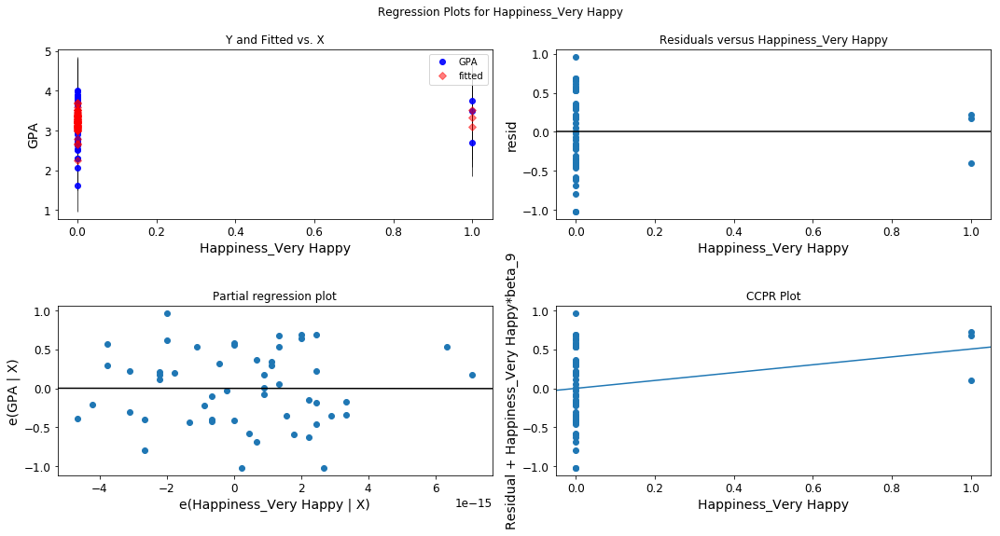

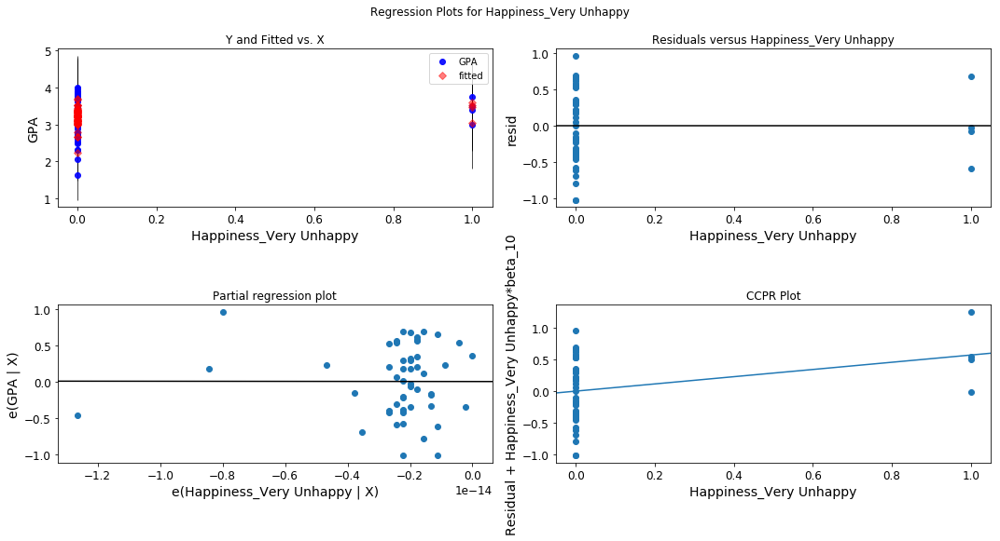

In [61]:
female_feature_run_3 = list(x_female_run_3)

for i in range(1, len(female_feature_run_3)):
    fig = plt.figure(figsize=(15,8))
    female_feature_run_3 = list(x_female_run_3)[i]
    fig = sm.graphics.plot_regress_exog(model_female_run_3, female_feature_run_3, fig=fig)

# Female Data. Run 4. Drop feature with the highest p-value.

In [62]:
x_female_run_3_to_remove = ['Commute Hours']

x_female_run_4 = x_female_run_3.drop(x_female_run_3_to_remove, axis = 1)

In [63]:
model_female_run_4 = sm.OLS(y_female, x_female_run_4).fit()
print(model_female_run_4.summary())

                            OLS Regression Results                            
Dep. Variable:                    GPA   R-squared:                       0.215
Model:                            OLS   Adj. R-squared:                  0.073
Method:                 Least Squares   F-statistic:                     1.509
Date:                Sat, 01 Dec 2018   Prob (F-statistic):              0.182
Time:                        14:17:02   Log-Likelihood:                -35.915
No. Observations:                  53   AIC:                             89.83
Df Residuals:                      44   BIC:                             107.6
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2

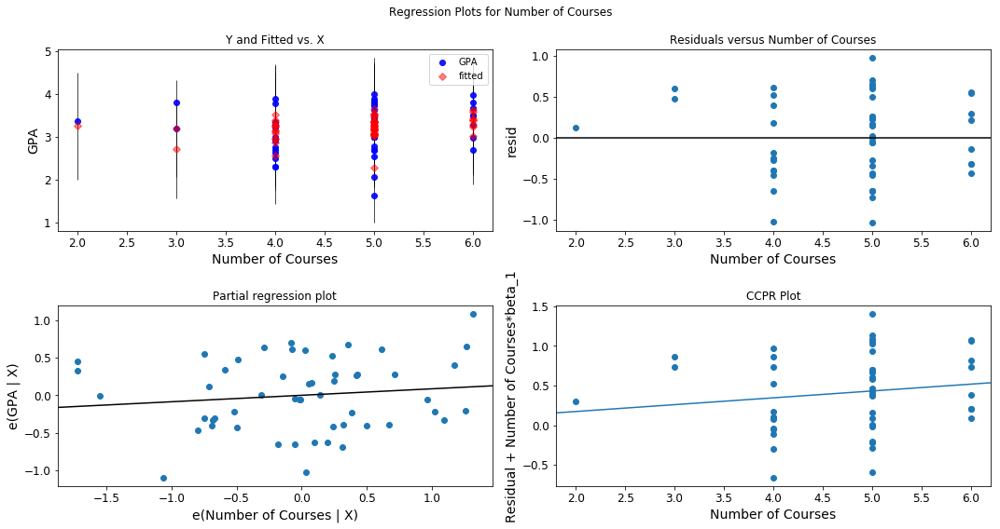

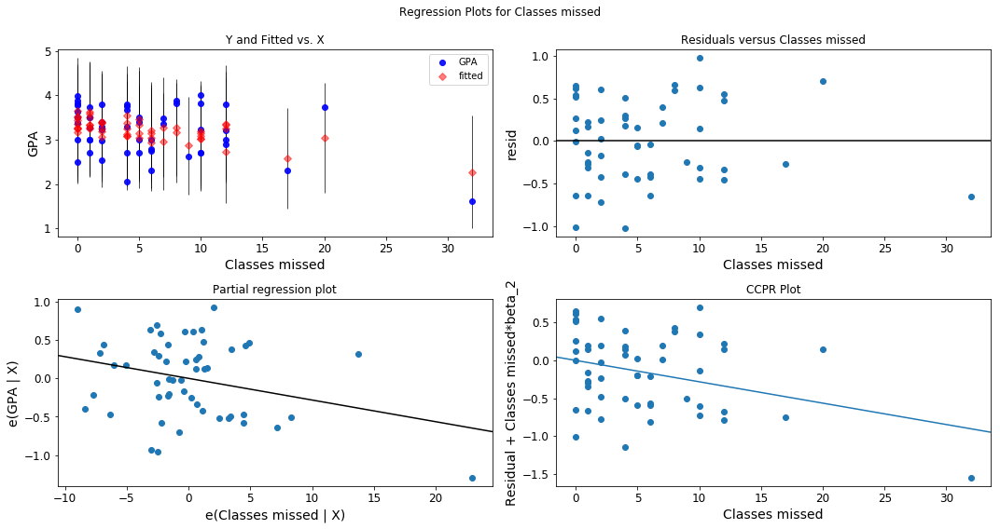

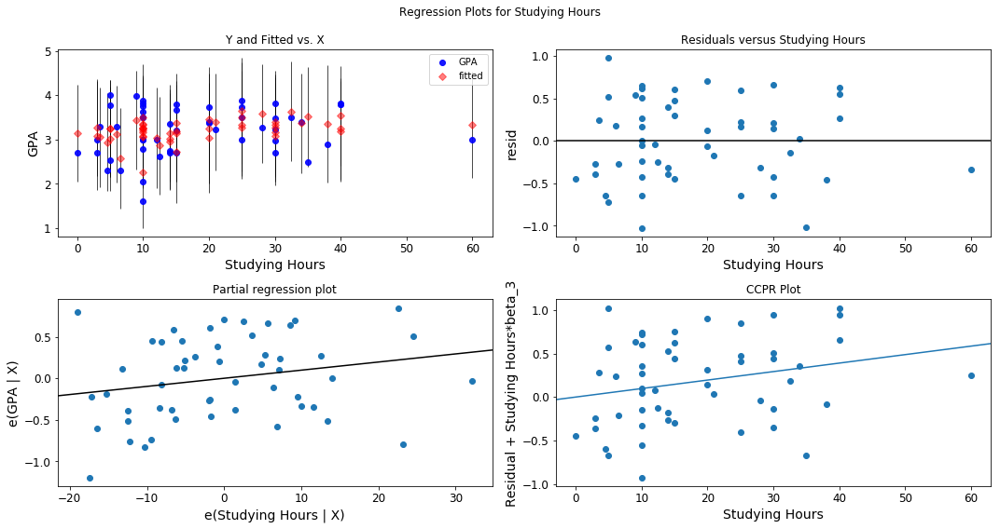

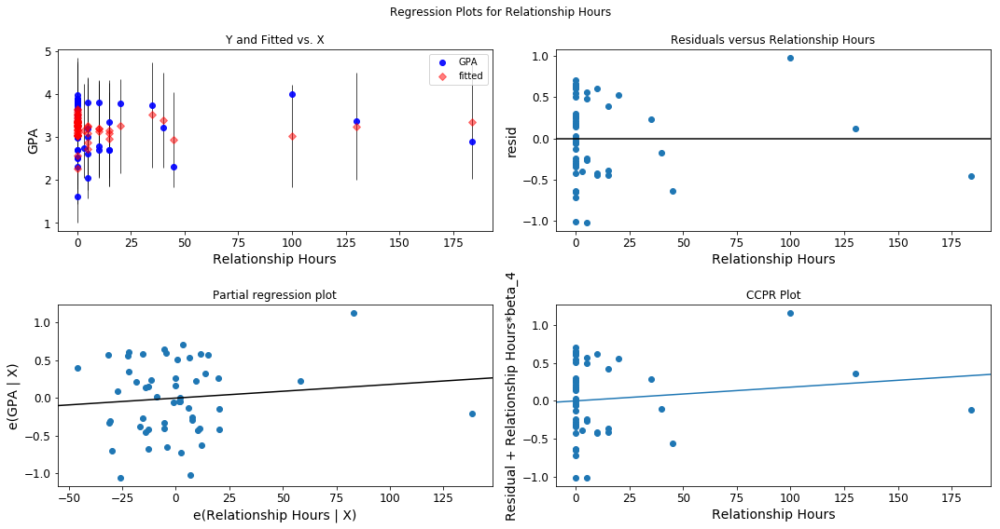

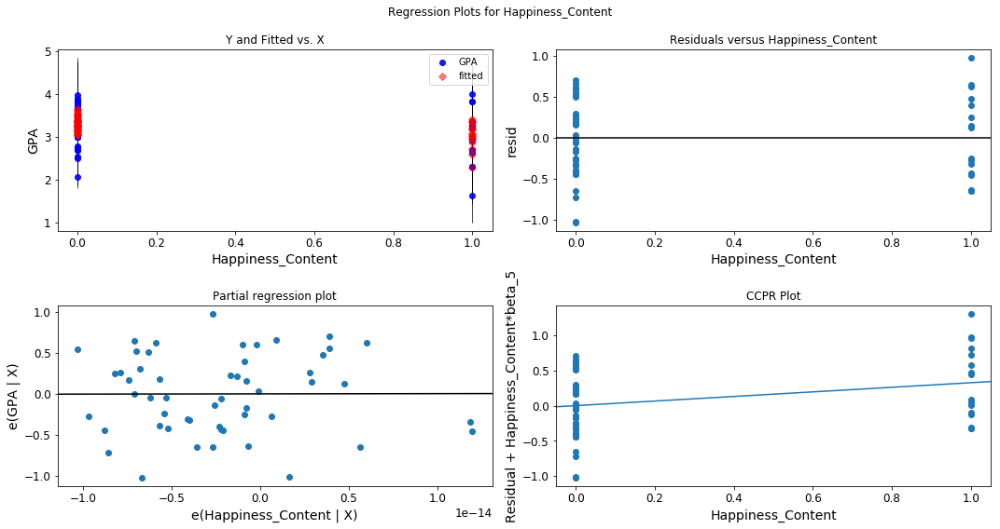

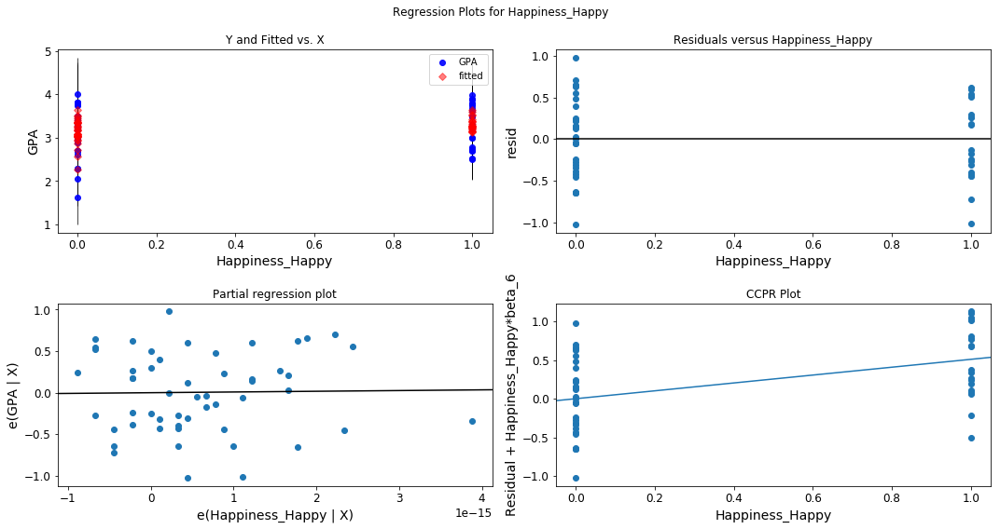

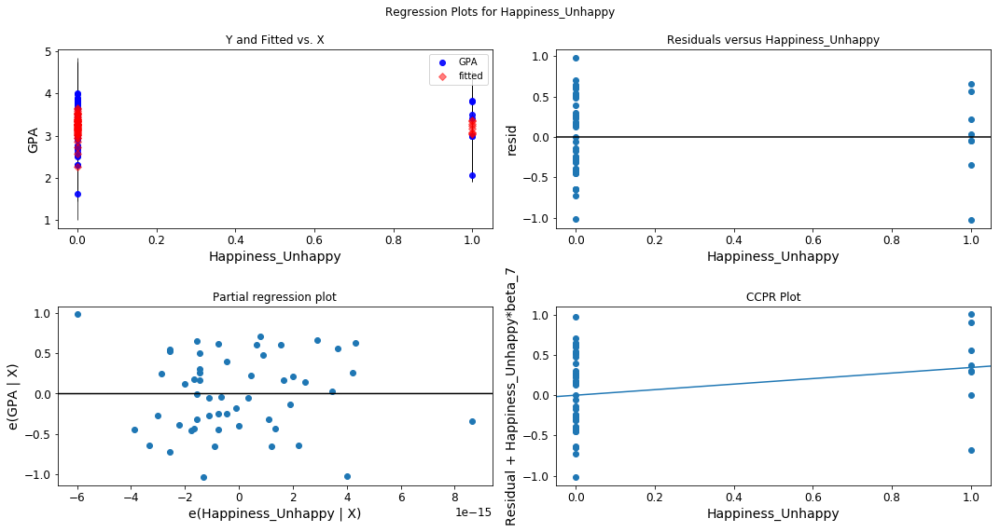

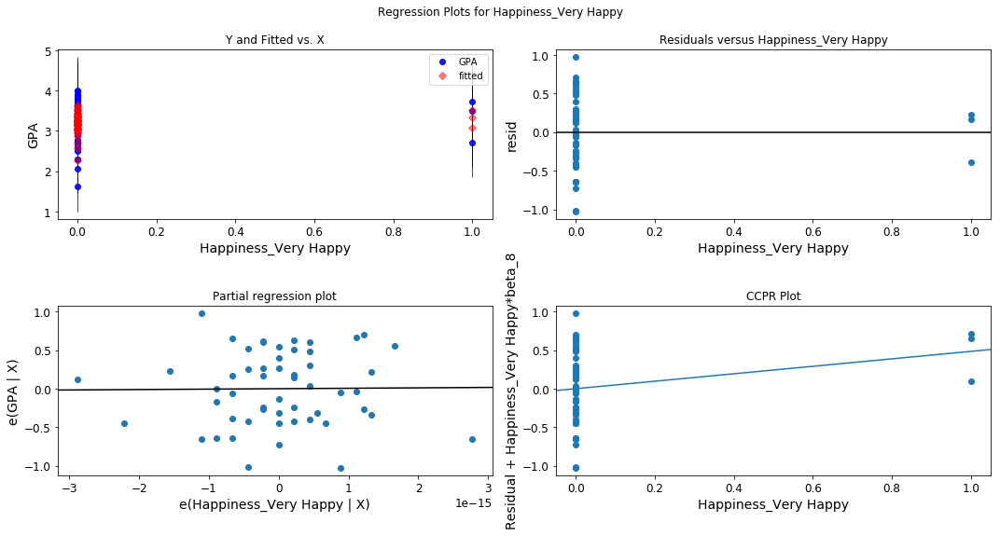

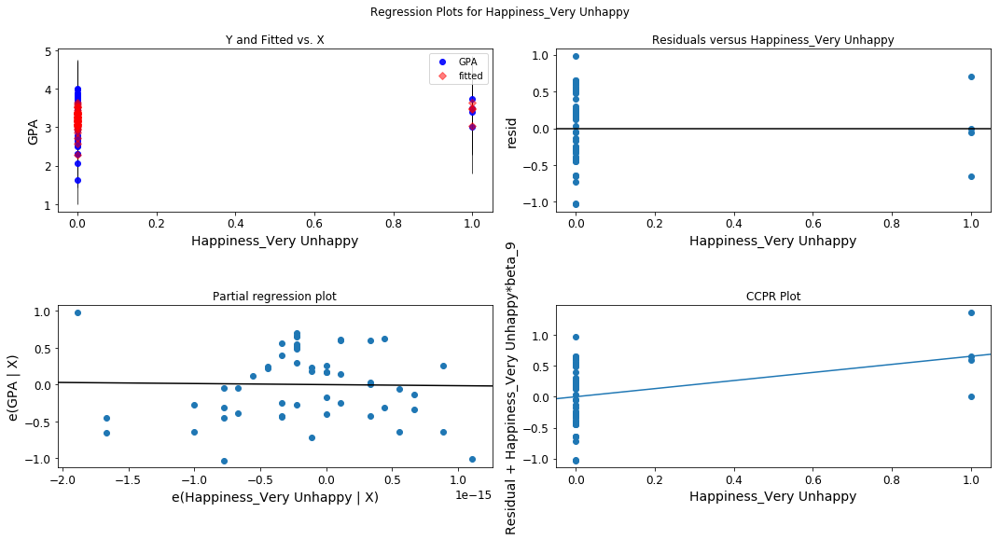

In [64]:
female_feature_run_4 = list(x_female_run_4)

for i in range(1, len(female_feature_run_4)):
    fig = plt.figure(figsize=(15,8))
    female_feature_run_4 = list(x_female_run_4)[i]
    fig = sm.graphics.plot_regress_exog(model_female_run_4, female_feature_run_4, fig=fig)

# Female Data. Run 5. Drop feature with the highest p-value.

In [65]:
x_female_run_4_to_remove = ['Relationship Hours']

x_female_run_5 = x_female_run_4.drop(x_female_run_4_to_remove, axis = 1)

In [66]:
model_female_run_5 = sm.OLS(y_female, x_female_run_5).fit()
print(model_female_run_5.summary())

                            OLS Regression Results                            
Dep. Variable:                    GPA   R-squared:                       0.206
Model:                            OLS   Adj. R-squared:                  0.083
Method:                 Least Squares   F-statistic:                     1.669
Date:                Sat, 01 Dec 2018   Prob (F-statistic):              0.141
Time:                        14:17:05   Log-Likelihood:                -36.224
No. Observations:                  53   AIC:                             88.45
Df Residuals:                      45   BIC:                             104.2
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2

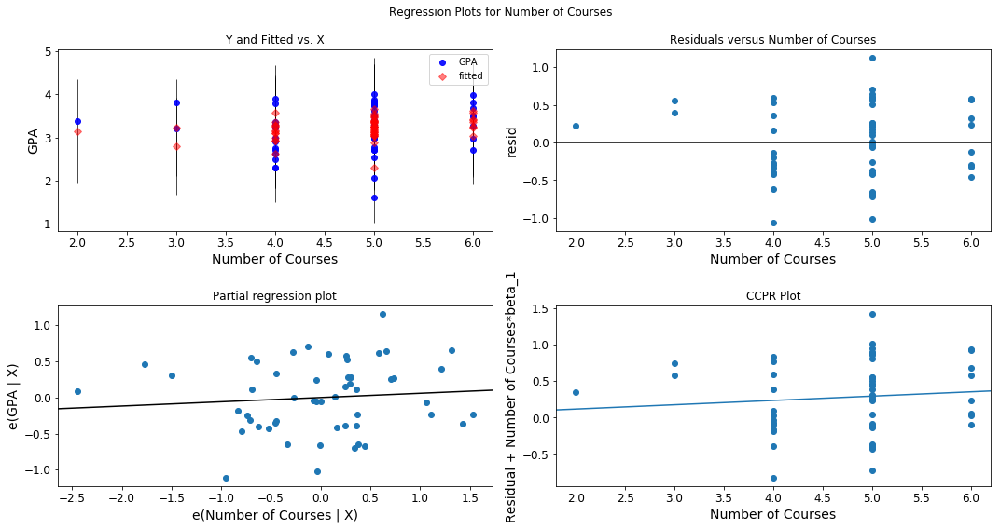

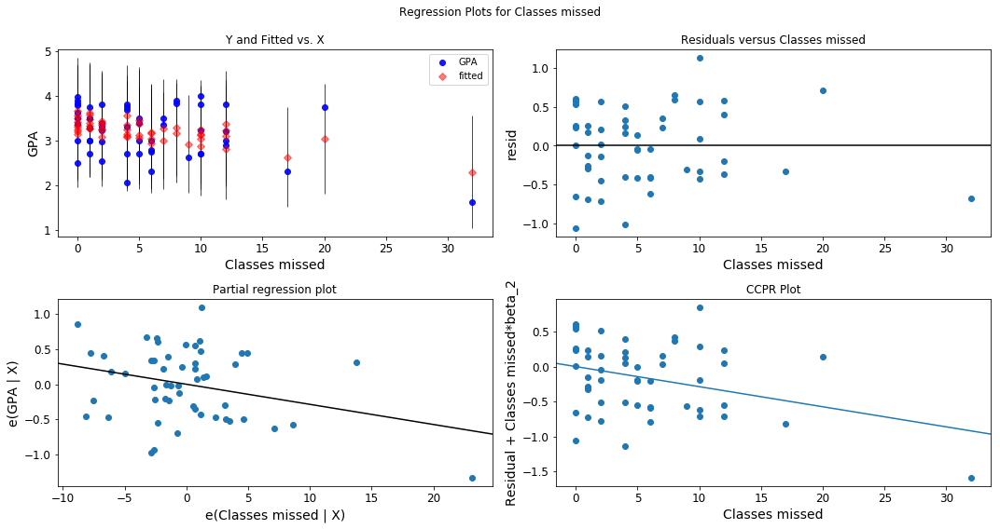

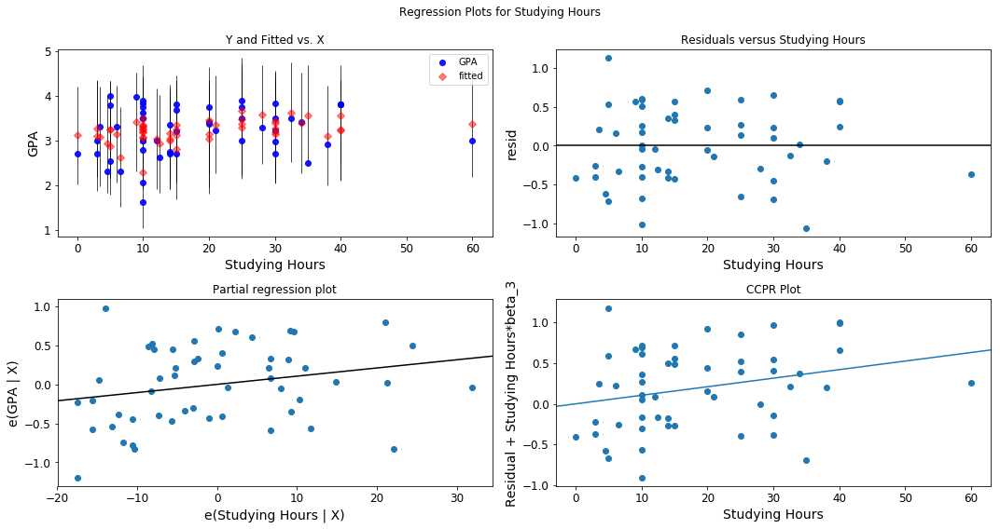

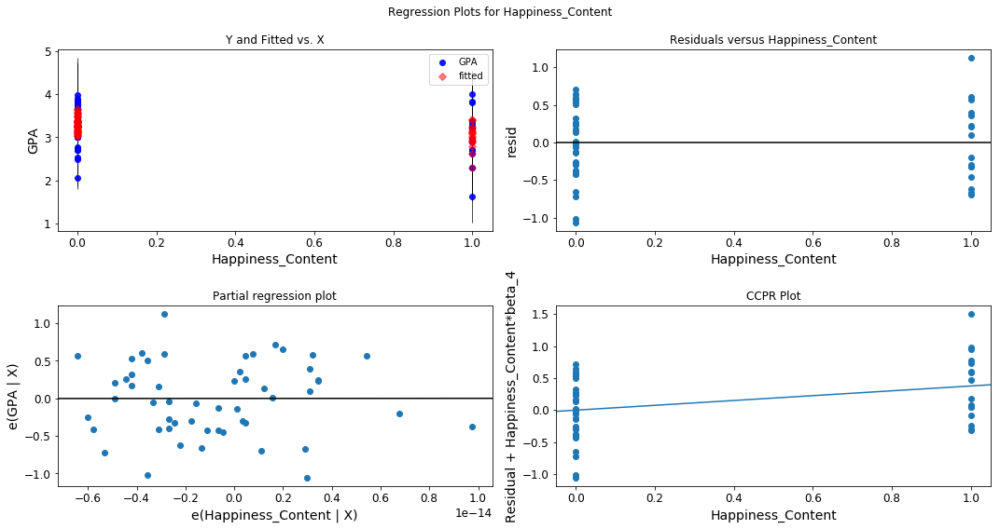

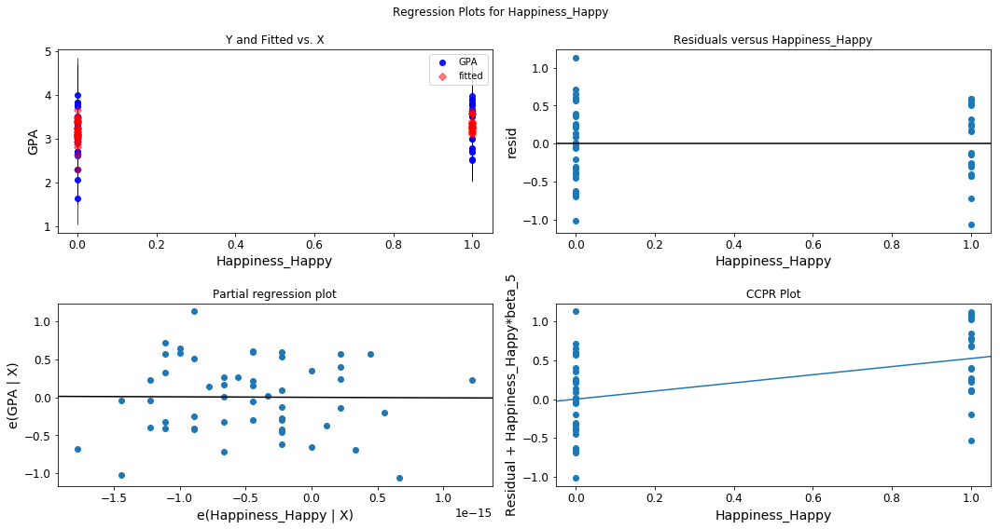

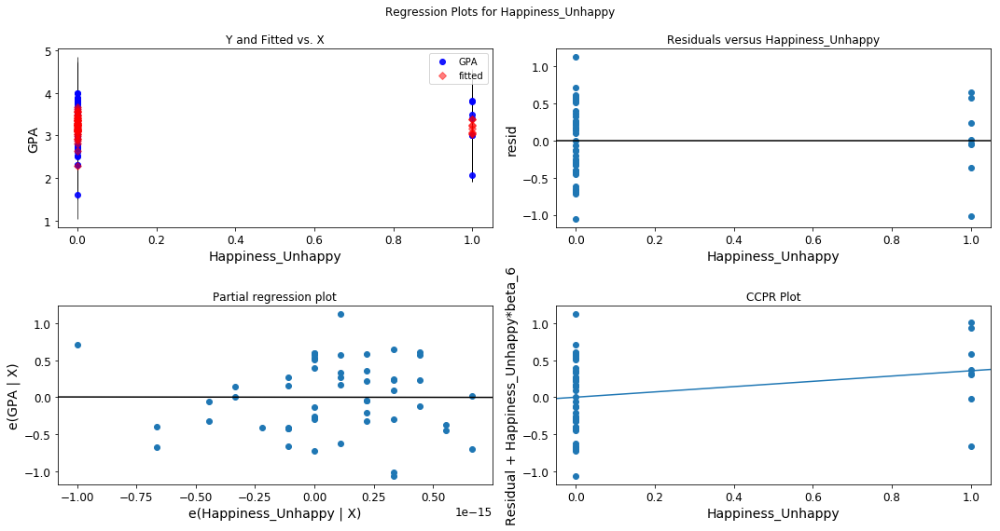

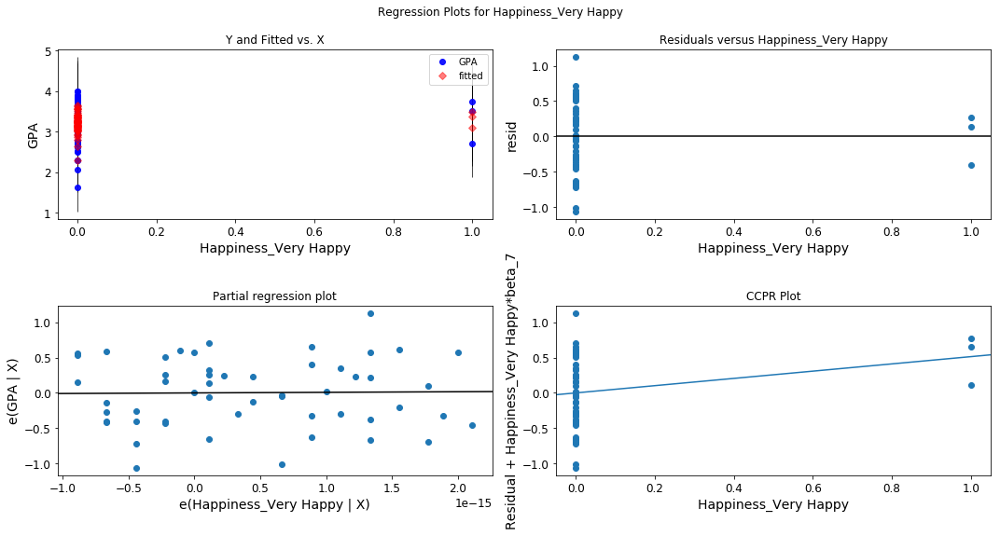

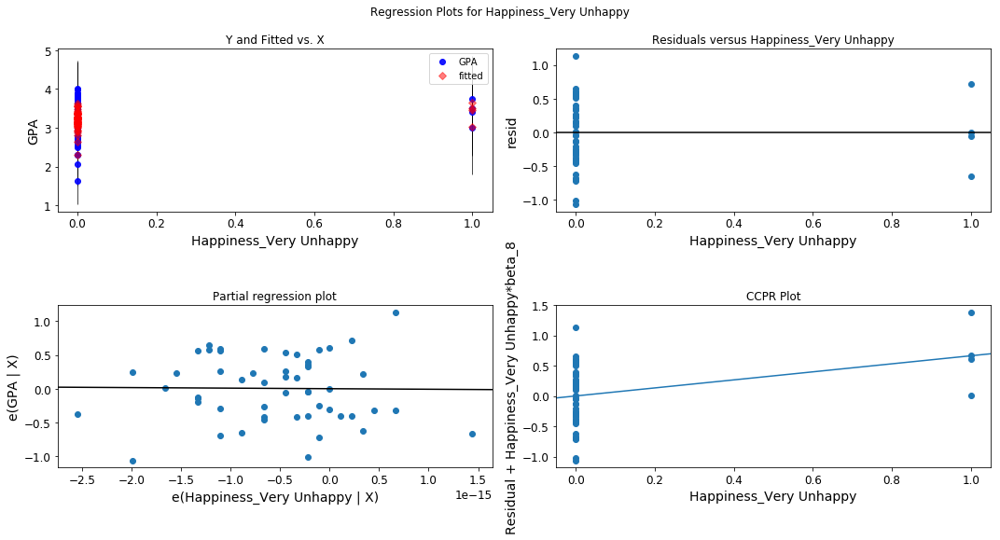

In [67]:
female_feature_run_5 = list(x_female_run_5)

for i in range(1, len(female_feature_run_5)):
    fig = plt.figure(figsize=(15,8))
    female_feature_run_5 = list(x_female_run_5)[i]
    fig = sm.graphics.plot_regress_exog(model_female_run_5, female_feature_run_5, fig=fig)

# Female Data. Run 6. Drop feature with the highest p-value.

In [68]:
x_female_run_5_to_remove = ['Number of Courses']

x_female_run_6 = x_female_run_5.drop(x_female_run_5_to_remove, axis = 1)

In [69]:
model_female_run_6 = sm.OLS(y_female, x_female_run_6).fit()
print(model_female_run_6.summary())

                            OLS Regression Results                            
Dep. Variable:                    GPA   R-squared:                       0.199
Model:                            OLS   Adj. R-squared:                  0.095
Method:                 Least Squares   F-statistic:                     1.905
Date:                Sat, 01 Dec 2018   Prob (F-statistic):              0.100
Time:                        14:17:10   Log-Likelihood:                -36.458
No. Observations:                  53   AIC:                             86.92
Df Residuals:                      46   BIC:                             100.7
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2

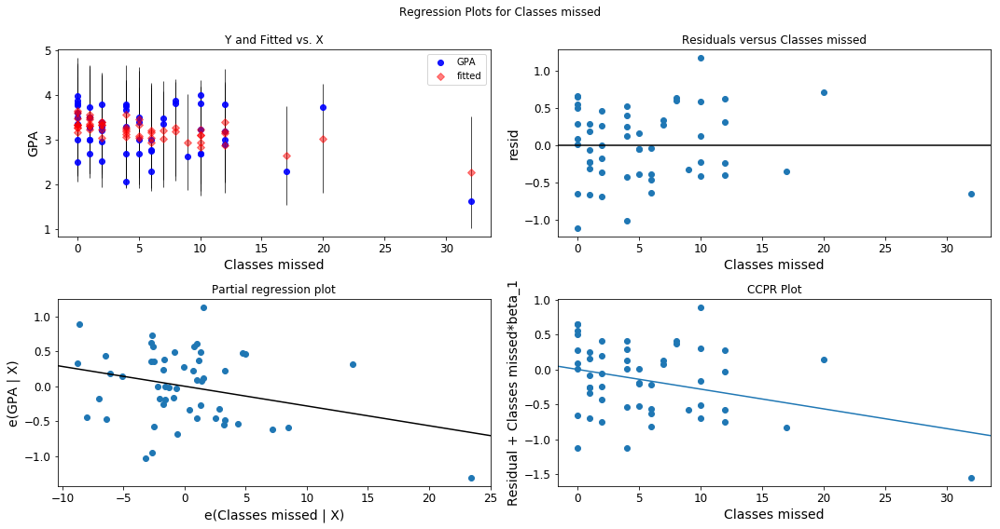

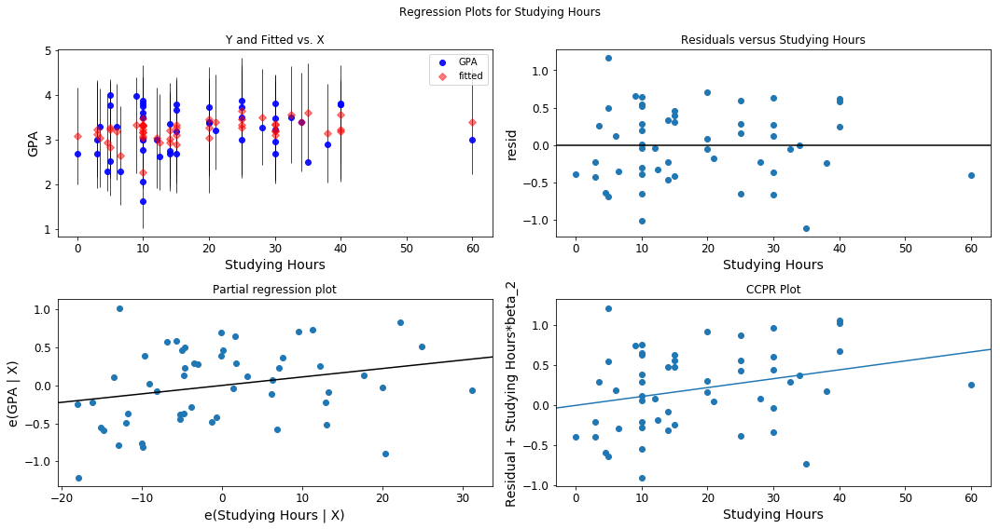

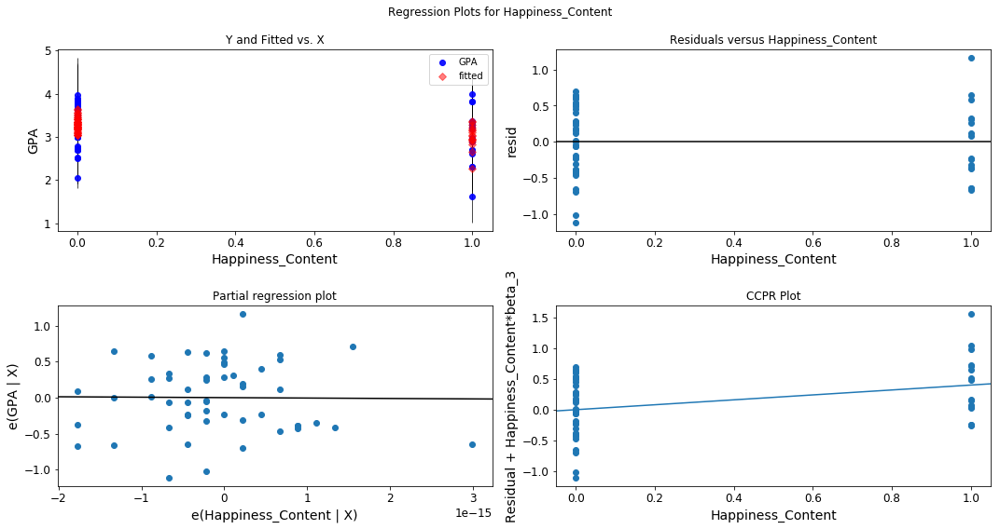

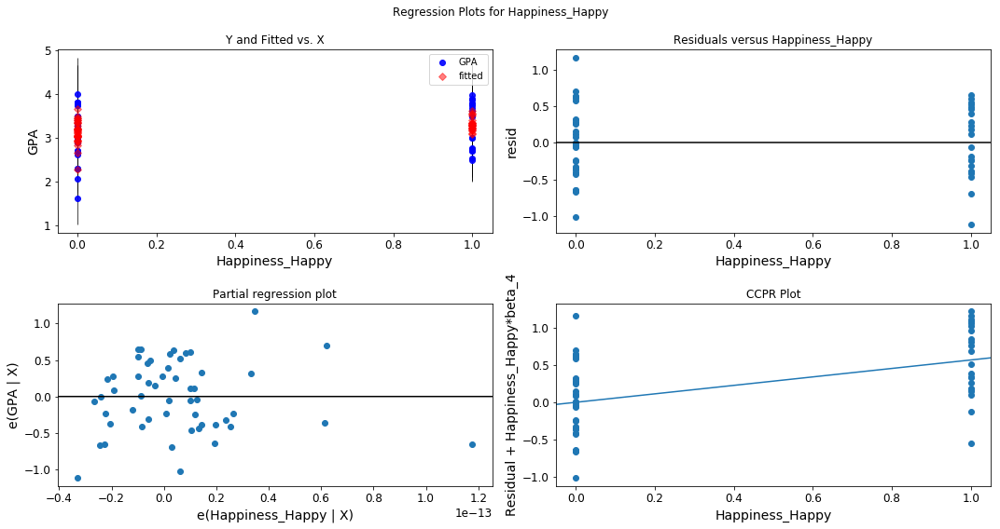

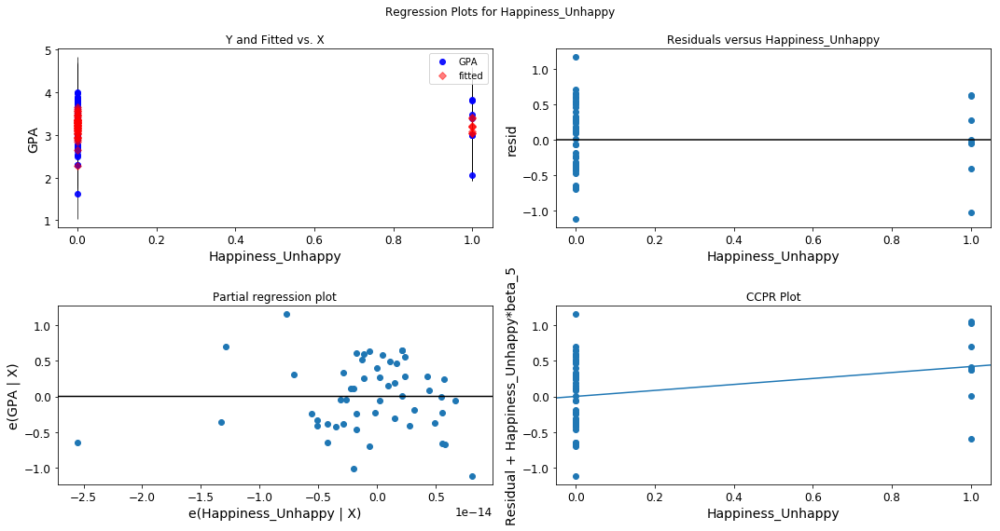

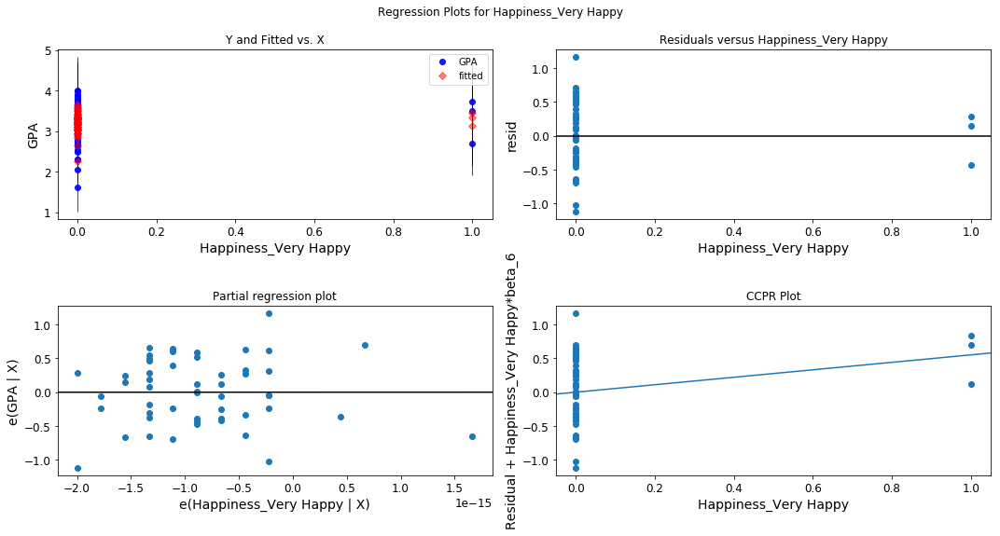

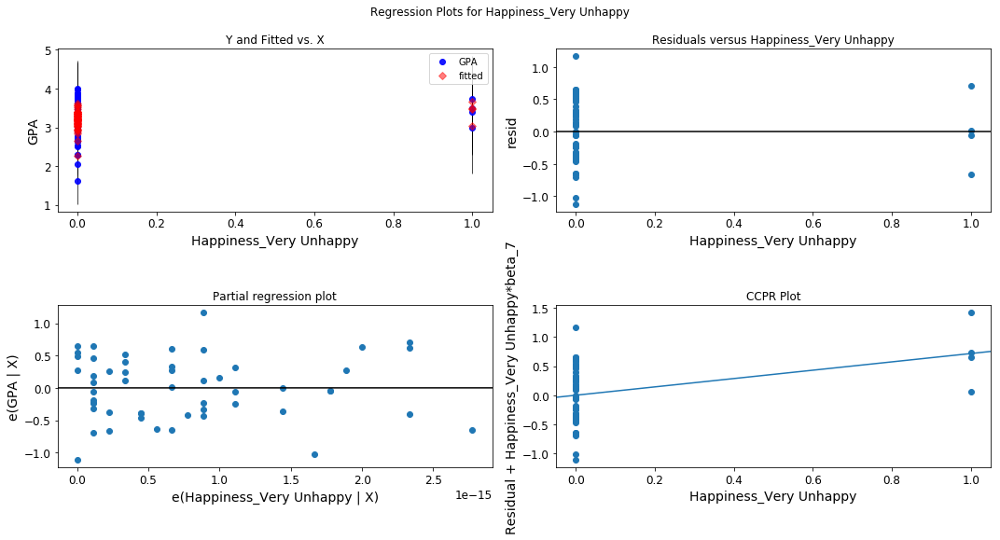

In [70]:
female_feature_run_6 = list(x_female_run_6)

for i in range(1, len(female_feature_run_6)):
    fig = plt.figure(figsize=(15,8))
    female_feature_run_6 = list(x_female_run_6)[i]
    fig = sm.graphics.plot_regress_exog(model_female_run_6, female_feature_run_6, fig=fig)

# Female Data. Run 7. Drop feature with the highest p-value.

In [71]:
x_female_run_6_to_remove = ['Studying Hours']

x_female_run_7 = x_female_run_6.drop(x_female_run_6_to_remove, axis = 1)

In [72]:
model_female_run_7 = sm.OLS(y_female, x_female_run_7).fit()
print(model_female_run_7.summary())

                            OLS Regression Results                            
Dep. Variable:                    GPA   R-squared:                       0.141
Model:                            OLS   Adj. R-squared:                  0.049
Method:                 Least Squares   F-statistic:                     1.540
Date:                Sat, 01 Dec 2018   Prob (F-statistic):              0.196
Time:                        14:17:13   Log-Likelihood:                -38.320
No. Observations:                  53   AIC:                             88.64
Df Residuals:                      47   BIC:                             100.5
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2

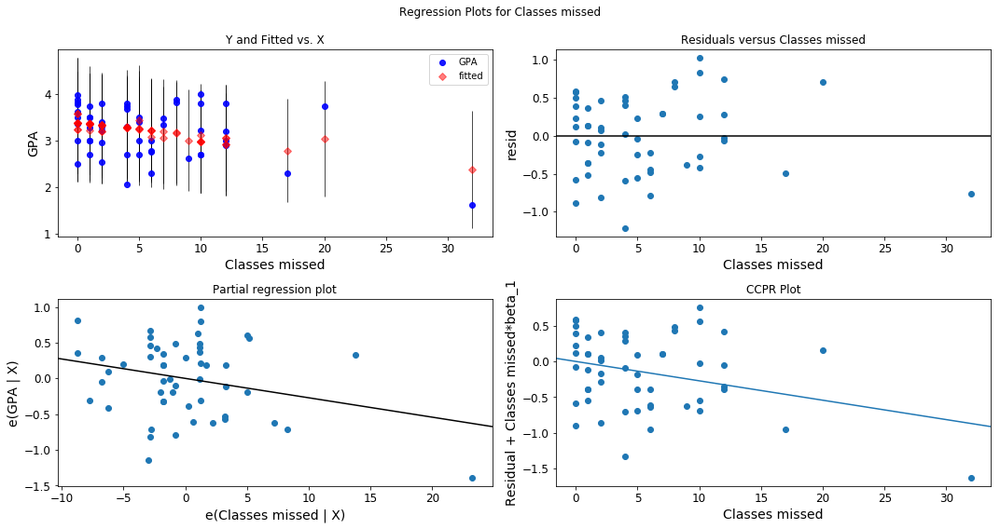

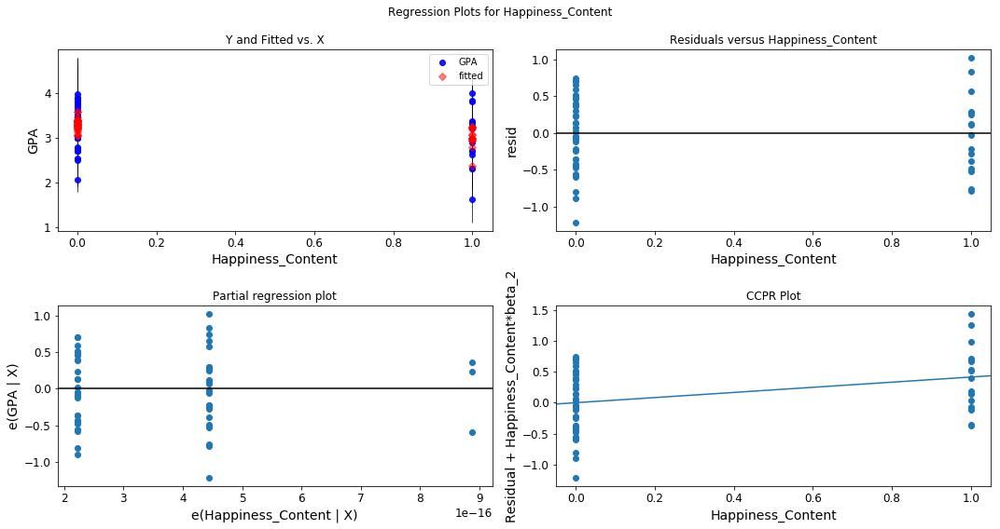

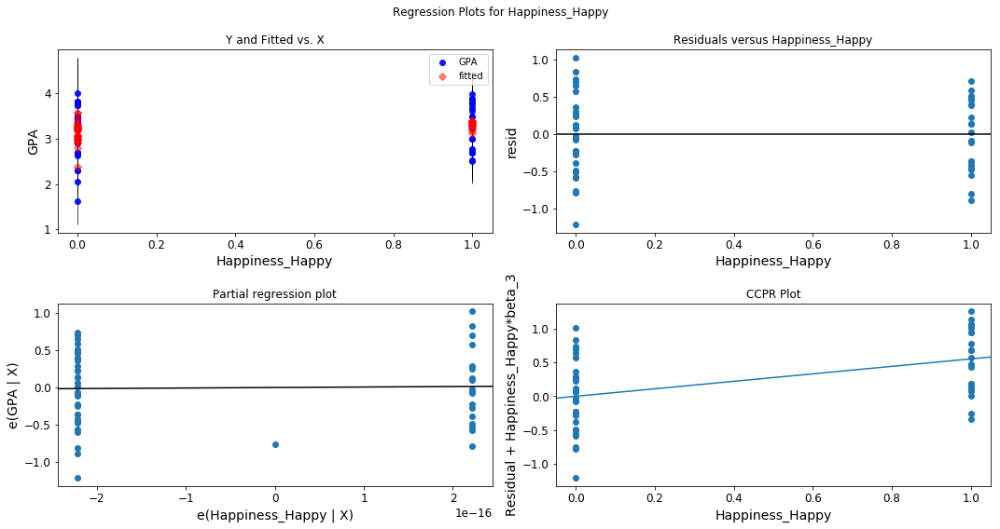

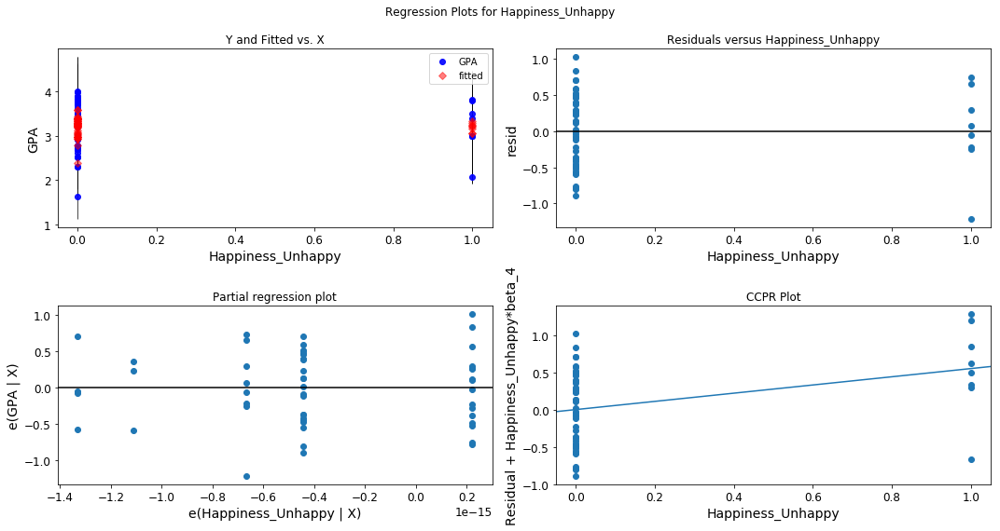

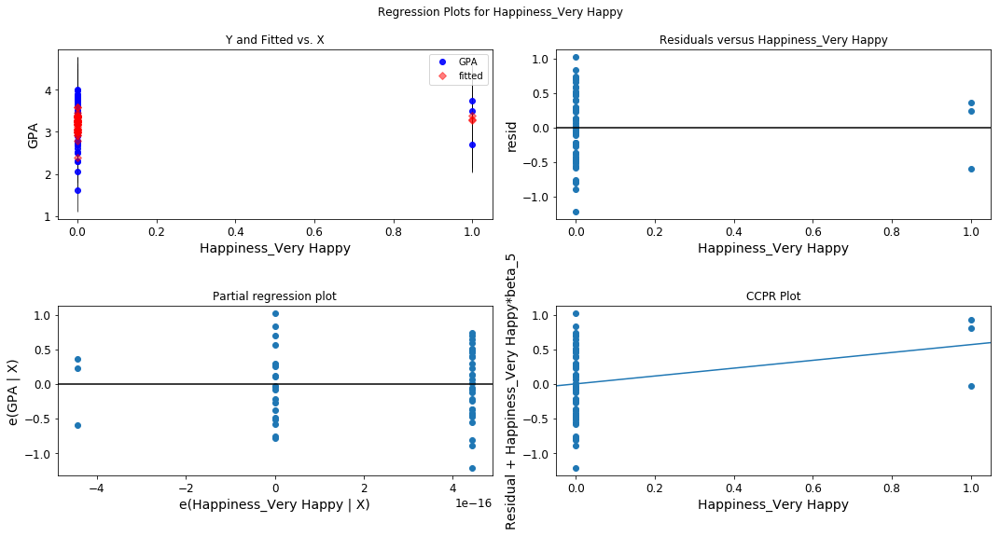

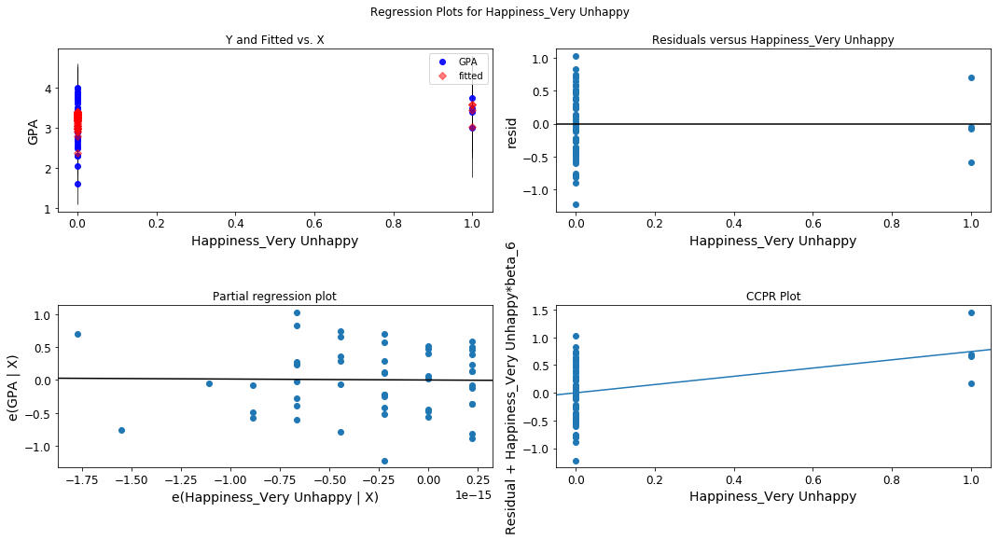

In [73]:
female_feature_run_7 = list(x_female_run_7)

for i in range(1, len(female_feature_run_7)):
    fig = plt.figure(figsize=(15,8))
    female_feature_run_7 = list(x_female_run_7)[i]
    fig = sm.graphics.plot_regress_exog(model_female_run_7, female_feature_run_7, fig=fig)

# Female Data. Run 8. Drop feature with the highest p-value.

In [74]:
x_female_run_7_to_remove = ['Classes missed']

x_female_run_8 = x_female_run_7.drop(x_female_run_7_to_remove, axis = 1)

In [75]:
model_female_run_8 = sm.OLS(y_female, x_female_run_8).fit()
print(model_female_run_8.summary())

                            OLS Regression Results                            
Dep. Variable:                    GPA   R-squared:                       0.070
Model:                            OLS   Adj. R-squared:                 -0.008
Method:                 Least Squares   F-statistic:                    0.8963
Date:                Sat, 01 Dec 2018   Prob (F-statistic):              0.474
Time:                        14:17:17   Log-Likelihood:                -40.431
No. Observations:                  53   AIC:                             90.86
Df Residuals:                      48   BIC:                             100.7
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2

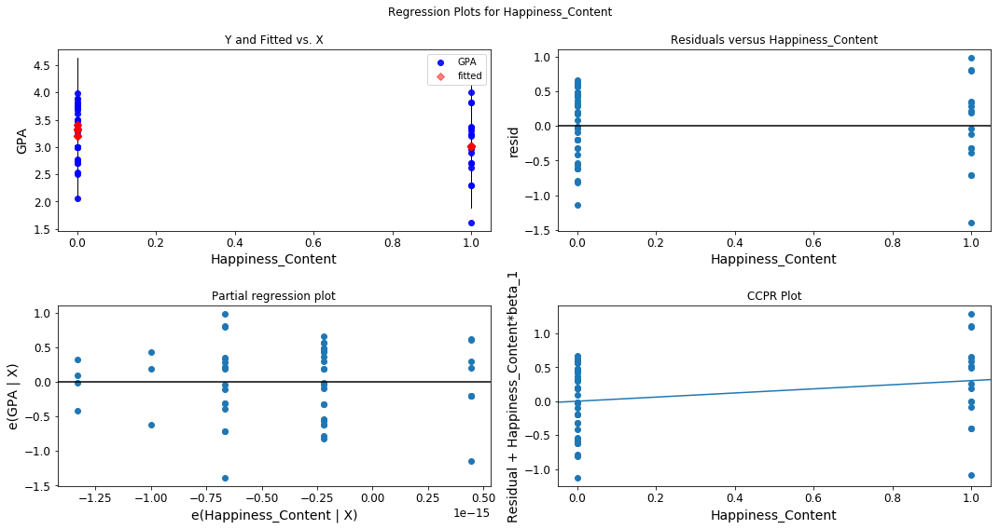

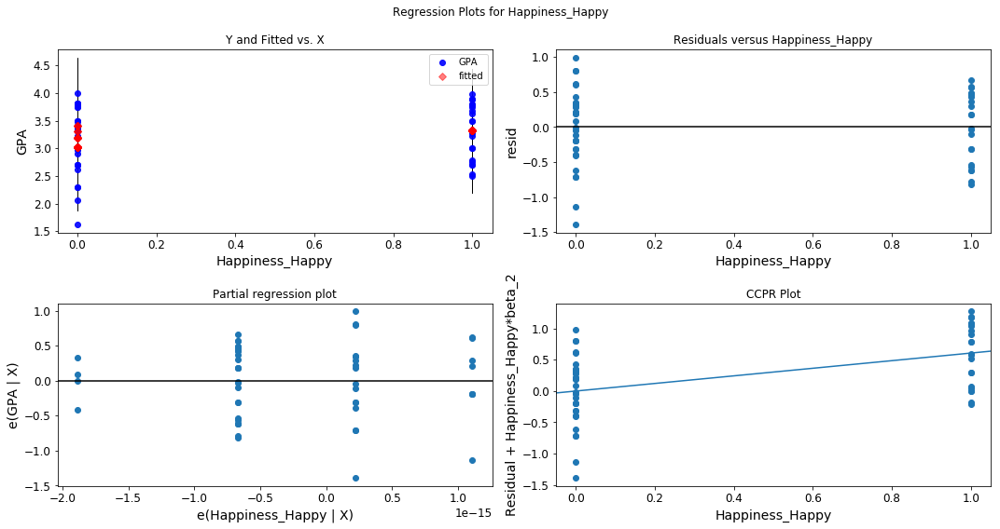

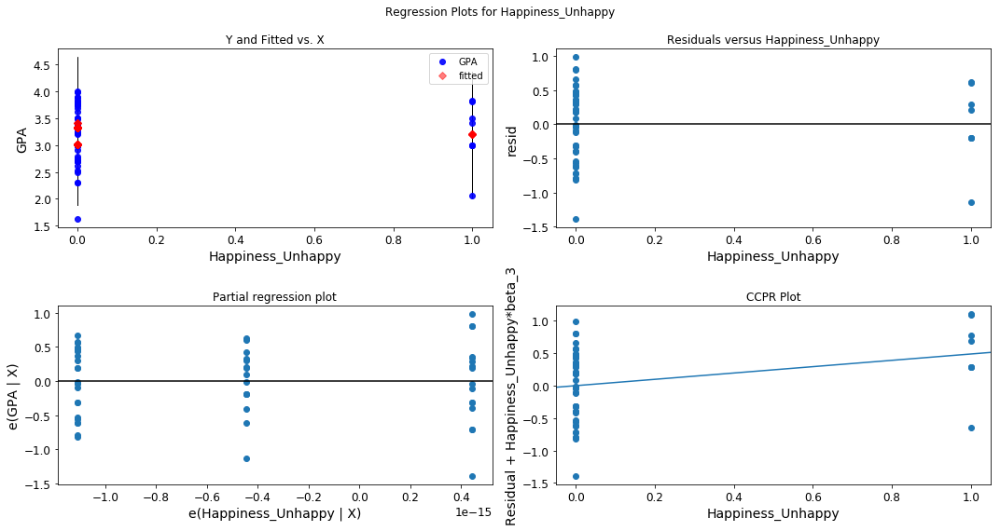

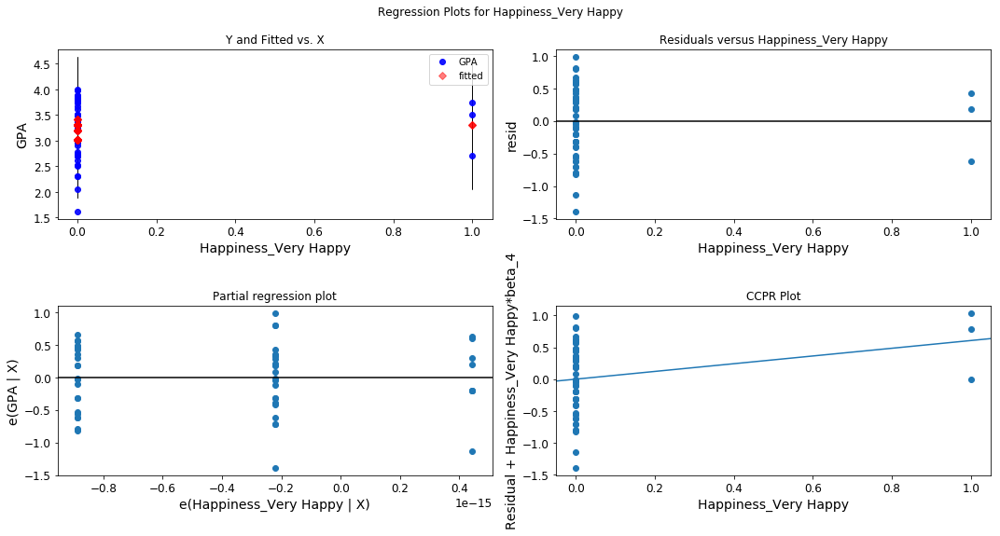

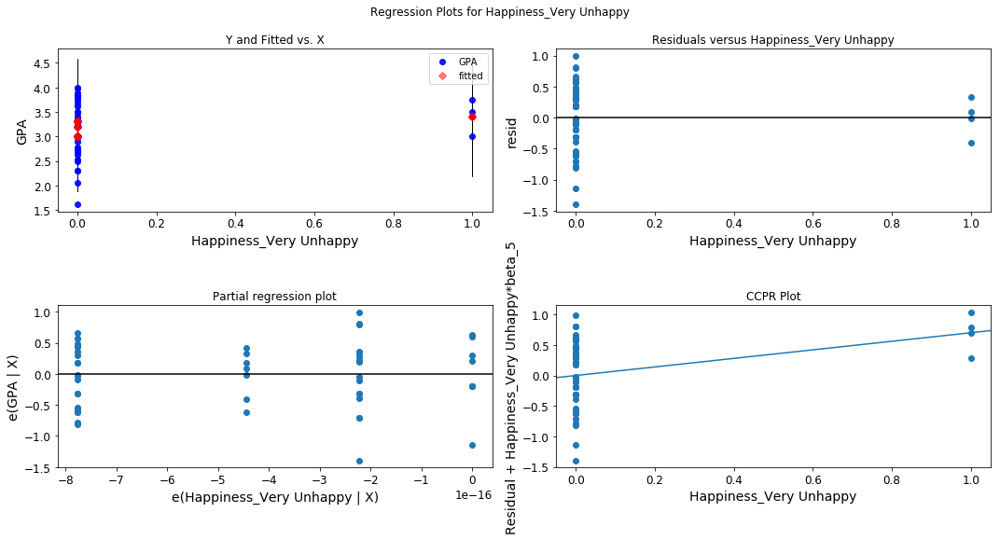

In [76]:
female_feature_run_8 = list(x_female_run_8)

for i in range(1, len(female_feature_run_8)):
    fig = plt.figure(figsize=(15,8))
    female_feature_run_8 = list(x_female_run_8)[i]
    fig = sm.graphics.plot_regress_exog(model_female_run_8, female_feature_run_8, fig=fig)

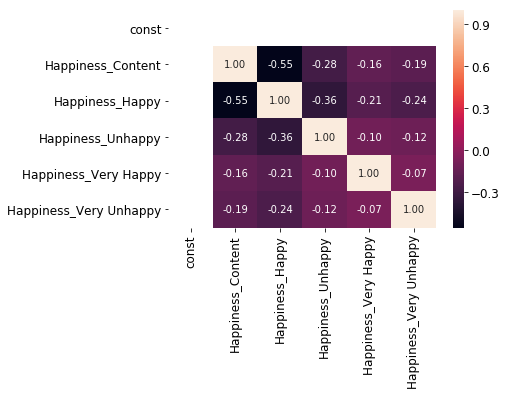

In [77]:
sns.heatmap(x_female_run_8.corr(), annot=True, fmt=".2f")
plt.show()

### Inconclusive results for female data

In [149]:
model_female_run_8.conf_int(alpha=0.05)

,0,1
const,2.542734,2.872887
Happiness_Content,0.025991,0.582138
Happiness_Happy,0.355319,0.859970
Happiness_Unhappy,0.131459,0.845320
Happiness_Very Happy,0.063015,1.148031
Happiness_Very Unhappy,0.225169,1.179210


# Total Data. Run 1. All features.

## Remove male and female columns

In [78]:
combined_data = combined_data.drop(['Gender_Female', 'Gender_Male'], axis = 1)

In [79]:
combined_feature_run_1 = list(combined_data)
y_combined = combined_data["GPA"]
x_combined_run_1 = combined_data.loc[:, "Extracurricular Hours":]
x_combined_run_1 = sm.add_constant(x_combined_run_1)

In [80]:
model_combined_run_1 = sm.OLS(y_combined, x_combined_run_1).fit()
print(model_combined_run_1.summary())

                            OLS Regression Results                            
Dep. Variable:                    GPA   R-squared:                       0.302
Model:                            OLS   Adj. R-squared:                  0.217
Method:                 Least Squares   F-statistic:                     3.574
Date:                Sat, 01 Dec 2018   Prob (F-statistic):           0.000332
Time:                        14:17:20   Log-Likelihood:                -57.766
No. Observations:                 103   AIC:                             139.5
Df Residuals:                      91   BIC:                             171.1
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2

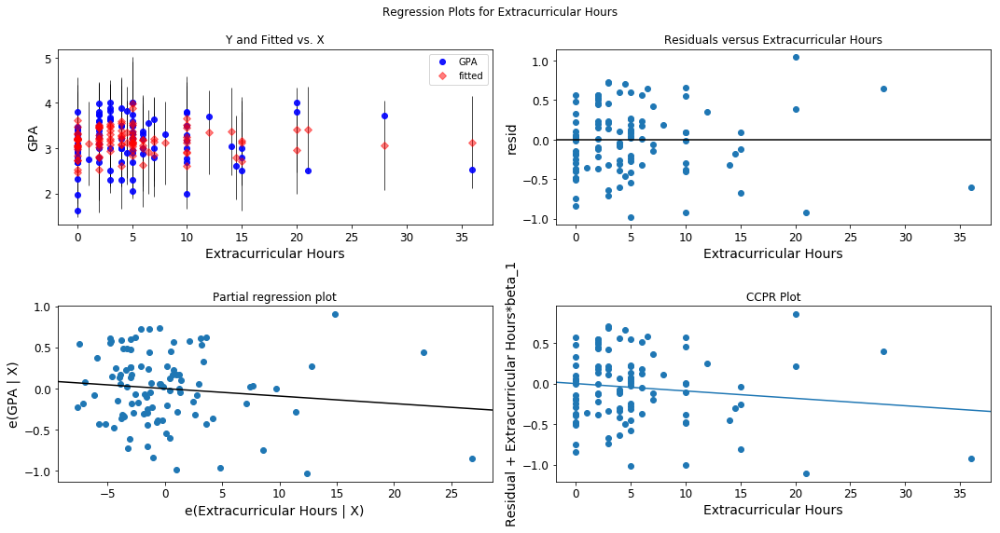

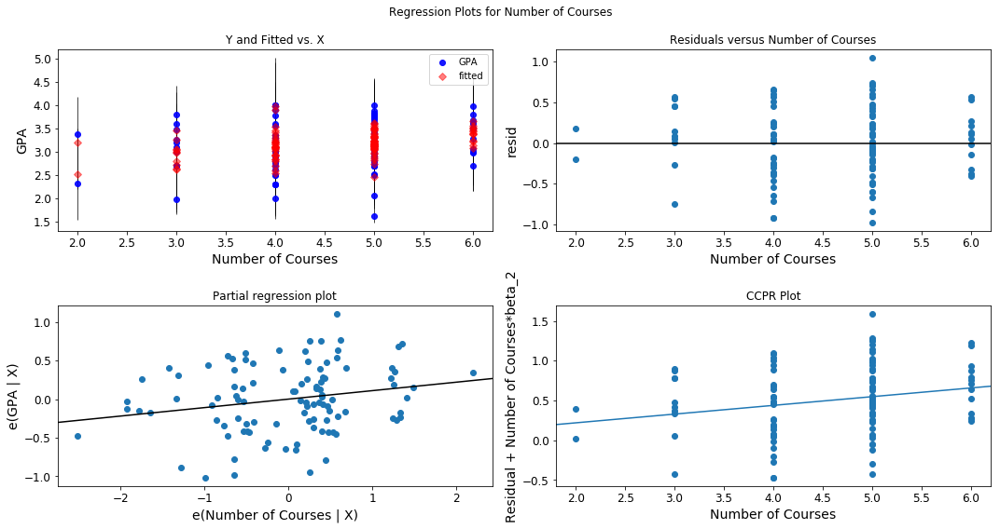

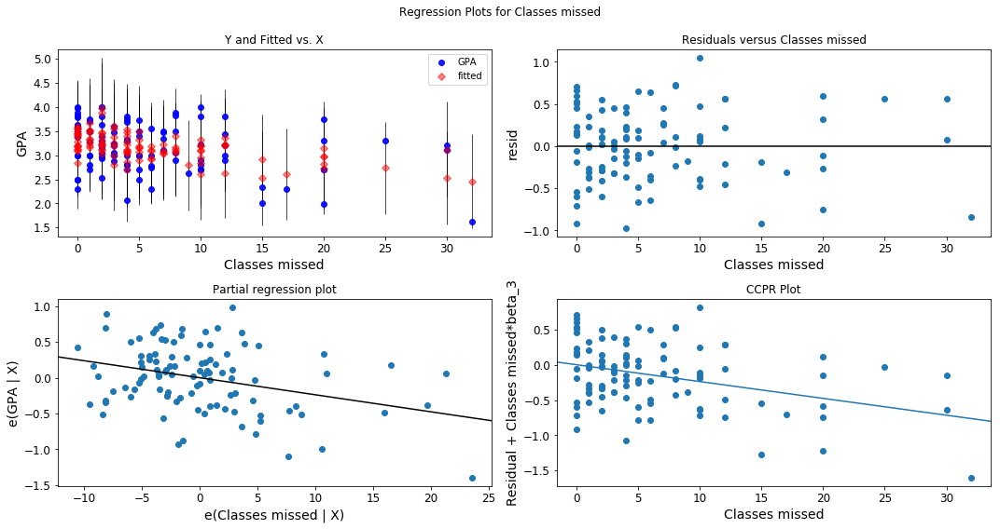

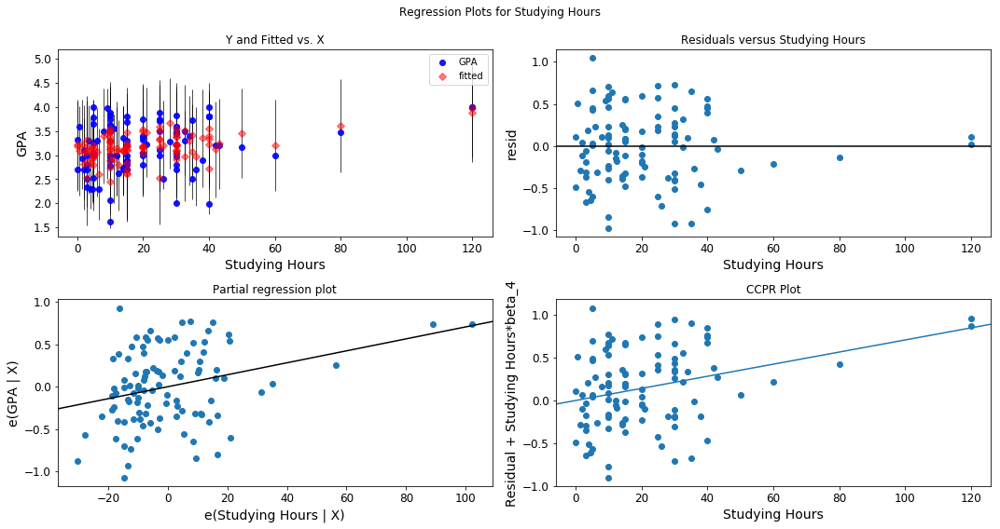

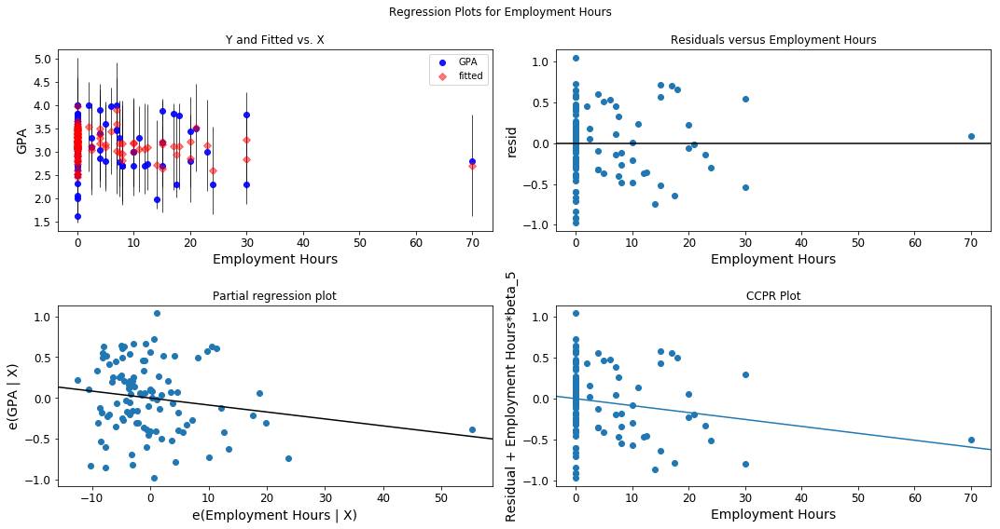

...

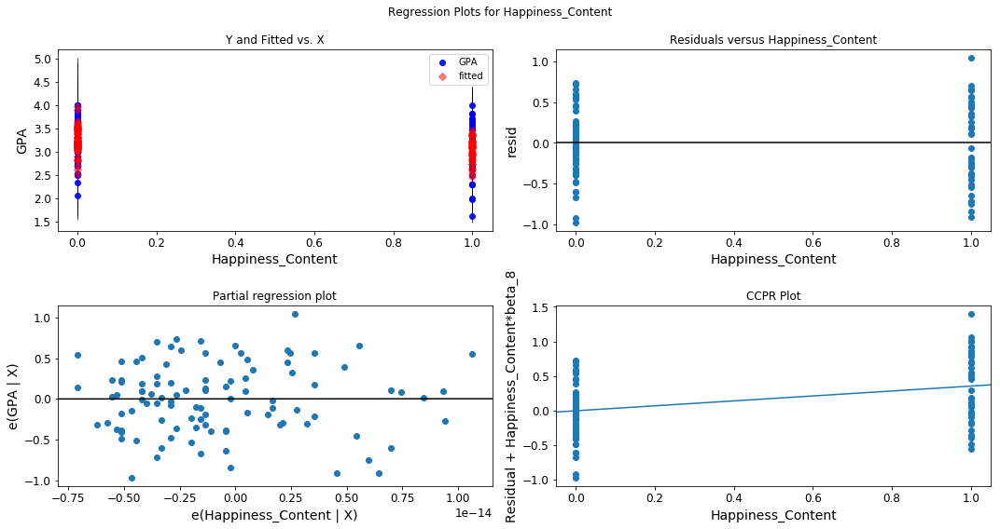

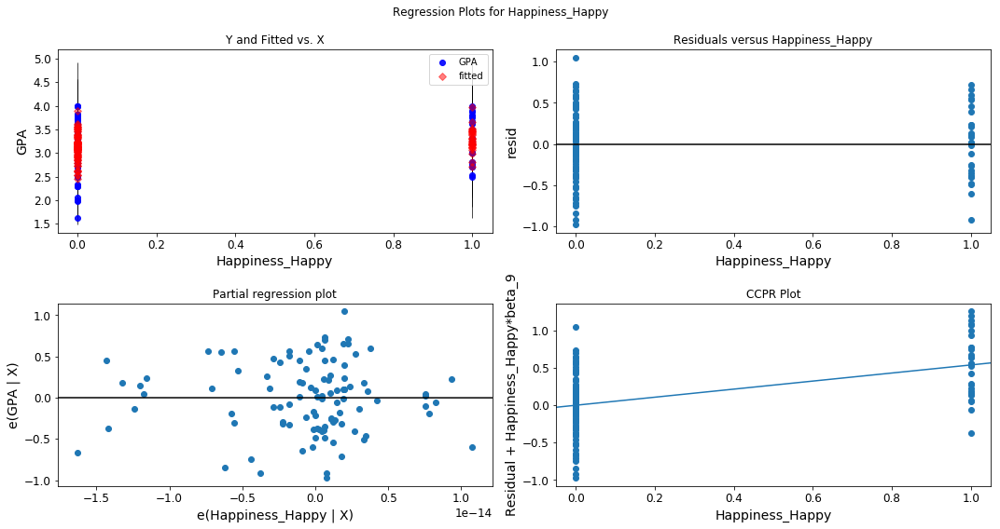

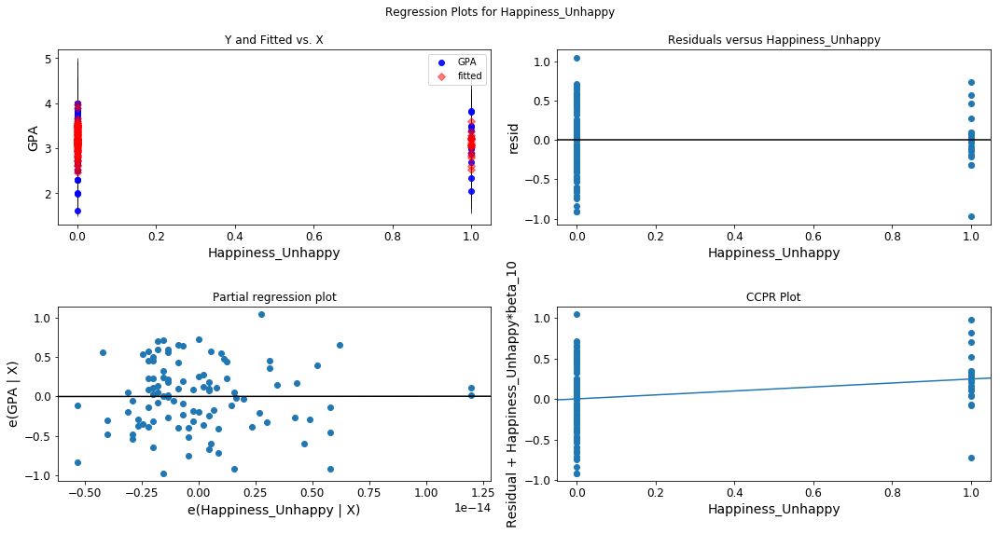

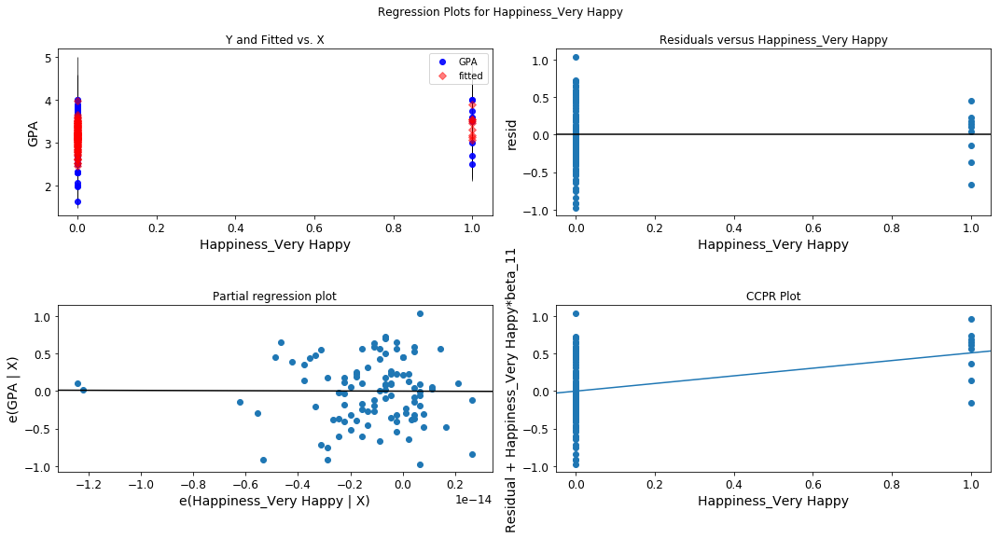

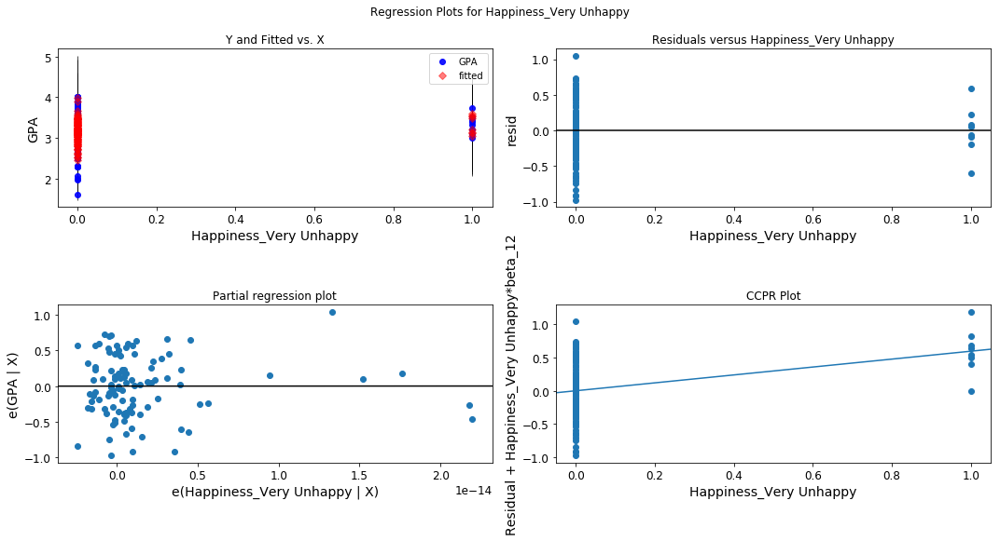

In [81]:
for i in range(1, len(combined_feature_run_1)):
    fig = plt.figure(figsize=(15,8))
    combined_feature_run_1 = list(x_combined_run_1)[i]
    fig = sm.graphics.plot_regress_exog(model_combined_run_1, combined_feature_run_1, fig=fig)

# Combined Data. Run 2. Drop feature with the highest p-value.

In [82]:
x_combined_run_1_to_remove = ['Extracurricular Hours']

x_combined_run_2 = x_combined_run_1.drop(x_combined_run_1_to_remove, axis = 1)

In [83]:
model_combined_run_2 = sm.OLS(y_combined, x_combined_run_2).fit()
print(model_combined_run_2.summary())

                            OLS Regression Results                            
Dep. Variable:                    GPA   R-squared:                       0.292
Model:                            OLS   Adj. R-squared:                  0.215
Method:                 Least Squares   F-statistic:                     3.790
Date:                Sat, 01 Dec 2018   Prob (F-statistic):           0.000265
Time:                        14:17:26   Log-Likelihood:                -58.492
No. Observations:                 103   AIC:                             139.0
Df Residuals:                      92   BIC:                             168.0
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2

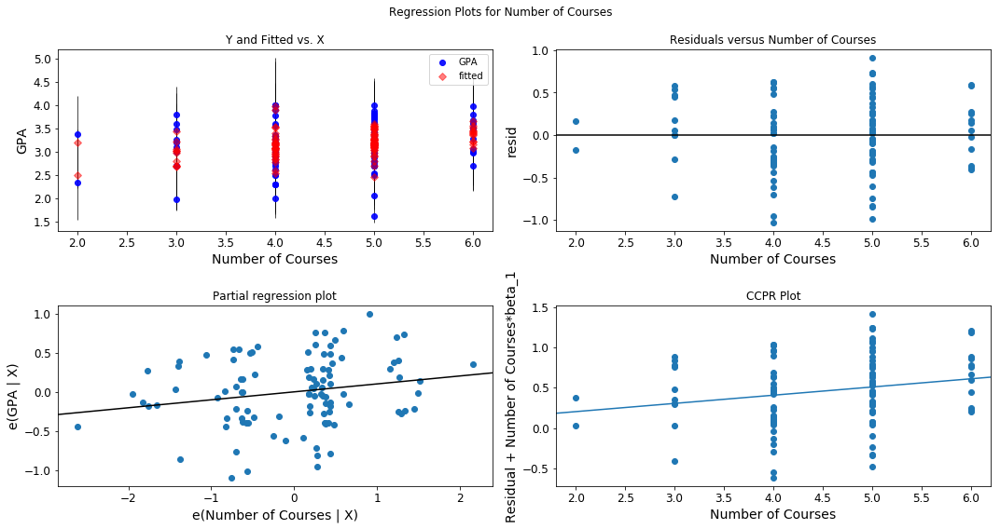

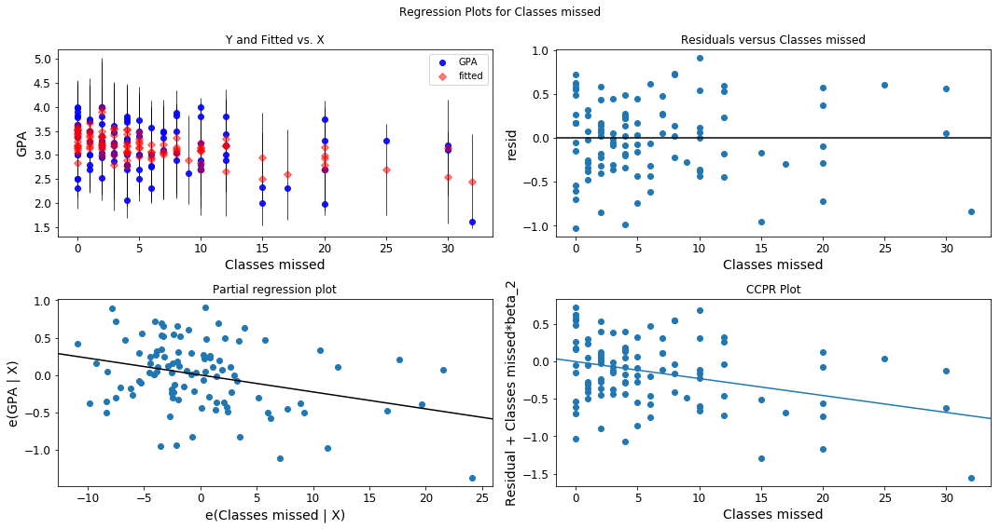

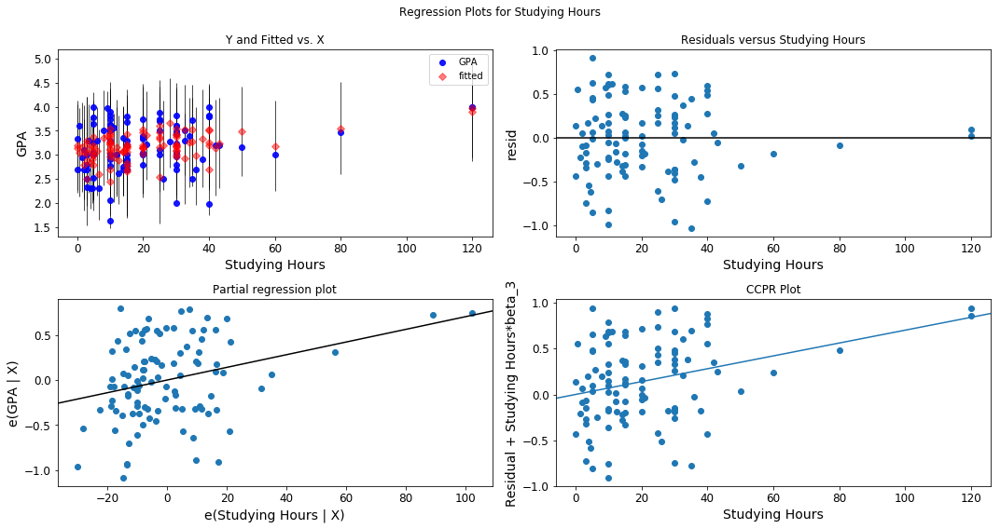

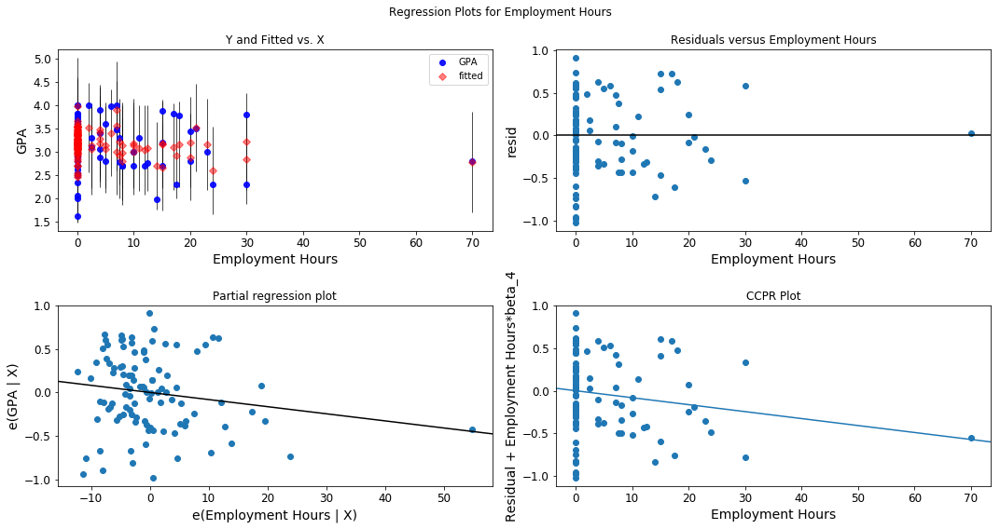

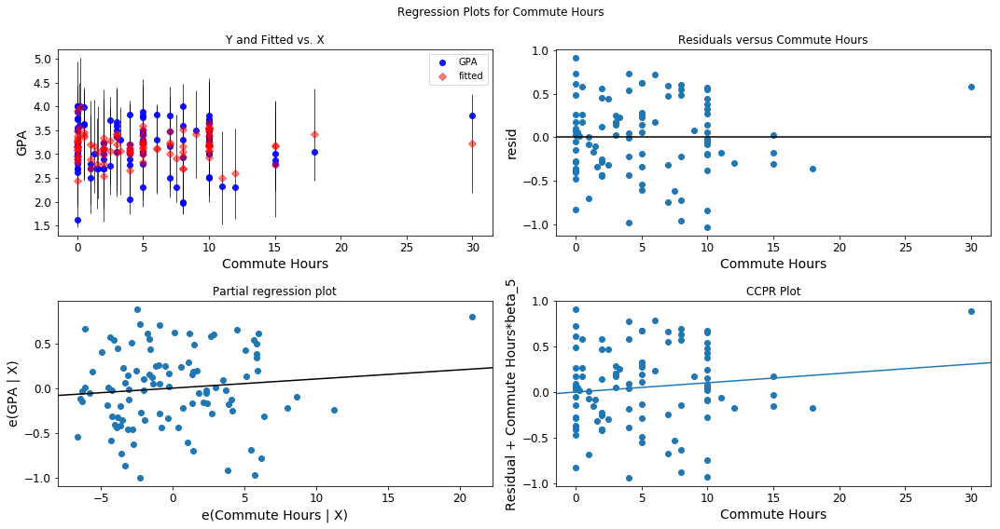

...

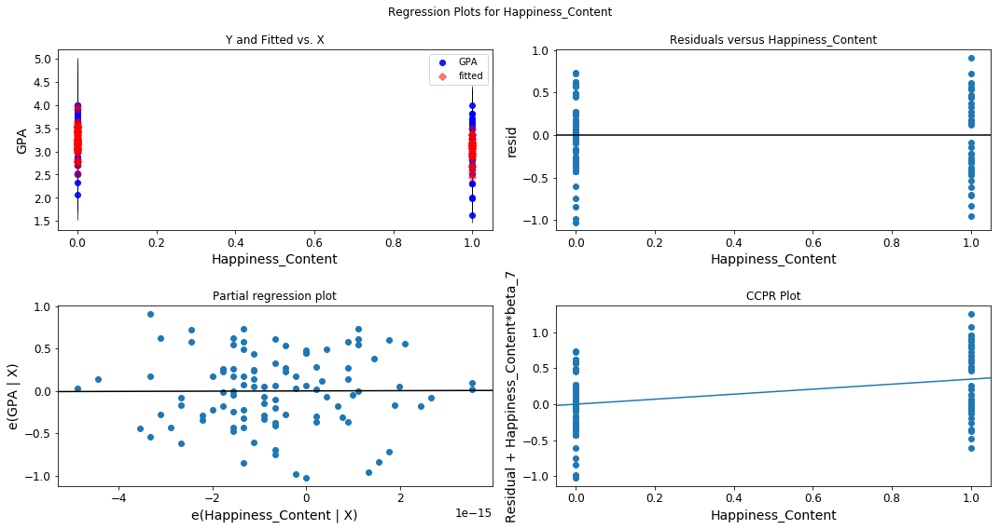

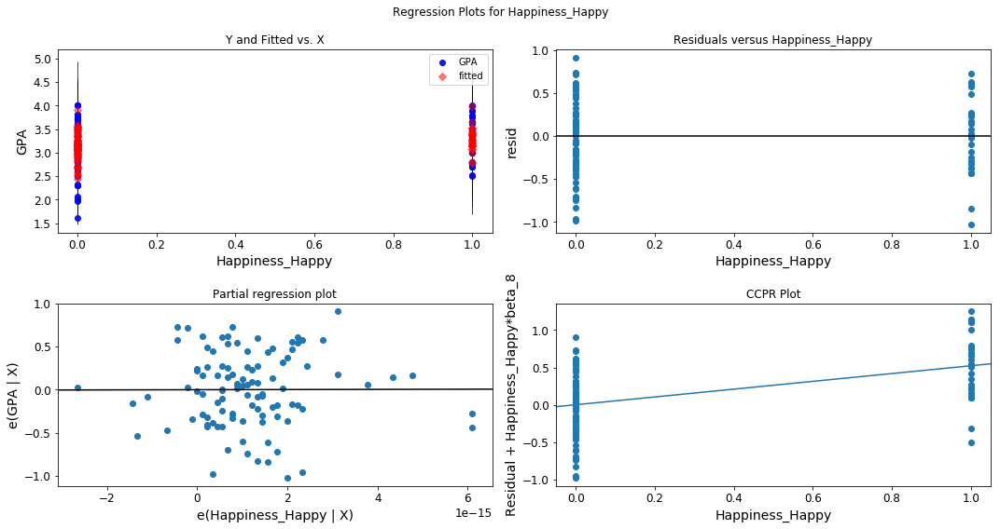

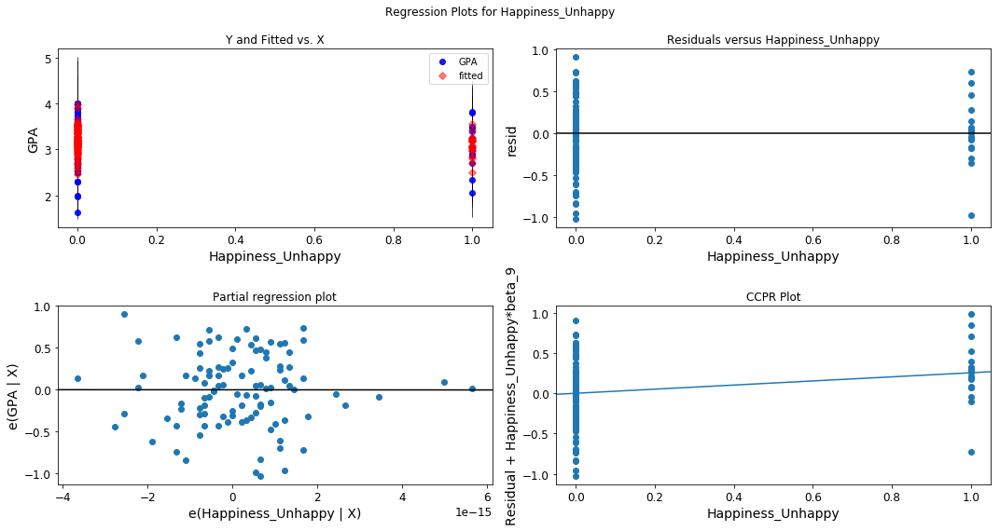

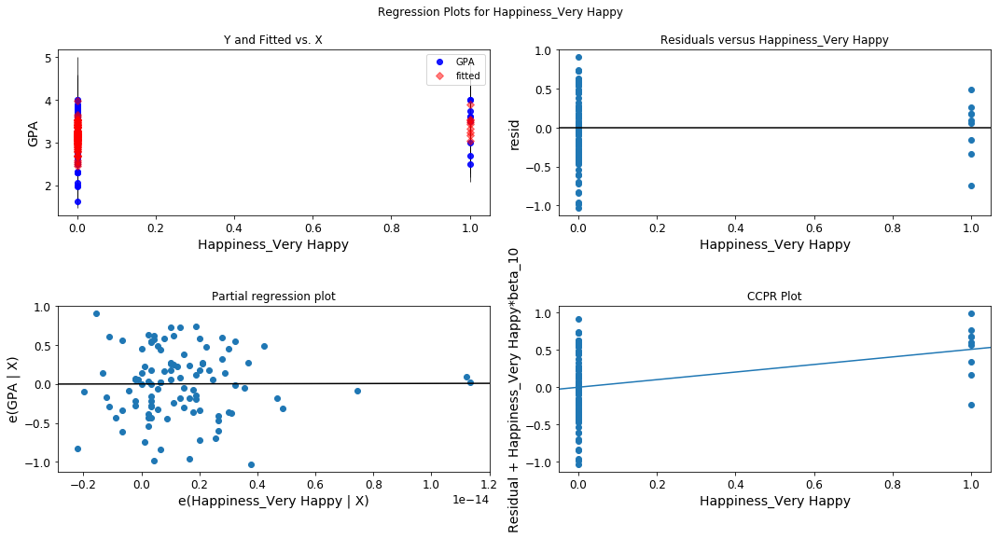

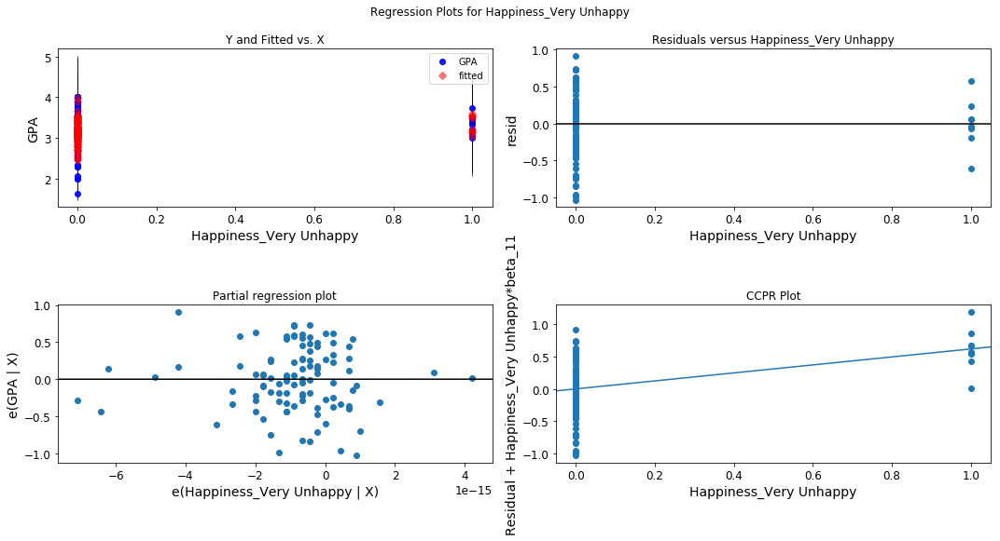

In [84]:
combined_feature_run_2 = list(x_combined_run_2)

for i in range(1, len(combined_feature_run_2)):
    fig = plt.figure(figsize=(15,8))
    combined_feature_run_2 = list(x_combined_run_2)[i]
    fig = sm.graphics.plot_regress_exog(model_combined_run_2, combined_feature_run_2, fig=fig)

# Combined Data. Run 3. Drop features with p-value >= 0.05

In [85]:
x_combined_run_2_to_remove = ['Commute Hours']

x_combined_run_3 = x_combined_run_2.drop(x_combined_run_2_to_remove, axis = 1)

In [86]:
model_combined_run_3 = sm.OLS(y_combined, x_combined_run_3).fit()
print(model_combined_run_3.summary())

                            OLS Regression Results                            
Dep. Variable:                    GPA   R-squared:                       0.284
Model:                            OLS   Adj. R-squared:                  0.215
Method:                 Least Squares   F-statistic:                     4.095
Date:                Sat, 01 Dec 2018   Prob (F-statistic):           0.000186
Time:                        14:17:31   Log-Likelihood:                -59.067
No. Observations:                 103   AIC:                             138.1
Df Residuals:                      93   BIC:                             164.5
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2

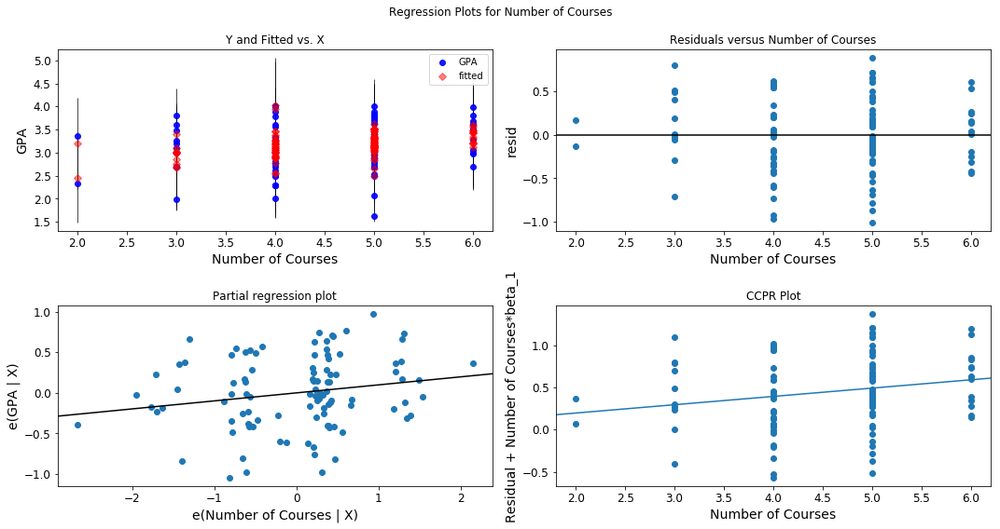

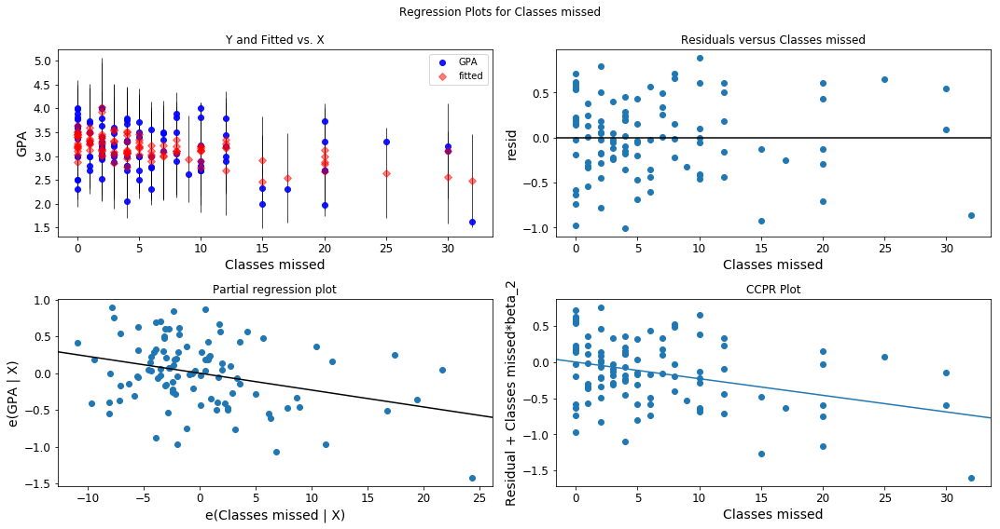

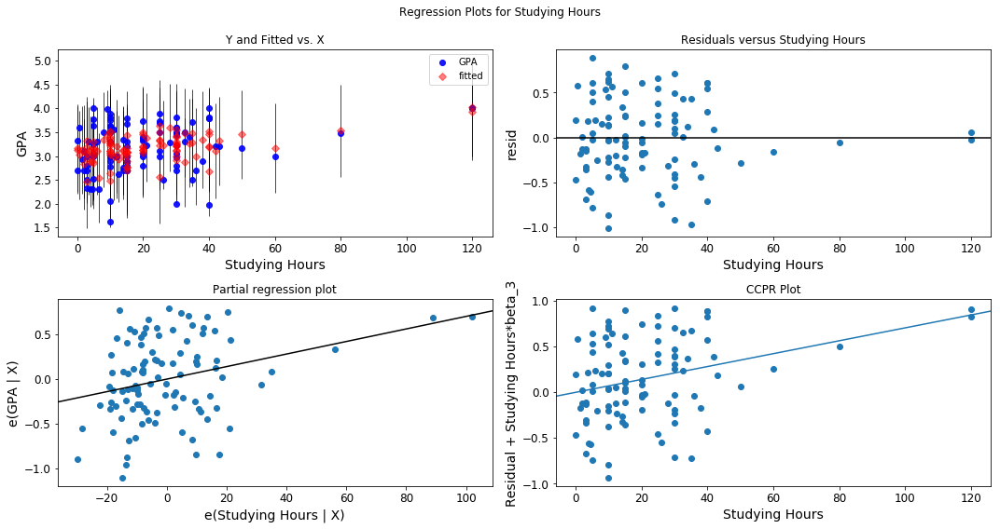

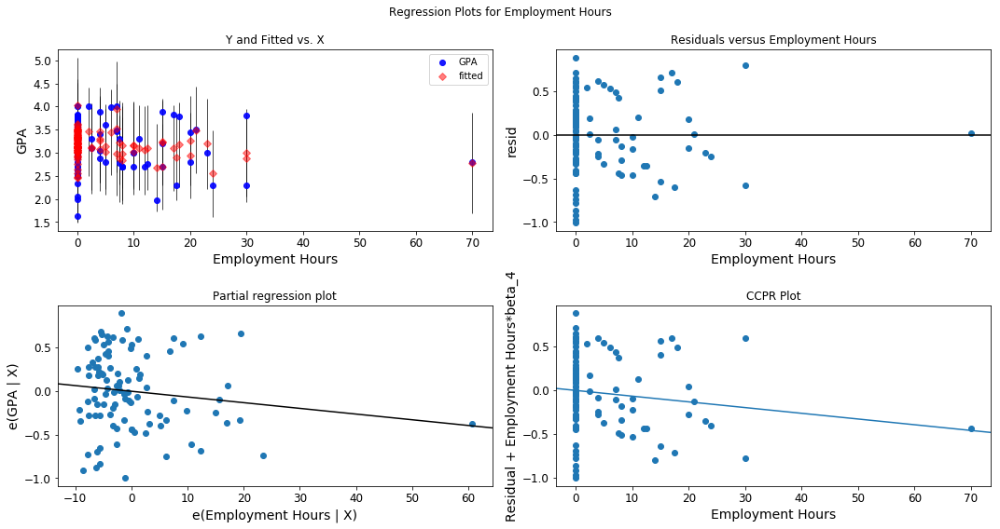

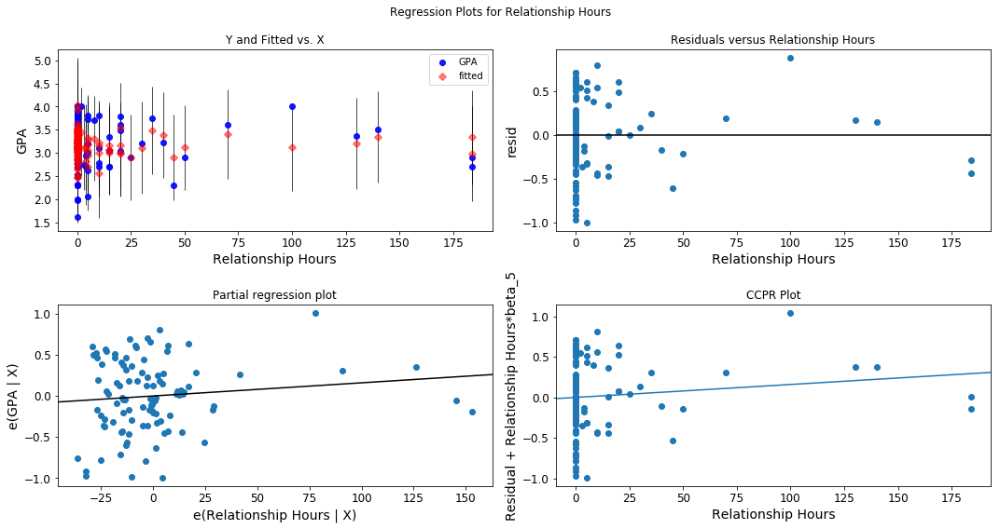

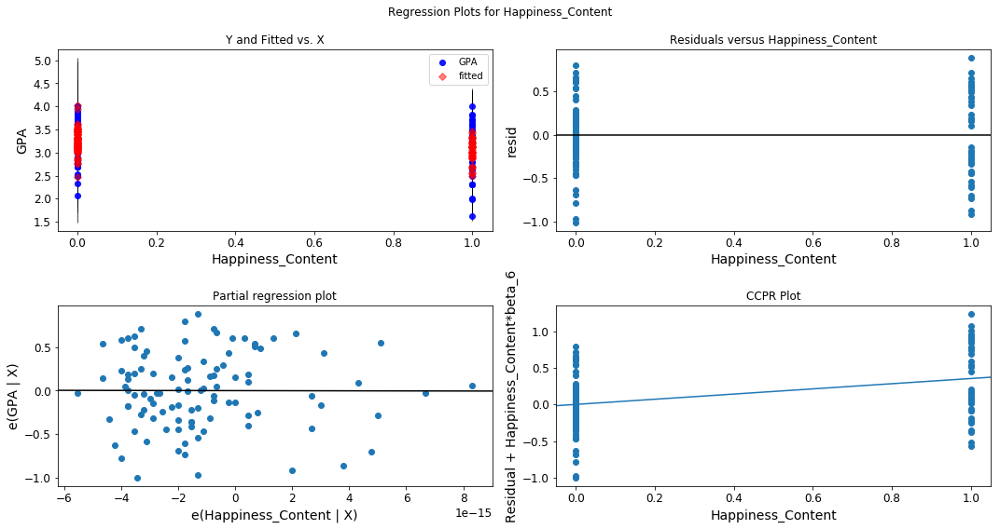

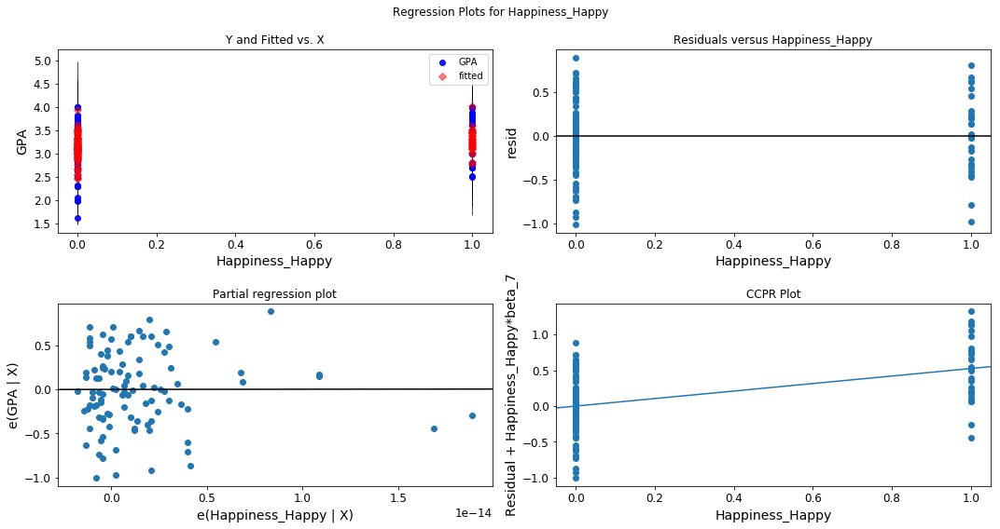

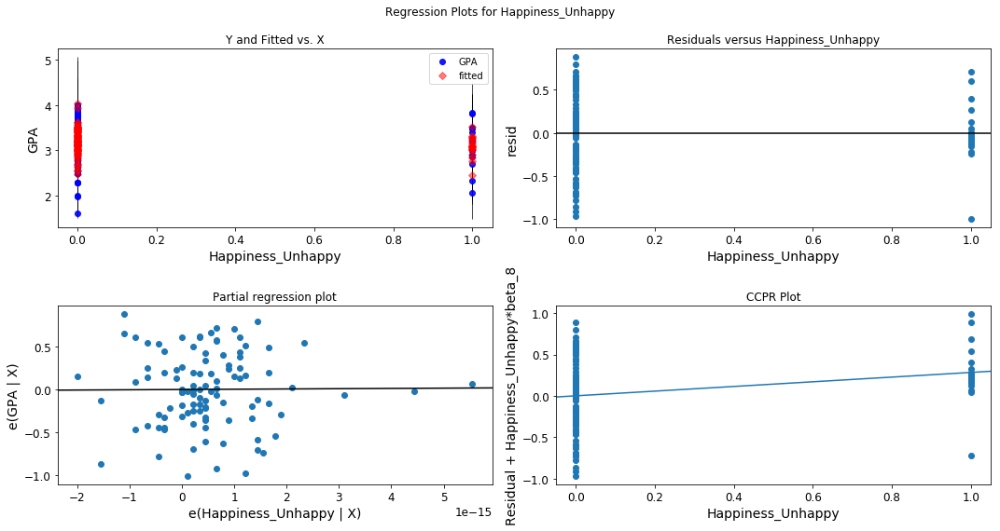

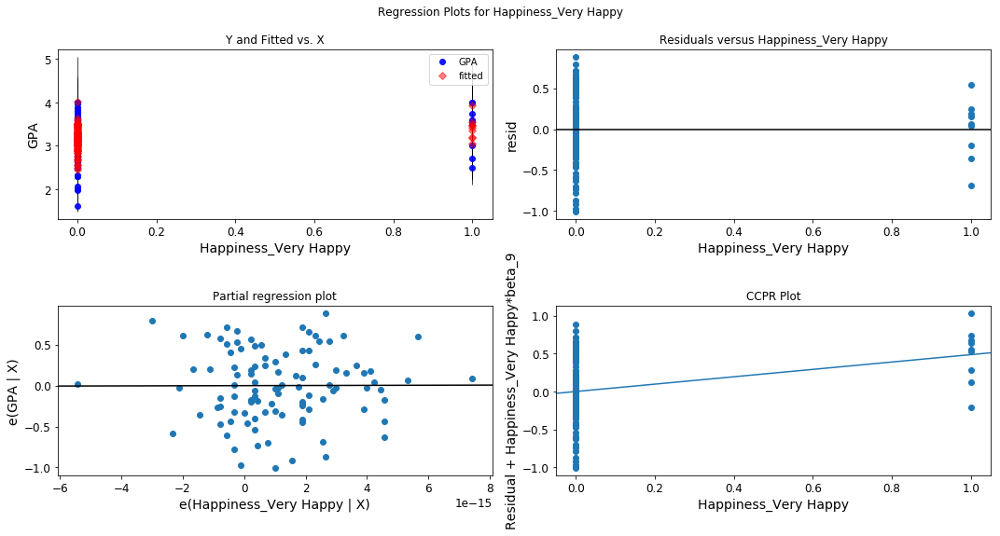

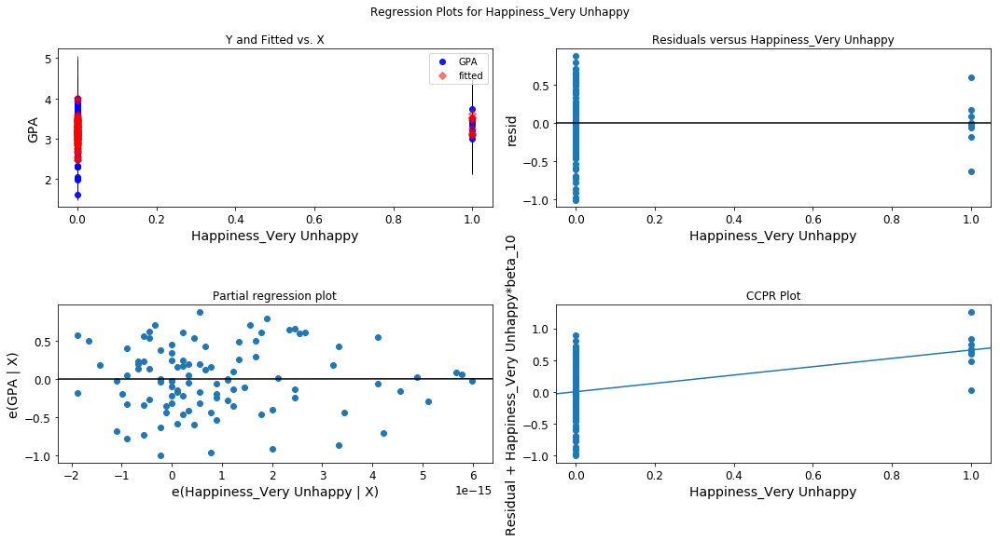

In [87]:
combined_feature_run_3 = list(x_combined_run_3)

for i in range(1, len(combined_feature_run_3)):
    fig = plt.figure(figsize=(15,8))
    combined_feature_run_3 = list(x_combined_run_3)[i]
    fig = sm.graphics.plot_regress_exog(model_combined_run_3, combined_feature_run_3, fig=fig)

# Combined Data. Run 4. Drop features with p-value >= 0.05

In [88]:
x_combined_run_3_to_remove = ['Relationship Hours']

x_combined_run_4 = x_combined_run_3.drop(x_combined_run_3_to_remove, axis = 1)

In [89]:
model_combined_run_4 = sm.OLS(y_combined, x_combined_run_4).fit()
print(model_combined_run_4.summary())

                            OLS Regression Results                            
Dep. Variable:                    GPA   R-squared:                       0.274
Model:                            OLS   Adj. R-squared:                  0.212
Method:                 Least Squares   F-statistic:                     4.437
Date:                Sat, 01 Dec 2018   Prob (F-statistic):           0.000138
Time:                        14:17:35   Log-Likelihood:                -59.762
No. Observations:                 103   AIC:                             137.5
Df Residuals:                      94   BIC:                             161.2
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2

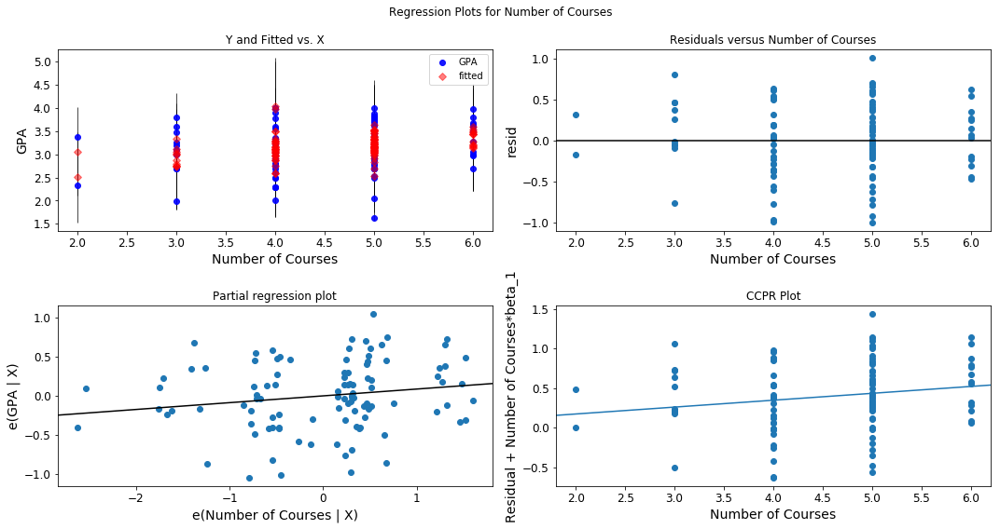

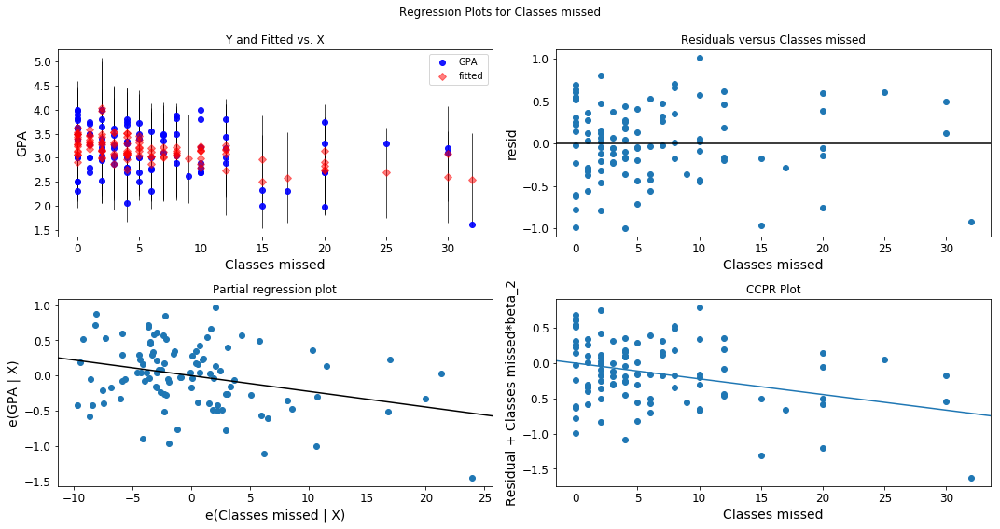

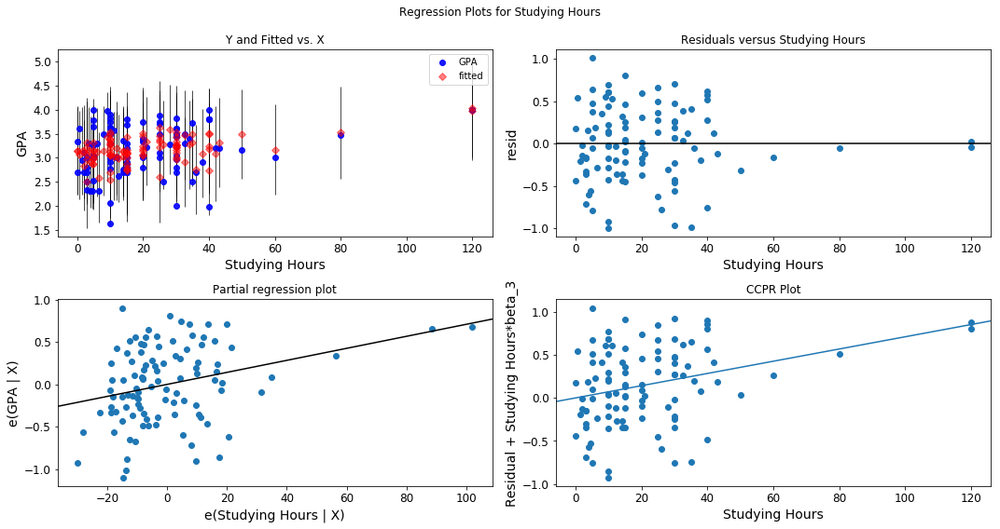

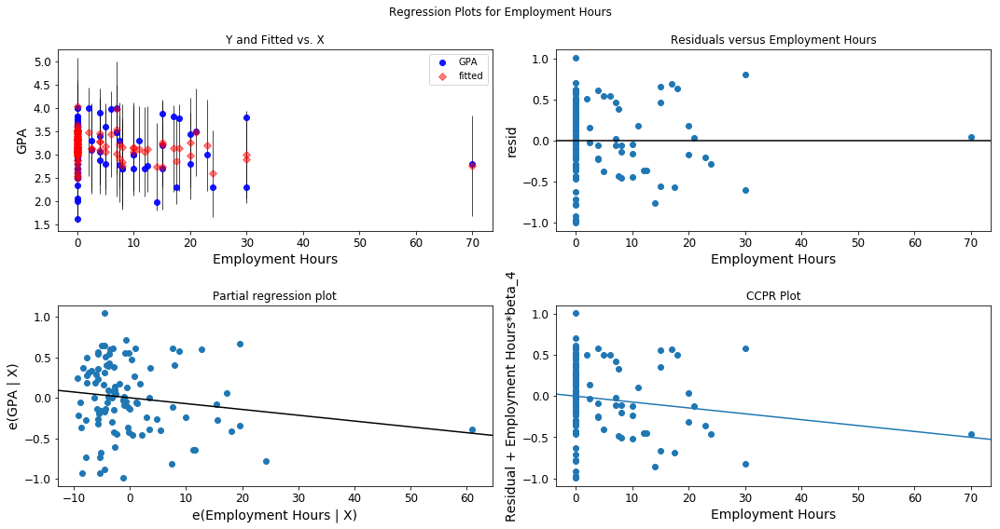

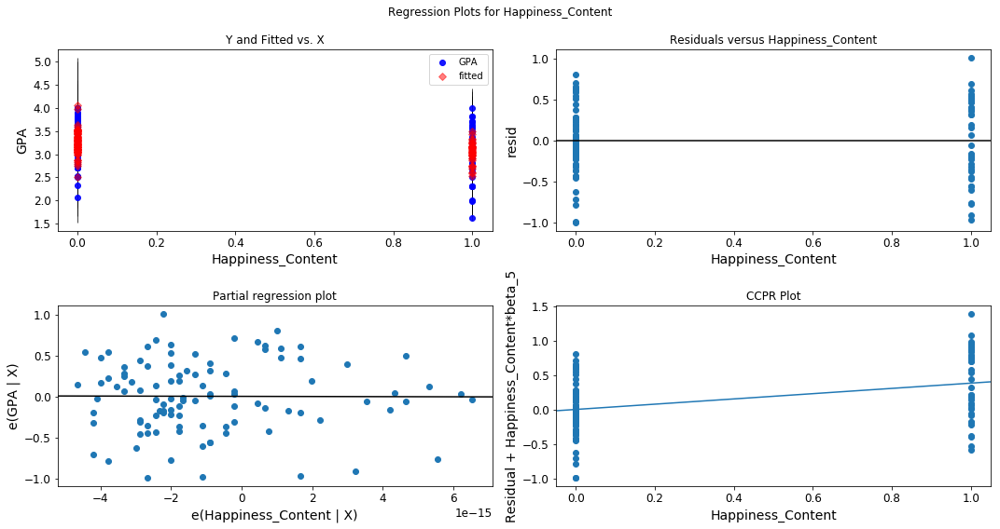

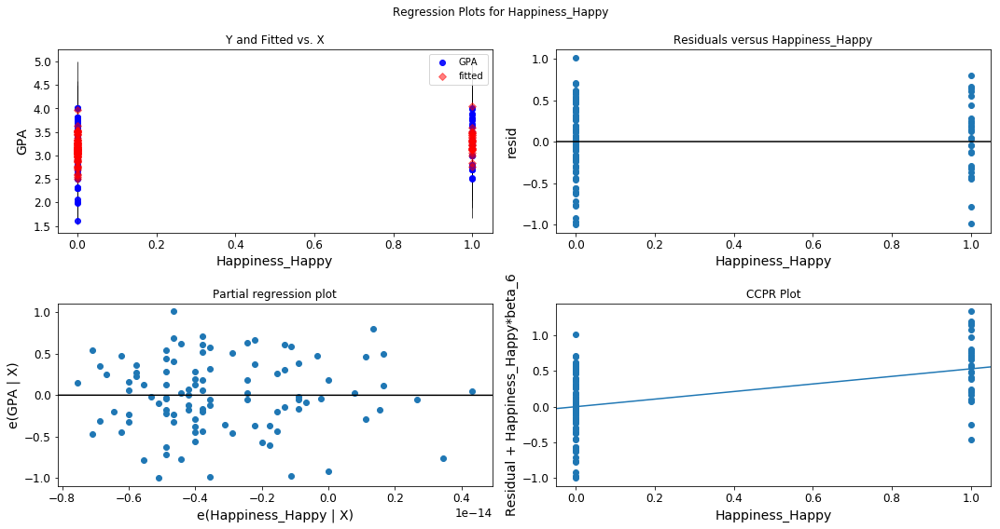

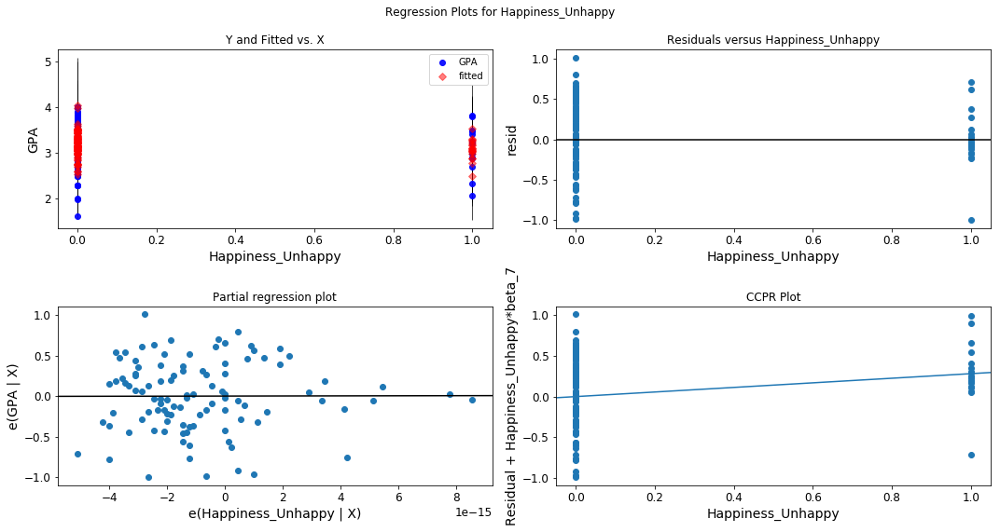

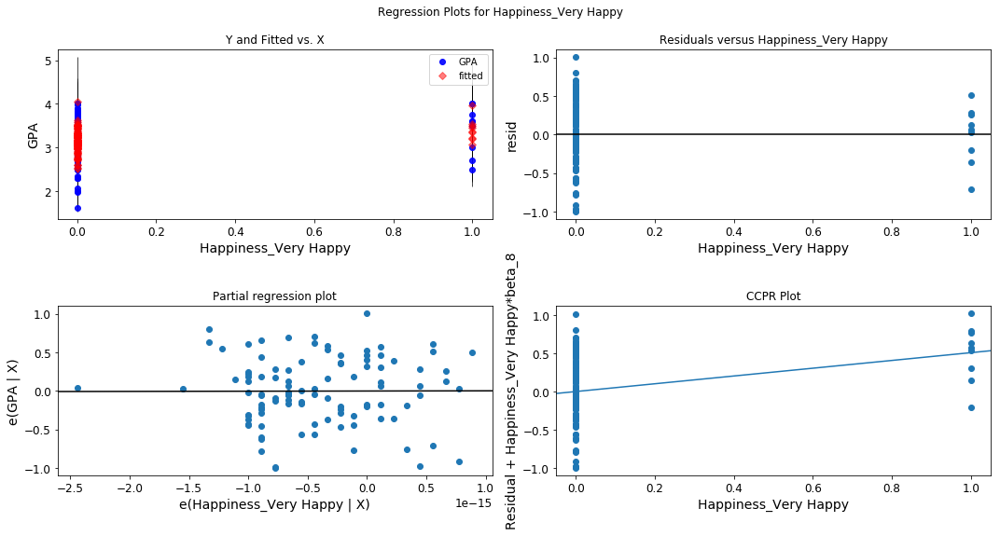

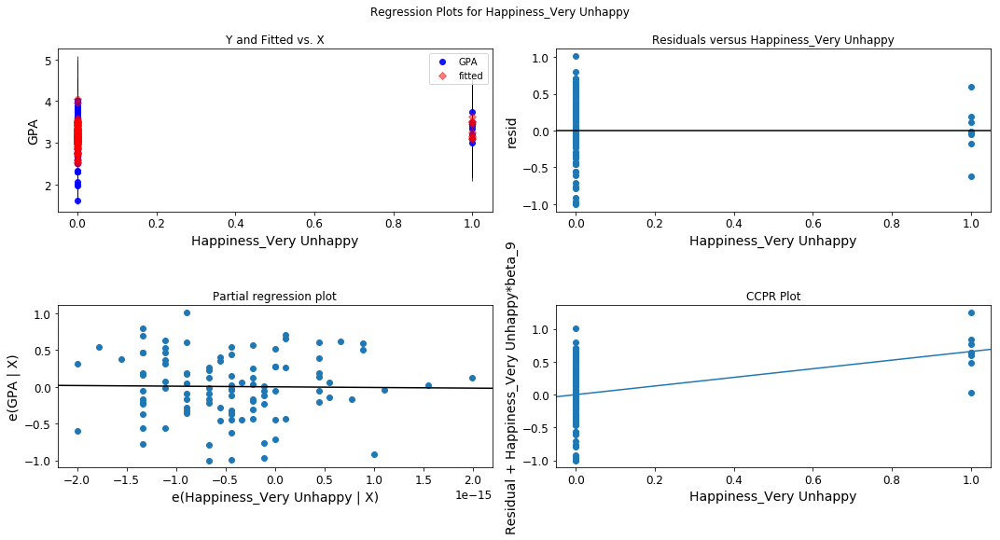

In [90]:
combined_feature_run_4 = list(x_combined_run_4)

for i in range(1, len(combined_feature_run_4)):
    fig = plt.figure(figsize=(15,8))
    combined_feature_run_4 = list(x_combined_run_4)[i]
    fig = sm.graphics.plot_regress_exog(model_combined_run_4, combined_feature_run_4, fig=fig)

# Combined Data. Run 5. Drop features with p-value >= 0.05

In [91]:
x_combined_run_4_to_remove = ['Employment Hours']

x_combined_run_5 = x_combined_run_4.drop(x_combined_run_4_to_remove, axis = 1)

In [92]:
model_combined_run_5 = sm.OLS(y_combined, x_combined_run_5).fit()
print(model_combined_run_5.summary())

                            OLS Regression Results                            
Dep. Variable:                    GPA   R-squared:                       0.257
Model:                            OLS   Adj. R-squared:                  0.202
Method:                 Least Squares   F-statistic:                     4.692
Date:                Sat, 01 Dec 2018   Prob (F-statistic):           0.000149
Time:                        14:17:39   Log-Likelihood:                -60.966
No. Observations:                 103   AIC:                             137.9
Df Residuals:                      95   BIC:                             159.0
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2

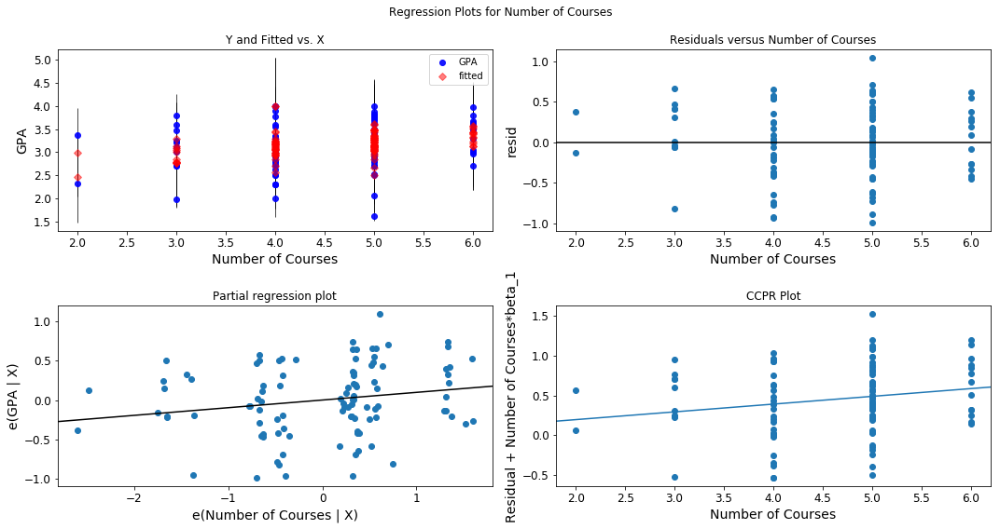

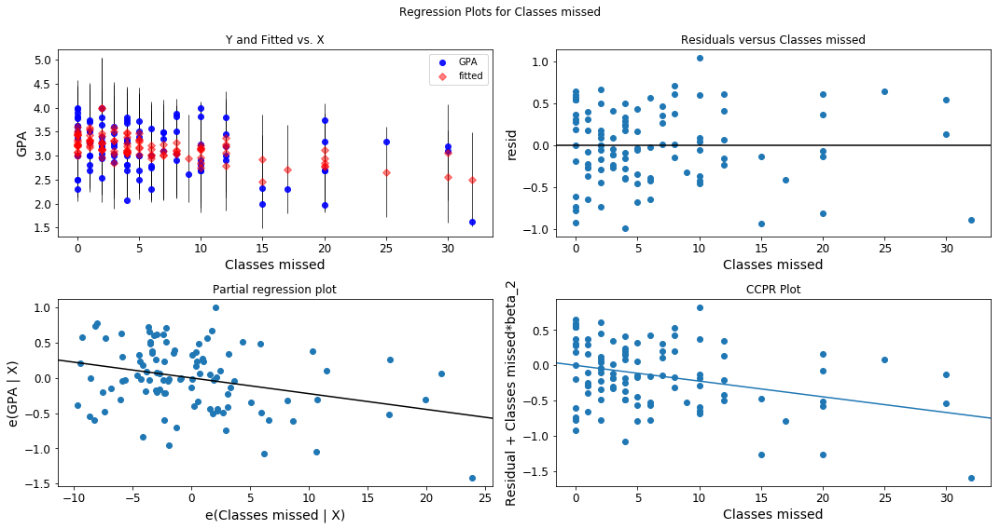

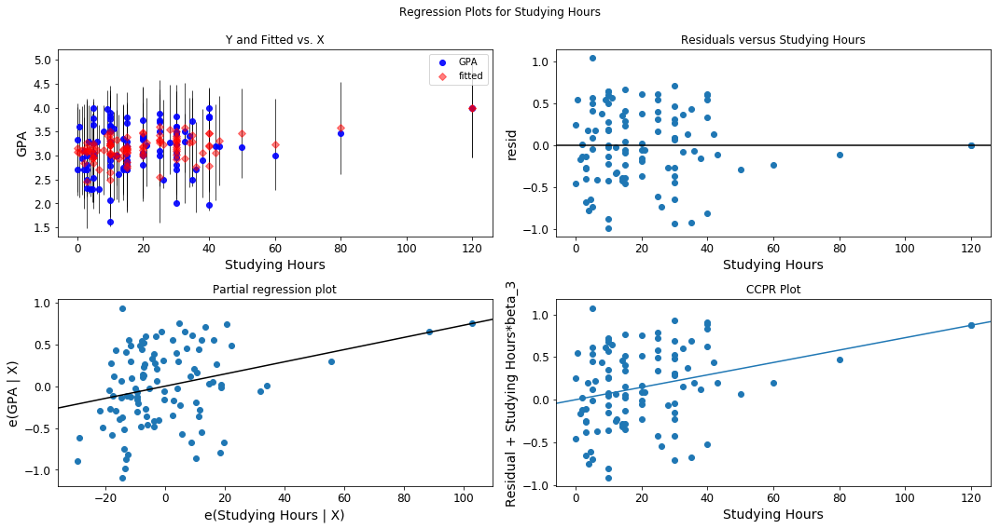

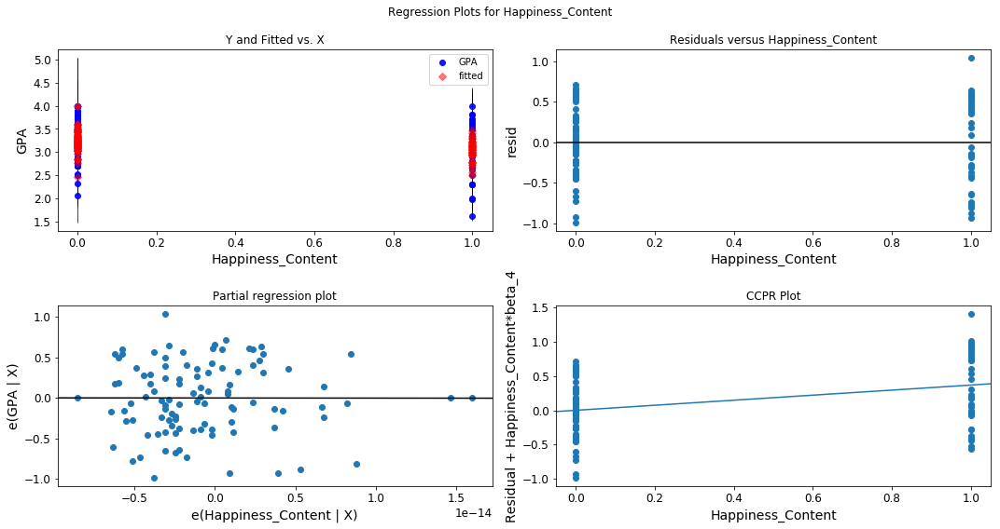

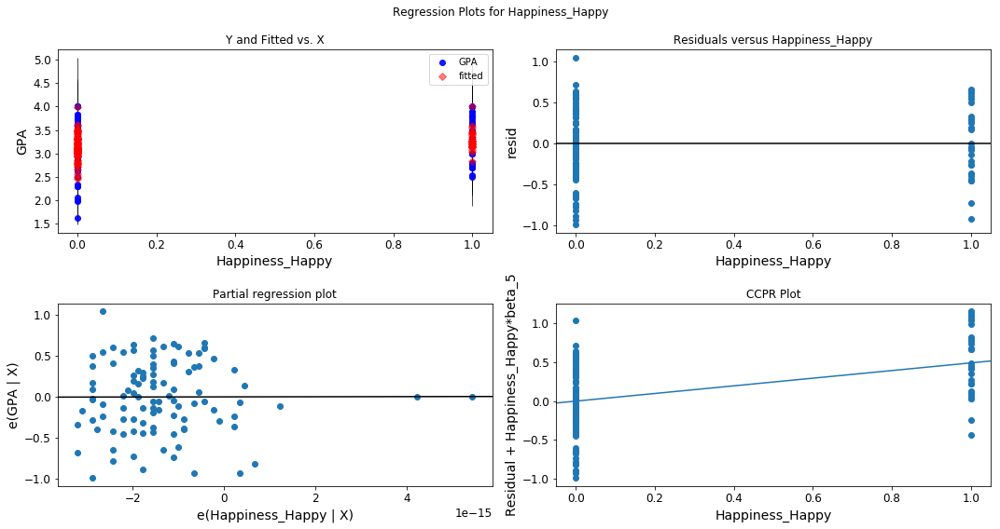

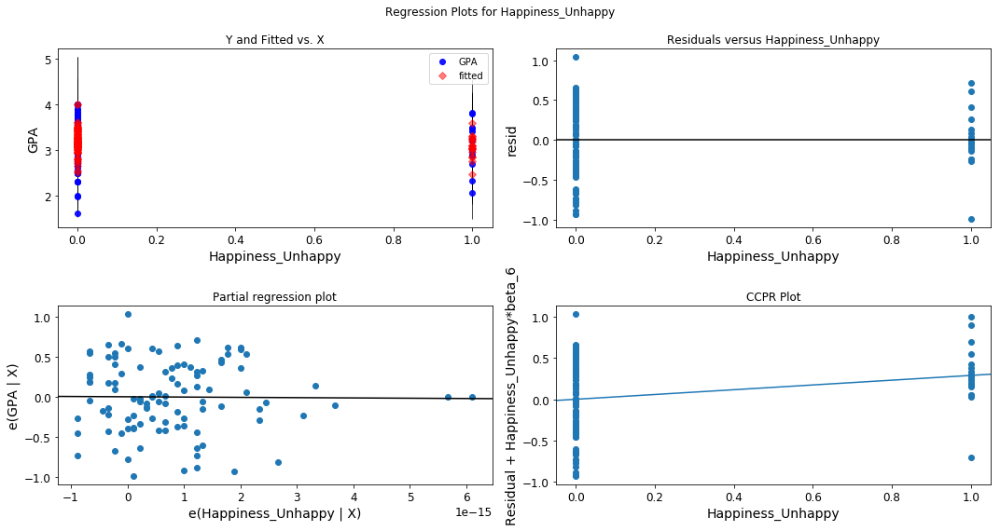

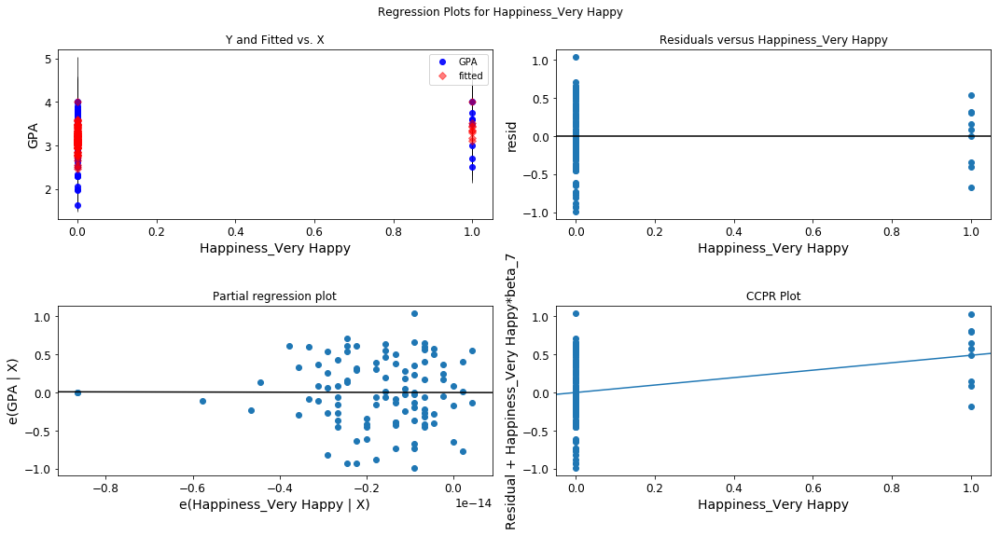

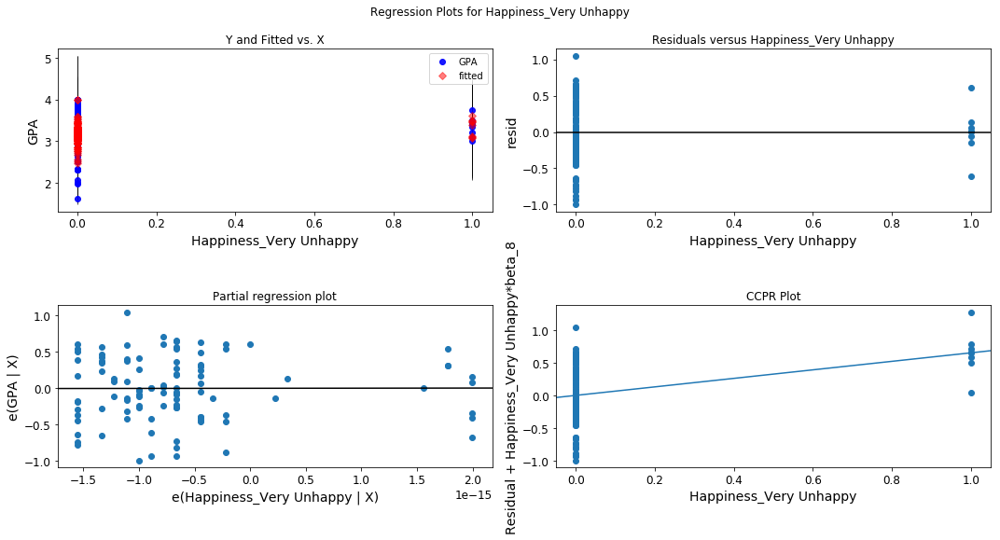

In [93]:
combined_feature_run_5 = list(x_combined_run_5)

for i in range(1, len(combined_feature_run_5)):
    fig = plt.figure(figsize=(15,8))
    combined_feature_run_5 = list(x_combined_run_5)[i]
    fig = sm.graphics.plot_regress_exog(model_combined_run_5, combined_feature_run_5, fig=fig)

# Combined Data. Run 6. Drop features with p-value >= 0.05

In [94]:
x_combined_run_5_to_remove = ['Number of Courses']

x_combined_run_6 = x_combined_run_5.drop(x_combined_run_5_to_remove, axis = 1)

In [95]:
model_combined_run_6 = sm.OLS(y_combined, x_combined_run_6).fit()
print(model_combined_run_6.summary())

                            OLS Regression Results                            
Dep. Variable:                    GPA   R-squared:                       0.228
Model:                            OLS   Adj. R-squared:                  0.180
Method:                 Least Squares   F-statistic:                     4.719
Date:                Sat, 01 Dec 2018   Prob (F-statistic):           0.000298
Time:                        14:17:44   Log-Likelihood:                -62.948
No. Observations:                 103   AIC:                             139.9
Df Residuals:                      96   BIC:                             158.3
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      2

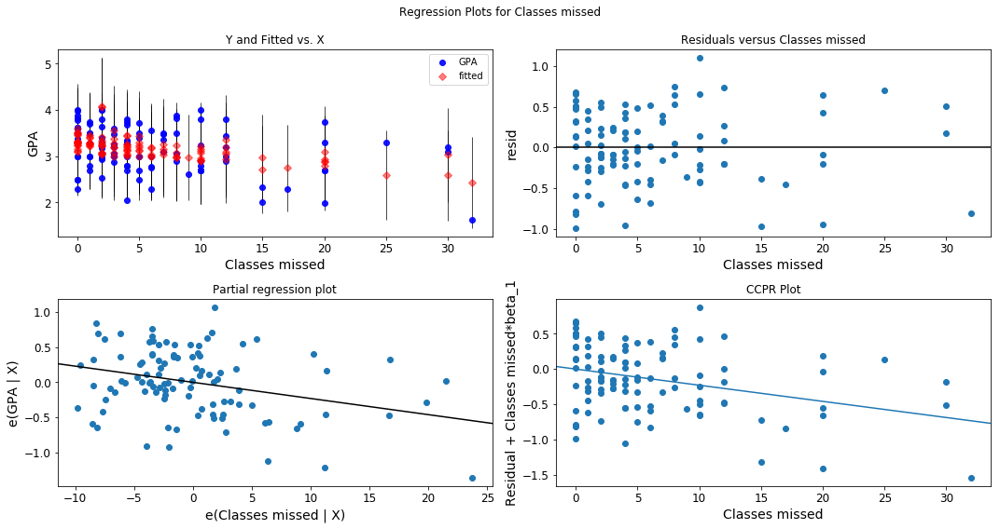

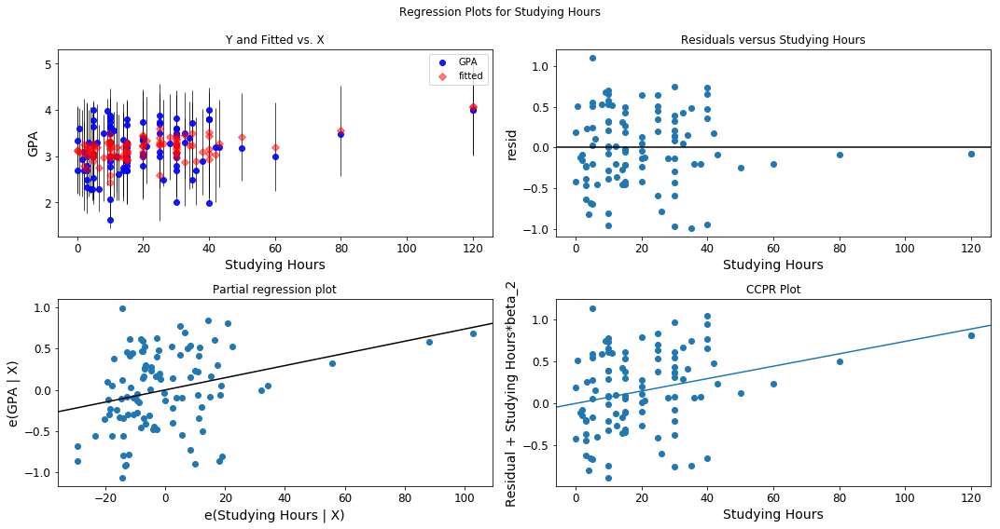

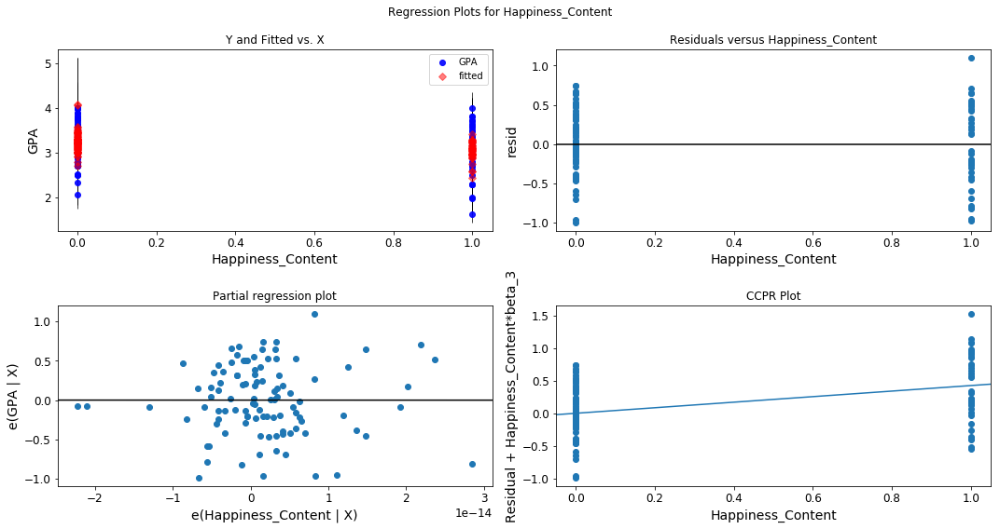

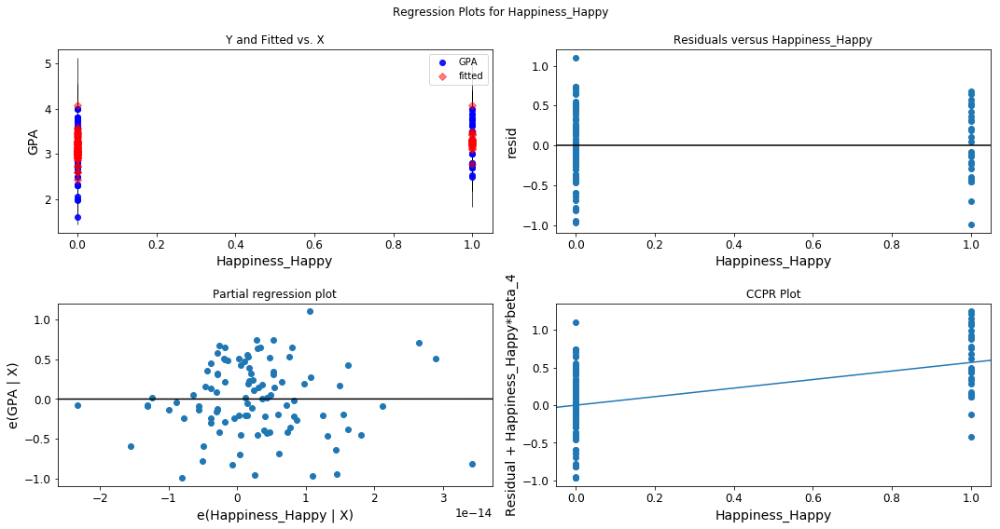

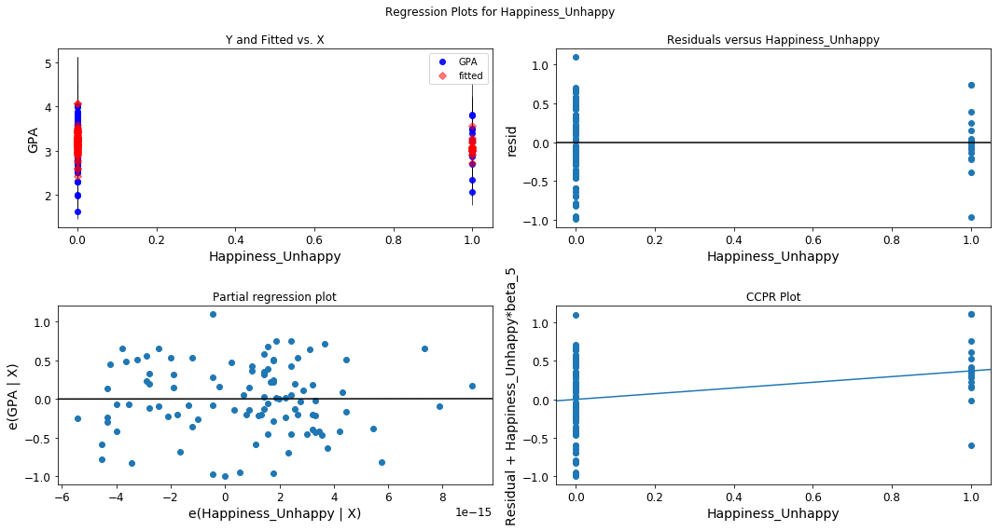

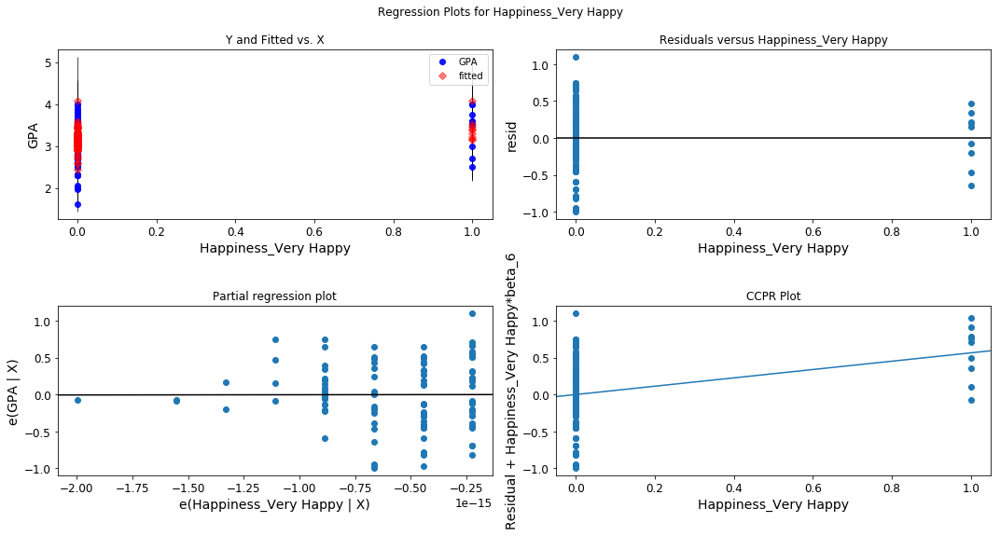

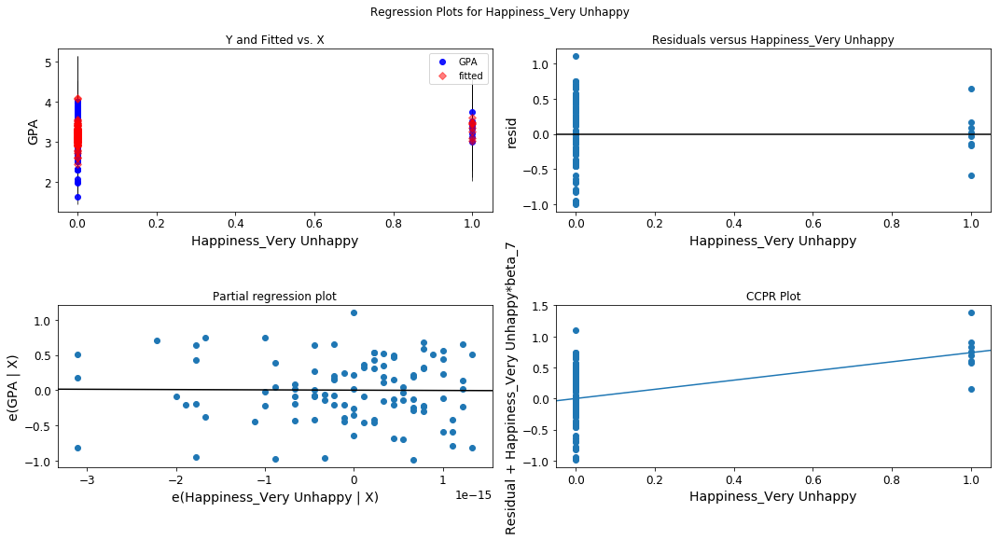

In [96]:
combined_feature_run_6 = list(x_combined_run_6)

for i in range(1, len(combined_feature_run_6)):
    fig = plt.figure(figsize=(15,8))
    combined_feature_run_6 = list(x_combined_run_6)[i]
    fig = sm.graphics.plot_regress_exog(model_combined_run_6, combined_feature_run_6, fig=fig)

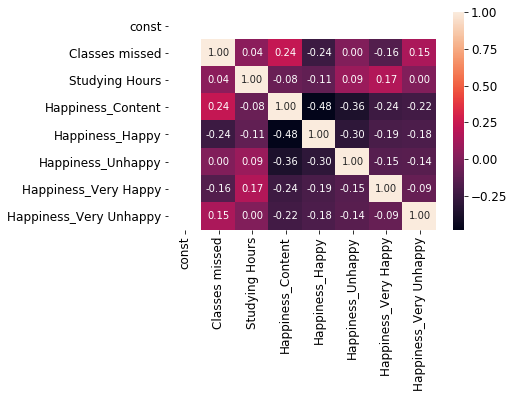

In [97]:
sns.heatmap(x_combined_run_6.corr(), annot=True, fmt=".2f")
plt.show()

In [150]:
model_combined_run_6.conf_int(alpha=0.05)

,0,1
const,2.524103,2.810658
Classes missed,-0.036930,-0.008955
Studying Hours,0.002714,0.012041
Happiness_Content,0.266765,0.583002
Happiness_Happy,0.401350,0.735796
Happiness_Unhappy,0.173593,0.566429
Happiness_Very Happy,0.290191,0.839221
Happiness_Very Unhappy,0.452241,1.026173


# Hypothesis Testing. $\alpha$ = 0.05

# Analysis of GPA between Males and Females

## Check if there exists a difference between Male GPA and Female GPA. $\sigma_{Male GPA} \neq \sigma_{Female GPA}$  and unknown

$H_0$ : $\mu_{males}$ - $\mu_{females}$ = 0

$H_A$ : $\mu_{males}$ - $\mu_{females}$ $\neq$ 0

In [98]:
st.ttest_ind(y_male, y_female, equal_var=False)

Ttest_indResult(statistic=-0.88830501314215926, pvalue=0.37650029348579206)

There does not exist statistically significat difference

## Check if there exists a difference between Variance of Male GPA and Variance of Female GPA. 

$H_0$ : $\sigma_{males}^2$ = $\sigma_{females}^2$

$H_A$ : $\sigma_{males}^2$ $\neq$ $\sigma_{females}^2$

Reject Null hypothesis if $f$ < $F_{1 - \frac{alpha}{2}, 53 - 1, 50 - 1}$ or $f$ > $F_{\frac{alpha}{2}, 53 - 1, 50 - 1}$

In [107]:
male_var = np.std(y_male)**2
female_var = np.std(y_female)**2


f =  max(male_var, female_var) / min(male_var, female_var) 
print(f)

1.3183637846675633


In [105]:
st.f.ppf(1 - 0.05/2, len(y_female) - 1, len(y_male) - 1)

1.7515103907336533

In [106]:
st.f.ppf(0.05/2, len(y_female) - 1, len(y_male) - 1)

0.57361090501494394

In [104]:
p_value = 2*(1 - st.f.cdf(f, len(y_female) - 1, len(y_male) - 1))
print(p_value)

0.331486555998


Do not reject Null Hypothesis and conclude that there does not exist statistically significant difference between Male GPA Variance and Female GPA Variance.

# Build 95% Confidence Internvals for GPA Mean Difference and Ratio of GPA Variance

## GPA Mean Difference

In [115]:
cm = sms.CompareMeans(sms.DescrStatsW(y_male), sms.DescrStatsW(y_female))
print(cm.tconfint_diff(usevar='unequal'))

(-0.28783963413812308, 0.10979435111925603)


## Ratio of GPA Variance

In [119]:
alpha = 0.05

female_var = np.std(y_female)**2
male_var = np.std(y_male)**2
ratio = female_var / male_var
f_stat = st.f.ppf(1 - alpha/2, len(y_female) - 1, len(y_male))
left = ratio / f_stat
right = ratio * f_stat
print((left, right))

(0.75553561901606636, 2.3004647629803161)


# Build 95% Confidence Interval for population mean and population variance

## Mean

In [120]:
alpha = 0.05

### Male

In [123]:
t_score_male = st.t.ppf(1 - alpha / 2, len(y_male) - 1)
s_e_male = np.std(y_male) / np.sqrt(len(y_male))
left_male = np.mean(y_male) - t_score_male * s_e_male
right_male = np.mean(y_male) + t_score_male * s_e_male
print((left_male, right_male))

(2.990660048905057, 3.2569399510949415)


### Female

In [131]:
t_score_female = st.t.ppf(1 - alpha / 2, len(y_female) - 1)
s_e_female = np.std(y_female) / np.sqrt(len(y_female))
left_female_mean = np.mean(y_female) - t_score_female * s_e_female
right_female_mean = np.mean(y_female) + t_score_female * s_e_female
print((left_female_mean, right_female_mean))

(3.0645572597092681, 3.3610880233096028)


## Variance

### Male

In [134]:
chi_sq_male_left = st.chi2.ppf(1 - alpha/2, df = len(y_male))
chi_sq_male_right = st.chi2.ppf(alpha/2, df = len(y_male))
left_male_var = (len(y_male) - 1) * np.std(y_male)**2 / chi_sq_male_left
right_male_var = (len(y_male) - 1) * np.std(y_male)**2 / chi_sq_male_right
print((left_male_var, right_male_var))

(0.15057514771229896, 0.33235422209142651)


### Female

In [135]:
chi_sq_female_left = st.chi2.ppf(1 - alpha/2, df = len(y_female))
chi_sq_female_right = st.chi2.ppf(alpha/2, df = len(y_female))
left_female_var = (len(y_female) - 1) * np.std(y_female)**2 / chi_sq_female_left
right_female_var = (len(y_female) - 1) * np.std(y_female)**2 / chi_sq_female_right
print((left_female_var, right_female_var))

(0.20060640721916939, 0.43264643321608598)
